# Real-time matched-filter viability for rapid aftershock characterisation

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
import logging

from obspy.clients.fdsn import Client
from obspy import read_events, UTCDateTime, Stream
from obspy.core.event import Catalog
from obspy.geodetics import degrees2kilometers

from obsplus import WaveBank

from eqcorrscan import Tribe, Party

from rt_eqcorrscan.console_scripts.simulation import synthesise_real_time
from rt_eqcorrscan.reactor.reactor import estimate_region

from plots import aftershock_map

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s\t%(name)s\t%(levelname)s\t%(message)s")

For this experiment we test on a few moderate magnitude earthquakes around New Zealand of interest. We started off with Eketahuna as a relatively simple earthquake with good station coverage.

In [2]:
quakes = {
    "Darfield": "3366146",
    "Christchurch": "3468575",
    "Eketahuna": "2014p051675",
    "Cook Strait 1": "2013p543824",
    "Lake Grassmere": "2013p613797",
    "East Cape": "2021p169083",
    "Te Araroa": "2016p661400",
    "Dusky Sound": "3124785",
    "Lake Coleridge": "2015p012816",
    "Wanaka": "2015p332712",
    "Bligh Sound": "2808298",
    "Gisborne": "2839343",
    "Kaikōura": "2016p858000",
}

Construct the required directory tree for the following code.

In [3]:
earthquake = "Eketahuna"

assert earthquake in quakes.keys()
data_dir = f"{earthquake}/data"
real_time_dir = f"{earthquake}/rt_out"
postmortem_dir = f"{earthquake}/post"


for _dir in [data_dir, real_time_dir, postmortem_dir]:
    if not os.path.isdir(_dir):
        os.makedirs(_dir)

## Post-hoc, science-type matched-filter analysis

We limit ourselves to look at only the first week of aftershocks, and for the post-hoc analysis we use templates up to the end of that week.

In [4]:
client = Client("GEONET")

# TODO: Set to a year before, just running at 0 for testing
pre_event = 0 * 86400  # Pre-event time in seconds to collect templates for
post_event = 7 * 86400   # Post-event time in seconds to collect templates for

mainshock = client.get_events(eventid=quakes[earthquake])[0]

# Estimate source region using Wells and Coppersmith relation with a 2x multiplier to extend source region
template_region = estimate_region(
    event=mainshock,
    min_length=50,
    scaling_relation="wells_coppersmith_subsurface",
    multiplier=2.0,
)

# Threshold the depths
mainshock_depth = (mainshock.preferred_origin() or mainshock.origins[-1]).depth / 1000.
radius_km = degrees2kilometers(template_region["maxradius"])

mainshock_origin = mainshock.preferred_origin() or mainshock.origins[-1]
template_region.update(
    {"starttime": mainshock_origin.time - pre_event,
     "endtime": mainshock_origin.time + post_event,
     "maxdepth": mainshock_depth + radius_km}
)

In [5]:
download_template_cat = False

if download_template_cat:
    print(f"Downloading events in region: {template_region}")
    template_catalog = client.get_events(**template_region)
    template_catalog.write(f"{data_dir}/template_catalog.xml", format="QUAKEML")
else:
    template_catalog = read_events(f"{data_dir}/template_catalog.xml")

grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from 175.621584 to 175.620833333
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 176.109936 to 176.110833333
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -40.821801 to -40.8225
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from -40.371594 to -40.3708333333
grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief original at 15x15 arc seconds [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 10x10 degree grid tile (earth_relief_15s_p): S50E170


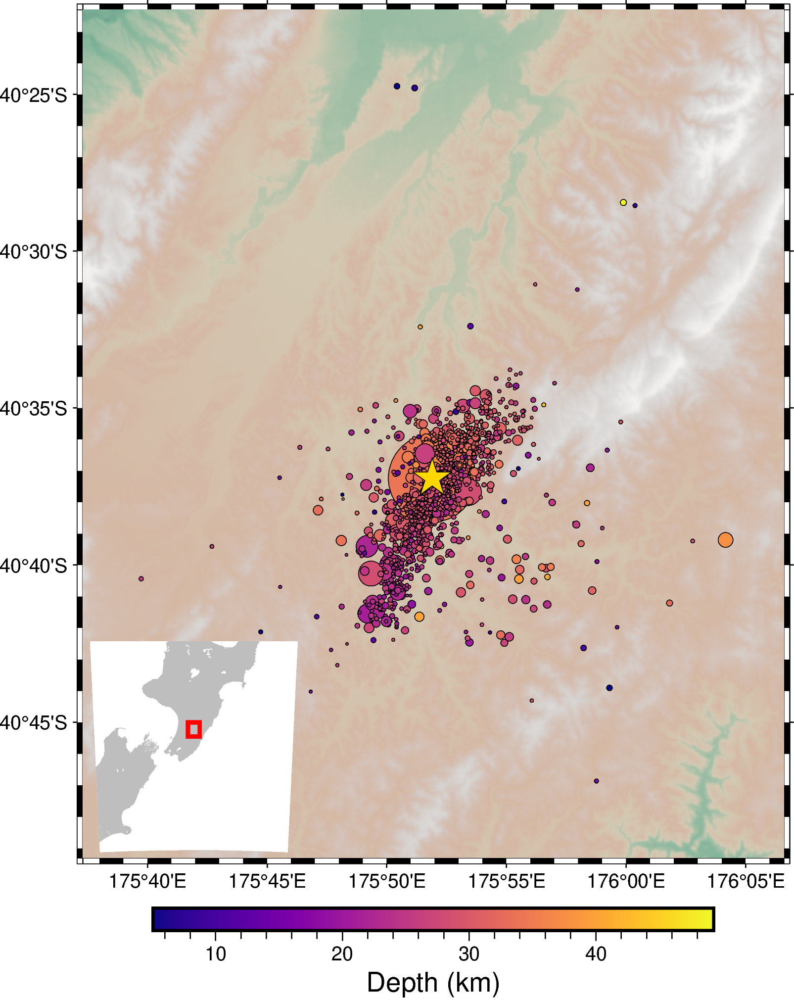

In [6]:
fig = aftershock_map(
    catalog=template_catalog, mainshock=mainshock, width=12, 
    topo_res="03s", topo_cmap="terra", hillshade=False)
fig.show()
# TODO: Plot NZAFD

### Select templates

We select automatic and manual picks, the automatic picks are variable in quality, but so are the manual picks, but we have to use something. We select only stations within 1.2 degrees of the event, and events with at least five stations picked.

We will use a catalogue of 1275 events as templates


grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from 175.621584 to 175.620833333
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 176.109936 to 176.110833333
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -40.821801 to -40.8225
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from -40.371594 to -40.3708333333


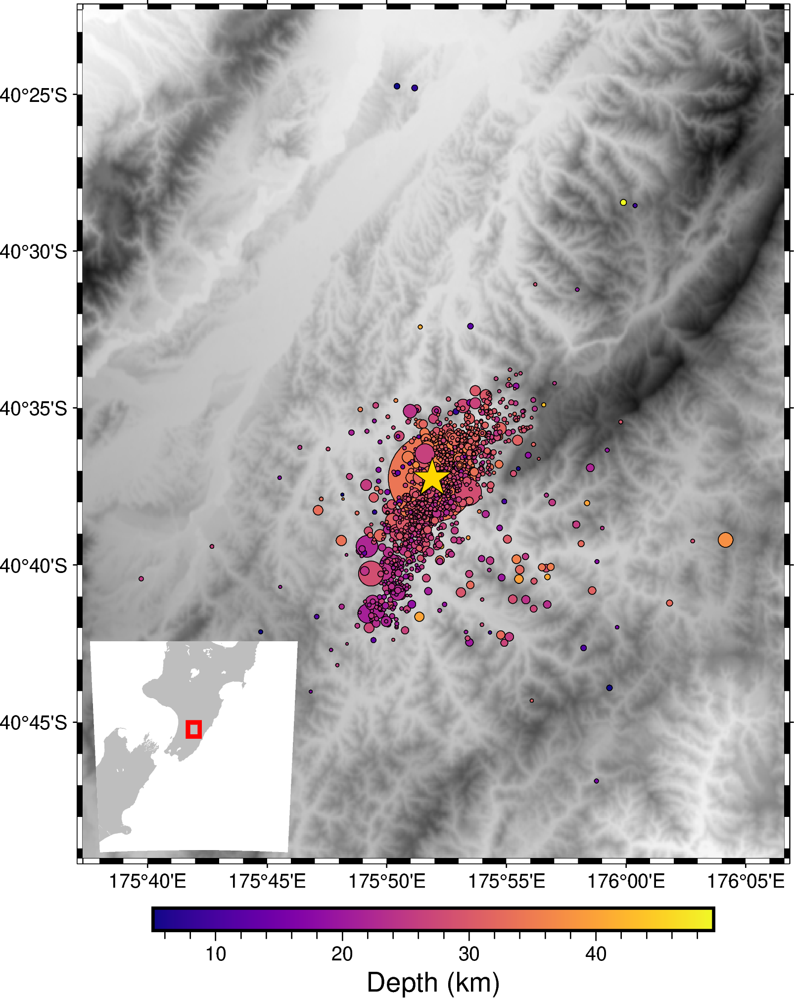

In [7]:
max_pick_distance = 1.2  # Maximum epicentral distance in degrees between station and origin
min_picked_stations = 5  # Minimum number of stations required to make a template
accepted_pick_evaluation_mode = ("manual", "automatic")  # Accepted pick evaluation modes, can be ("automatic", "manual")
accepted_phase_hints = ["P", "S", "Pg", "Pn", "Sg", "Sn"]  # Only include body wave phases at regional distance
accepted_channels = [
    "EHZ", "EH1", "EH2", "EHN", "EHE",
    "SHZ", "SH1", "SH2", "SHN", "SHE",
    "HHZ", "HH1", "HH2", "HHN", "HHE",
]  # Only use weak-motion data - the NZ strong-motion instruments have questionable timing.

used_template_catalog = Catalog()
for event in template_catalog:
    _event = event.copy()
    # Remove picks at sites greater than max_pick_distance
    ori = _event.preferred_origin() or _event.origins[-1]
    _picks, _arrivals = [], []
    for pick in _event.picks:
        arr = [_arr for _arr in ori.arrivals if _arr.pick_id == pick.resource_id]
        if len(arr) == 0:
            print(f"No arrival for {pick.phase_hint} pick on "
                  f"{pick.waveform_id.get_seed_string()} - removing")
            continue
        elif len(arr) > 1:
            print(f"Multiple arrivals for {pick.phase_hint} pick on "
                  f"{pick.waveform_id.get_seed_string()} - using zeroth")
        arr = arr[0]
        if arr.distance <= max_pick_distance:
            # Keep these ones
            _picks.append(pick)
            _arrivals.append(arr)
    _event.picks = _picks
    ori.arrivals = _arrivals
    # Remove picks that do not match evaluation criteria
    _event.picks = [p for p in _event.picks 
                    if p.evaluation_mode in accepted_pick_evaluation_mode 
                    and p.phase_hint in accepted_phase_hints
                    and p.waveform_id.channel_code in accepted_channels]
    used_pick_ids = {p.resource_id for p in _event.picks}
    ori.arrivals = [arr for arr in ori.arrivals if arr.pick_id in used_pick_ids]
    
    # Only keep events with more than min_picks
    if len(_event.picks) >= min_picked_stations:
        used_template_catalog.append(_event)
print(f"We will use a catalogue of {len(used_template_catalog)} events as templates")

fig = aftershock_map(
    catalog=used_template_catalog, mainshock=mainshock, width=12, topo_res="03s",
    topo_cmap="grayC")
fig.show()

### Get data

To avoid downloading multiple times we will get data once now and re-use this later.

/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obspy/io/stationxml/core.py:96: UserWarning: The StationXML file has version 1, ObsPy can read versions (1.0, 1.1). Proceed with caution.
  warnings.warn("The StationXML file has version %s, ObsPy can "


Templates will be made from 33 stations


grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from 172.231481388 to 172.225
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from 177.298894419 to 177.308333333
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -44.1283660963 to -44.1333333333
grdcut [WARNING]: (n - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: n reset from -38.9844645187 to -38.975
grdblend [NOTICE]: Remote data courtesy of GMT data server oceania [http://oceania.generic-mapping-tools.org]
grdblend [NOTICE]: SRTM15 Earth Relief at 30x30 arc seconds reduced by Gaussian Cartesian filtering (1 km fullwidth) [Tozer et al., 2019].
grdblend [NOTICE]:   -> Download 15x15 degree grid tile (earth_relief_30s_p): S45E165


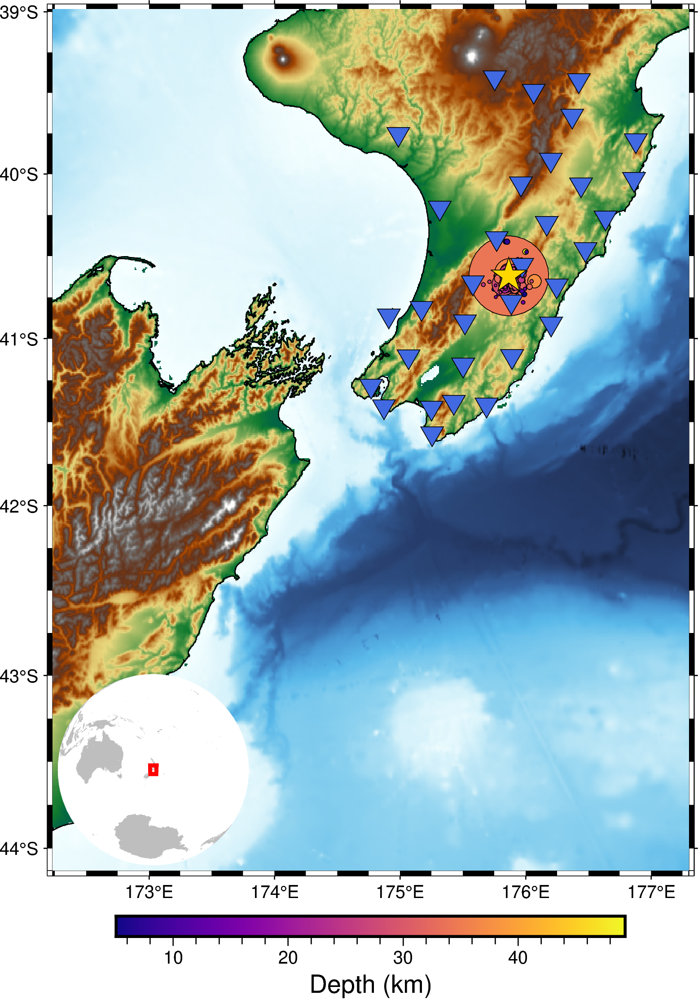

In [8]:
bulk = list({tuple(pick.waveform_id.get_seed_string().split('.')) 
             for event in used_template_catalog 
             for pick in event.picks})
bulk = [(b[0], b[1], b[2], f"{b[3][0:2]}?", mainshock_origin.time, mainshock_origin.time + post_event) for b in bulk]

inv = client.get_stations_bulk(bulk)

stations = {sta.code for net in inv for sta in net}
print(f"Templates will be made from {len(stations)} stations")

fig = aftershock_map(
    catalog=used_template_catalog, 
    mainshock=mainshock, 
    width=12, 
    topo_res="30s", 
    inventory=inv,
    inset_multiplier=2,
)
fig.show()

In [9]:
wavebank = WaveBank(base_path=f"{data_dir}/waveforms")

wavestart, waveend = (
    UTCDateTime(mainshock_origin.time.date), 
    UTCDateTime((mainshock_origin.time + post_event + 86400).date))
date = wavestart
while date <= waveend:
    st = Stream()
    print(f"Downloading for {date.date}")
    for b in bulk:
        net, sta, loc, chan, _, _ = b
        try:
            bank_st = wavebank.get_waveforms(
                network=net, station=sta, location=loc, channel=chan,
                starttime=date, endtime=date + 86400)
        except Exception as e:
            bank_st = None
            pass
        if bank_st:
            continue
        print(f"Requesting on {net}.{sta}.{loc}.{chan}\t\t", end="\r")
        try:
            st += client.get_waveforms(
                network=net, station=sta, location=loc, channel=chan,
                starttime=date, endtime=date + 86400)
        except Exception as e:
            print(f"Failed due to {e}")
    print("\nWriting waveforms")
    wavebank.put_waveforms(st)
    date += 86400


Writing waveforms

Writing waveforms

Writing waveforms

Writing waveforms

Writing waveforms

Writing waveforms

Writing waveforms

Writing waveforms

Writing waveforms


In [10]:
tribe = Tribe().construct(
    method="from_client", lowcut=2.0, highcut=15.0, samp_rate=50.0, length=4.0,
    filt_order=4, prepick=0.5, client_id=wavebank, catalog=used_template_catalog,
    data_pad=20., process_len=86400, min_snr=2.0, parallel=True, swin="all",
)

2022-08-05 09:58:03,287	eqcorrscan.core.template_gen	INFO	Downloading data
2022-08-05 09:58:03,307	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:03,398	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:03,461	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:03,523	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:03,611	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:03,702	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09

2022-08-05 09:58:07,694	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:07,783	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:07,870	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:07,950	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:08,040	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:08,128	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-20T02:52:25.984899Z end-time: 2014-01-21T02:52:25.984899Z
2022-08-05 09:58:08,214	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 20

2022-08-05 09:58:42,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:42,131	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 09:58:42,134	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:42,135	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHE
2022-08-05 09:58:42,138	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHE | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:42,139	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 09:58:42,142	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:42,143	eqcorrscan.core.template_gen	I

2022-08-05 09:58:46,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:46,115	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 09:58:46,118	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:46,119	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 09:58:46,123	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:46,124	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHN
2022-08-05 09:58:46,127	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHN | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:46,128	eqcorrscan.core.template_gen	INFO

2022-08-05 09:58:48,142	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:48,143	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.32793419367837906 below threshold for ANWZ.EHZ, not using
2022-08-05 09:58:48,143	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 09:58:48,143	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 09:58:48,146	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:48,147	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.559258313118754 below threshold for BFZ.HHN, not using
2022-08-05 09:58:48,148	eqcorrscan.core.template_gen	WARNING	No pick for NZ.BFZ.10.HHN
2022-08-05 09:58:48,148	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 09:58:48,151	eqcor

2022-08-05 09:58:48,226	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.5675419449762955 below threshold for TSZ.HHZ, not using
2022-08-05 09:58:48,226	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 09:58:50,119	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 09:58:50,122	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:50,123	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.8530822005589784 below threshold for ANWZ.EHZ, not using
2022-08-05 09:58:50,124	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 09:58:50,124	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 09:58:50,127	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:50,128	eqco

2022-08-05 09:58:52,178	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 09:58:52,182	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:52,183	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 09:58:52,187	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:52,189	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 09:58:52,192	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:52,193	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 09:58:52,196	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 09:58:56,065	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:56,067	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 09:58:56,070	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:56,071	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 09:58:56,075	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:56,076	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHN
2022-08-05 09:58:56,079	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:56,080	eqcorrscan.core.template_gen	I

2022-08-05 09:58:58,149	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.9912985474684466 below threshold for KIW.EHZ, not using
2022-08-05 09:58:58,149	eqcorrscan.core.template_gen	WARNING	No pick for NZ.KIW.10.EHZ
2022-08-05 09:58:58,149	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 09:58:58,152	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:58:58,153	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.822677864718609 below threshold for MRZ.HHZ, not using
2022-08-05 09:58:58,154	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.217058618523614 below threshold for MRZ.HHZ, not using
2022-08-05 09:58:58,154	eqcorrscan.core.template_gen	WARNING	No pick for NZ.MRZ.10.HHZ
2022-08-05 09:58:58,155	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHN
2022-08-05 09:58:58,158	eqcorrscan.core.template_gen	INFO	Found 

2022-08-05 09:58:58,226	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 09:58:58,228	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 09:58:58,229	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 09:58:58,233	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:00,182	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHN
2022-08-05 09:59:00,185	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHN | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:00,187	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.7446558888615362 below threshold for ANWZ.EHN, not using
2022-08-05 09:59:00,187	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHN


2022-08-05 09:59:02,165	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 09:59:02,168	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:02,168	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 09:59:02,171	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:02,172	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 09:59:02,175	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:02,176	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 09:59:02,179	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 09:59:04,139	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 09:59:04,143	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:04,144	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHN
2022-08-05 09:59:04,147	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:04,148	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 09:59:04,151	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:04,152	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 09:59:04,155	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.96839

2022-08-05 09:59:07,972	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:07,973	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 09:59:07,976	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:07,977	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 09:59:07,980	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:07,981	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHN
2022-08-05 09:59:07,984	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHN | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:07,985	eqcorrscan.core.template_gen	INFO

2022-08-05 09:59:09,925	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 09:59:09,928	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:09,929	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 09:59:09,933	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:09,934	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHN
2022-08-05 09:59:09,937	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHN | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:09,939	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 09:59:09,942	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z |

2022-08-05 09:59:11,976	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 09:59:11,979	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:11,980	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHN
2022-08-05 09:59:11,983	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHN | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:11,984	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 09:59:11,987	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:11,987	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 09:59:11,991	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 09:59:13,969	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 09:59:13,973	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:13,973	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 09:59:13,977	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:13,978	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 09:59:13,981	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:13,982	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 09:59:13,985	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 09:59:15,984	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHE
2022-08-05 09:59:15,987	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHE | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:15,988	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 09:59:15,991	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:15,993	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 09:59:15,996	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:15,997	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 09:59:16,001	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968

2022-08-05 09:59:17,983	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 09:59:17,987	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:17,987	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 09:59:17,990	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:17,991	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 09:59:17,994	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:17,995	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 09:59:17,999	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 09:59:20,000	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 09:59:20,003	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:20,004	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 09:59:20,007	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:20,008	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 09:59:20,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:20,013	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHN
2022-08-05 09:59:20,017	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHN | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968

2022-08-05 09:59:23,817	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 09:59:23,820	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:23,821	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 09:59:23,824	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:23,824	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 09:59:23,827	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:23,829	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 09:59:23,832	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.96839

2022-08-05 09:59:25,805	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:25,806	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 09:59:25,809	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:25,810	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 09:59:25,813	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:25,814	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 09:59:25,817	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:25,818	eqcorrscan.core.template_gen	I

2022-08-05 09:59:29,646	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 09:59:29,649	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:29,650	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 09:59:29,653	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 09:59:31,519	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 09:59:31,523	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:31,524	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 09:59:31,527	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 09:59:35,284	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,285	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 09:59:35,288	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,289	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 09:59:35,292	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,293	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 09:59:35,296	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,297	eqcorrscan.core.template_gen	INFO	

2022-08-05 09:59:35,420	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,420	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 09:59:35,423	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 09:59:35,424	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 09:59:35,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,428	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 09:59:35,432	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:35,433	eqcorrscan.core.template_gen	INFO	Wo

2022-08-05 09:59:37,385	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:37,386	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHN
2022-08-05 09:59:37,389	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:37,390	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 09:59:37,393	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:37,394	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 09:59:37,397	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:37,398	eqcorrscan.core.template_gen	IN

2022-08-05 09:59:41,219	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:41,220	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHE
2022-08-05 09:59:41,224	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHE | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:41,225	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 09:59:41,228	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:41,229	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHE
2022-08-05 09:59:41,232	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHE | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:41,232	eqcorrscan.core.template_gen	I

2022-08-05 09:59:43,229	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:43,230	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHN
2022-08-05 09:59:43,233	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHN | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:43,234	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 09:59:43,237	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:43,238	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHN
2022-08-05 09:59:43,242	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHN | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:43,243	eqcorrscan.core.template_gen	I

2022-08-05 09:59:45,248	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:45,249	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.8294852418741552 below threshold for BHHZ.EHZ, not using
2022-08-05 09:59:45,250	eqcorrscan.core.template_gen	WARNING	No pick for NZ.BHHZ.10.EHZ
2022-08-05 09:59:45,250	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 09:59:45,253	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:45,254	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.7148552562667544 below threshold for CPWZ.EHZ, not using
2022-08-05 09:59:45,254	eqcorrscan.core.template_gen	WARNING	No pick for NZ.CPWZ.10.EHZ
2022-08-05 09:59:45,254	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 09:59:45,258	e

2022-08-05 09:59:47,257	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:47,258	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 09:59:47,261	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:47,262	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 09:59:47,265	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:47,266	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 09:59:47,270	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:47,270	eqcorrscan.core.template_gen	INF

2022-08-05 09:59:51,064	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 09:59:51,067	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:51,068	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 09:59:51,071	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:51,072	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 09:59:51,075	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:51,077	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 09:59:51,080	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 09:59:56,890	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 09:59:56,894	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:56,895	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHE
2022-08-05 09:59:56,898	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:56,899	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 09:59:56,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 09:59:56,903	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHN
2022-08-05 09:59:56,906	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHN | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:00:00,782	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:00:00,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:00,787	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:00:00,790	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:00,791	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:00:00,794	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:00,795	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:00:00,798	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:00:04,569	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHN
2022-08-05 10:00:04,572	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHN | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:04,573	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:00:04,576	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:04,577	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHN
2022-08-05 10:00:04,580	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHN | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:04,581	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:04,584	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968

2022-08-05 10:00:06,540	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:00:06,543	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:06,544	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:00:06,548	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:06,549	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:00:06,553	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:06,553	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:00:06,557	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:00:06,673	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:00:06,676	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:08,517	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHN
2022-08-05 10:00:08,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHN | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:08,521	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:00:08,525	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:08,525	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:00:08,528	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.95995

2022-08-05 10:00:10,488	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:10,489	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:00:10,492	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:10,493	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.6350808040424076 below threshold for TIWZ.EHZ, not using
2022-08-05 10:00:10,493	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:00:12,372	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:00:12,375	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:12,377	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.H

2022-08-05 10:00:12,501	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:00:12,502	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:00:12,505	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:12,506	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:00:12,509	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:14,384	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:00:14,388	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:14,389	eqcorrscan.core.template_gen	INFO

2022-08-05 10:00:14,507	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:14,508	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0309623878436158 below threshold for TIWZ.EHZ, not using
2022-08-05 10:00:14,508	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:00:14,508	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:00:14,511	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:14,512	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHE
2022-08-05 10:00:14,515	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:14,516	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.

2022-08-05 10:00:16,511	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:00:16,514	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:16,515	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:00:16,518	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:16,520	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:00:16,523	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:16,524	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:00:16,527	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:00:18,512	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:00:18,515	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:18,516	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:00:18,519	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:18,520	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:00:18,523	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:18,524	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:00:18,527	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z

2022-08-05 10:00:22,426	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHN
2022-08-05 10:00:22,429	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHN | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:22,430	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:22,433	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:22,434	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHN
2022-08-05 10:00:22,437	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHN | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:22,438	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:00:22,442	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z

2022-08-05 10:00:24,428	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:00:24,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:24,433	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:00:24,436	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:24,437	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:24,440	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:24,441	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:00:24,444	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968

2022-08-05 10:00:26,434	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:00:26,437	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:26,438	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:00:26,441	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:26,442	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHE
2022-08-05 10:00:26,445	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHE | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:26,446	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:00:26,449	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z |

2022-08-05 10:00:28,397	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.107565651839173 below threshold for MRZ.HHZ, not using
2022-08-05 10:00:28,397	eqcorrscan.core.template_gen	WARNING	No pick for NZ.MRZ.10.HHZ
2022-08-05 10:00:28,397	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:00:28,400	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:28,401	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.8924250724732123 below threshold for MTW.EHZ, not using
2022-08-05 10:00:28,401	eqcorrscan.core.template_gen	WARNING	No pick for NZ.MTW.10.EHZ
2022-08-05 10:00:28,402	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:00:28,405	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:28,406	eqcorrs

2022-08-05 10:00:32,292	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:32,295	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:32,296	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:00:32,299	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:32,300	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:00:32,303	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:32,304	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:00:32,307	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:00:34,297	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:00:34,300	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:34,301	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:00:34,304	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:34,305	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:00:34,308	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:34,309	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:34,312	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:00:36,387	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:00:36,390	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:36,390	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.7097495099029103 below threshold for KIW.EHZ, not using
2022-08-05 10:00:36,391	eqcorrscan.core.template_gen	WARNING	No pick for NZ.KIW.10.EHZ
2022-08-05 10:00:36,391	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:00:36,394	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:36,395	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:00:36,399	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples


2022-08-05 10:00:40,347	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:40,348	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:00:40,351	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:40,352	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:00:40,355	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:40,356	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:40,359	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:40,360	eqcorrscan.core.template_gen	IN

2022-08-05 10:00:42,349	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:42,350	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:00:42,353	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:42,354	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:00:42,358	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:42,359	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:00:42,362	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:42,362	eqcorrscan.core.template_gen	INFO

2022-08-05 10:00:46,167	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:46,168	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:00:46,171	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:46,172	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:00:46,175	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:46,176	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:00:46,179	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:46,179	eqcorrscan.core.template_gen	IN

2022-08-05 10:00:48,123	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:48,124	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:00:48,127	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:48,128	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:00:48,131	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:48,132	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:00:48,135	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:48,136	eqcorrscan.core.template_gen	INFO

2022-08-05 10:00:50,122	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:50,123	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:00:50,126	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:50,127	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:00:50,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:50,131	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:00:50,135	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:50,136	eqcorrscan.core.template_gen	I

2022-08-05 10:00:52,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:52,108	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:00:52,111	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:52,112	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:00:52,115	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:52,116	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:00:52,119	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:52,120	eqcorrscan.core.template_gen	INF

2022-08-05 10:00:55,942	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:00:55,945	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:55,946	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.6200545178593448 below threshold for BFZ.HHZ, not using
2022-08-05 10:00:55,946	eqcorrscan.core.template_gen	WARNING	No pick for NZ.BFZ.10.HHZ
2022-08-05 10:00:55,947	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:00:55,950	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:55,951	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:00:55,954	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
20

2022-08-05 10:00:57,917	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:00:57,920	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:57,922	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:00:57,926	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:57,927	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:00:57,930	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:57,931	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:00:57,934	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:00:59,898	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:00:59,901	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:59,902	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:00:59,906	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:59,907	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:00:59,910	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:00:59,911	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:00:59,914	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:01:03,795	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:01:03,798	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:03,799	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:01:03,802	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:03,803	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:01:03,806	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:03,807	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:01:03,810	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:01:05,756	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:01:05,759	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:05,760	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:01:05,763	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:05,764	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHE
2022-08-05 10:01:05,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHE | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:05,768	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:01:05,771	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.96762

2022-08-05 10:01:07,743	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:01:07,746	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:07,747	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:01:07,751	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:07,752	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:01:07,754	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:01:07,755	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:01:07,758	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:01:11,756	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:01:11,759	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:11,760	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:01:11,763	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:11,764	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:01:11,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:11,768	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:01:11,772	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:01:15,727	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:01:15,731	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:15,732	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:01:15,735	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:15,736	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:01:15,740	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:15,740	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:01:15,743	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:01:17,697	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:01:17,700	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:17,701	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:01:17,704	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:17,705	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:01:17,709	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:17,710	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:01:17,713	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z

2022-08-05 10:01:19,675	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:19,676	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.6482568668330868 below threshold for TMWZ.EHZ, not using
2022-08-05 10:01:19,677	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TMWZ.10.EHZ
2022-08-05 10:01:21,536	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:01:21,539	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:21,540	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:01:21,543	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:21,544	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ


2022-08-05 10:01:23,494	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:23,495	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:01:23,498	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:23,500	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:01:23,503	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:23,504	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:01:23,507	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:23,508	eqcorrscan.core.template_gen	I

2022-08-05 10:01:25,498	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:27,361	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:01:27,364	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:27,365	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:01:27,369	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:27,370	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.1161911062676793 below threshold for CPWZ.EHZ, not using
2022-08-05 10:01:27,370	eqcorrscan.core.template_gen	WARNING	No pick for NZ.CPWZ.10.EHZ
2022-08-05 10:01:27,370	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EH

2022-08-05 10:01:29,329	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:01:29,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:29,333	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:01:29,337	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:29,338	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:01:29,341	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:29,342	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:01:29,345	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968

2022-08-05 10:01:33,228	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHE
2022-08-05 10:01:33,231	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHE | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:33,232	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:01:33,235	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:33,236	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:01:33,240	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:33,241	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:01:33,244	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.96839

2022-08-05 10:01:35,269	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHN
2022-08-05 10:01:35,273	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHN | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:35,274	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:01:35,277	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:35,277	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHN
2022-08-05 10:01:35,281	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHN | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:35,282	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:01:35,285	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968

2022-08-05 10:01:37,238	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:37,239	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:01:37,242	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:37,243	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:01:37,246	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:37,247	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:01:37,250	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:37,251	eqcorrscan.core.template_gen	I

2022-08-05 10:01:39,206	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHE | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:01:39,207	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:01:39,210	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:41,056	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:01:41,060	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:41,061	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 10:01:41,065	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:41,066	eqcorrscan.core.template_gen	INFO

2022-08-05 10:01:41,185	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:41,186	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:01:41,188	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:41,189	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:01:41,193	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:41,194	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:01:41,197	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:01:41,198	eqcorrscan.core.template_gen	INF

2022-08-05 10:01:43,157	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:43,157	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.8769135845929062 below threshold for WPHZ.EHZ, not using
2022-08-05 10:01:43,158	eqcorrscan.core.template_gen	WARNING	No pick for NZ.WPHZ.10.EHZ
2022-08-05 10:01:45,030	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:01:45,034	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:45,036	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:01:45,039	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:45,040	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EH

2022-08-05 10:01:47,031	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:47,032	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:01:47,035	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:47,036	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:01:47,039	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:47,040	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:01:47,043	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:47,044	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:01:49,069	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:49,070	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:01:49,072	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:01:49,073	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:01:49,077	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:49,077	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:01:49,081	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:50,918	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:01:51,042	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:51,043	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHN
2022-08-05 10:01:51,047	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:51,048	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:01:51,051	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:51,052	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHE
2022-08-05 10:01:51,056	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:51,057	eqcorrscan.core.template_gen	IN

2022-08-05 10:01:53,040	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:53,041	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:01:53,044	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:53,046	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:01:53,050	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:53,051	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:01:53,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:53,055	eqcorrscan.core.template_gen	I

2022-08-05 10:01:55,038	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:55,039	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:01:55,042	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:55,043	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:01:55,047	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:55,048	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHE
2022-08-05 10:01:55,051	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:55,052	eqcorrscan.core.template_gen	I

2022-08-05 10:01:58,889	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:58,889	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:01:58,893	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:58,894	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:01:58,897	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:58,898	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:01:58,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:01:58,903	eqcorrscan.core.template_gen	INFO

2022-08-05 10:02:00,878	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:00,879	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:00,882	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:00,883	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:02:00,886	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:00,887	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:02:00,890	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:00,891	eqcorrscan.core.template_gen	I

2022-08-05 10:02:04,704	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:04,705	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:02:04,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:04,709	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:02:04,712	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:04,713	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:02:04,716	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:04,718	eqcorrscan.core.template_gen	INF

2022-08-05 10:02:06,701	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:06,702	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:02:06,705	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:06,706	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:06,709	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:06,710	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:02:06,713	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:06,714	eqcorrscan.core.template_gen	I

2022-08-05 10:02:10,543	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:10,544	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:02:10,547	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:10,548	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:02:10,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:10,553	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:02:10,556	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:10,557	eqcorrscan.core.template_gen	INF

2022-08-05 10:02:12,540	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:12,541	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:02:12,545	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:12,545	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:02:12,548	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:12,550	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHE
2022-08-05 10:02:12,553	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:12,554	eqcorrscan.core.template_gen	I

2022-08-05 10:02:14,550	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHN | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:14,551	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:14,554	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:14,555	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:02:14,559	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:14,560	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHN
2022-08-05 10:02:14,563	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:14,564	eqcorrscan.core.template_gen	I

2022-08-05 10:02:16,547	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:16,548	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:02:16,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:02:16,552	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:02:16,555	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:18,414	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:02:18,417	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:18,418	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:02:18,539	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:18,540	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:02:18,543	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:18,544	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:02:18,547	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:18,548	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:02:18,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:20,420	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:02:20,522	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:02:20,525	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:20,527	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:02:20,530	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:20,532	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:02:20,535	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:20,536	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:02:20,539	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968

2022-08-05 10:02:24,337	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:24,338	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.3455323083964188 below threshold for KIW.EHZ, not using
2022-08-05 10:02:24,338	eqcorrscan.core.template_gen	WARNING	No pick for NZ.KIW.10.EHZ
2022-08-05 10:02:24,338	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:02:24,342	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:24,343	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:24,346	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:24,347	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2

2022-08-05 10:02:30,038	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:02:30,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:30,042	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:02:30,045	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:30,046	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:02:30,050	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:30,051	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:02:30,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.96839

2022-08-05 10:02:33,874	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:02:33,877	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:33,878	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:02:33,881	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:33,882	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:02:33,886	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:33,887	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:02:33,890	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:02:35,863	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:02:35,867	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:35,868	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHN
2022-08-05 10:02:35,871	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHN | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:35,872	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:35,875	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:35,876	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:02:35,879	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968

2022-08-05 10:02:37,850	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHN
2022-08-05 10:02:37,854	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHN | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:37,855	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:37,858	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:37,859	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:02:37,862	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:37,863	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:02:37,866	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:02:39,875	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:02:39,877	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:02:39,878	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:02:39,881	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:39,882	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:02:39,886	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:41,710	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:02:41,713	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z

2022-08-05 10:02:43,664	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:02:43,668	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:43,669	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:02:43,672	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:43,673	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:02:43,677	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:43,678	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:02:43,681	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z

2022-08-05 10:02:45,628	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0788021655571831 below threshold for TIWZ.EHZ, not using
2022-08-05 10:02:45,628	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:02:47,466	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:02:47,469	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:47,470	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:02:47,473	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:47,475	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:02:47,478	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 sample

2022-08-05 10:02:51,302	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:02:51,305	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:51,306	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:02:51,309	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:51,311	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:02:51,314	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:51,314	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:02:51,317	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:02:53,317	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:02:53,320	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:53,321	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:02:53,324	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:53,325	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:02:53,329	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:53,330	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:02:53,333	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z

2022-08-05 10:02:55,298	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:02:55,301	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:55,302	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:02:55,305	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:55,305	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:02:55,309	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:55,310	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:02:55,313	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.96839

2022-08-05 10:02:57,306	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:02:57,310	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:57,311	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:02:57,314	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:57,315	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHN
2022-08-05 10:02:57,318	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:57,319	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:02:57,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:02:59,311	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:02:59,314	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:02:59,315	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:02:59,318	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:02:59,319	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:02:59,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:01,200	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:03:01,203	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z

2022-08-05 10:03:03,205	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:03:03,208	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:03,209	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:03:03,212	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:03,213	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:03:03,216	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:03,217	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:03:03,220	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:03:05,222	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:03:05,225	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:05,226	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:03:05,229	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:05,230	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:03:05,234	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:03:05,235	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:03:05,238	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:03:07,206	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:03:07,209	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:07,210	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:03:07,213	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:07,214	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:03:07,218	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:07,219	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:03:07,222	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.96838

2022-08-05 10:03:11,042	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:03:11,045	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:11,047	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:03:11,050	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:11,051	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:03:11,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:11,055	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:03:11,058	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z

2022-08-05 10:03:13,017	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:03:13,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:13,021	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:03:13,024	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:13,025	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:03:13,028	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:13,029	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:03:13,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968

2022-08-05 10:03:15,035	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:03:15,038	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:15,039	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:03:15,042	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:15,043	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:03:15,046	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:03:15,047	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:03:15,051	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:03:19,100	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:03:19,103	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:19,104	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:03:19,107	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:19,108	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:03:19,111	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:19,112	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:03:19,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968

2022-08-05 10:03:22,955	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:03:22,958	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:22,960	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:03:22,963	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:22,964	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:03:22,967	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:22,968	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:03:22,971	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:03:26,824	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:03:26,827	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:26,828	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:03:26,831	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:26,832	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:03:26,835	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:26,836	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:03:26,840	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:03:26,955	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:03:26,958	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:26,959	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:03:26,962	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:28,802	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:03:28,805	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:28,806	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:03:28,809	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.96839

2022-08-05 10:03:30,794	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:03:30,796	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:03:30,797	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:03:30,800	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:30,801	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:03:30,805	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:32,634	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:03:32,638	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z

2022-08-05 10:03:36,453	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:03:36,456	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:36,457	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:03:36,460	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:36,461	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:03:36,464	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:36,465	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:03:36,468	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:03:38,426	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.6167237773305652 below threshold for TSZ.HHZ, not using
2022-08-05 10:03:38,426	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:03:38,426	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:03:38,429	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:40,281	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:03:40,284	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:40,285	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:03:40,288	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
20

2022-08-05 10:03:44,156	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:03:44,159	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:44,160	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:03:44,163	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:44,164	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:03:44,168	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:44,169	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:03:44,172	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:03:46,162	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:03:46,166	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:48,006	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:03:48,010	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:48,011	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:03:48,014	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:48,015	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:03:48,018	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:03:49,945	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:03:49,948	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:49,950	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:03:49,954	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:49,955	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:03:49,958	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:49,959	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:03:49,962	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:03:51,960	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:03:51,963	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:51,964	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:03:51,967	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:51,968	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:03:51,971	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:51,972	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:03:51,975	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 10:03:53,961	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:03:53,964	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:53,965	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:03:53,968	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:53,969	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:03:53,972	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:55,849	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:03:55,852	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:03:57,845	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:03:57,848	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:57,849	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:03:57,852	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:57,853	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:03:57,857	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:03:57,858	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:03:57,861	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:04:01,775	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:04:01,778	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:01,779	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:04:01,782	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:01,783	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:04:01,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:01,787	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:04:01,790	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968

2022-08-05 10:04:05,604	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:05,605	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:04:05,609	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:05,610	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:04:05,613	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:05,614	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:04:05,617	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:05,617	eqcorrscan.core.template_gen	I

2022-08-05 10:04:09,411	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:09,413	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:04:09,416	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:09,416	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:04:09,420	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:09,420	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:04:09,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:09,425	eqcorrscan.core.template_gen	INFO

2022-08-05 10:04:11,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:11,428	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:04:11,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:11,432	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:04:11,435	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:11,436	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:04:11,439	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:11,440	eqcorrscan.core.template_gen	I

2022-08-05 10:04:15,246	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:04:15,247	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:04:15,250	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:17,101	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:04:17,104	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:17,105	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:04:17,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:17,110	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:04:20,969	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:20,970	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:04:20,973	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:20,974	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:04:20,977	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:20,978	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:04:20,981	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:20,982	eqcorrscan.core.template_gen	I

2022-08-05 10:04:22,984	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:22,985	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:04:22,988	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:22,989	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:04:22,992	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:22,993	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:04:22,996	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:22,997	eqcorrscan.core.template_gen	I

2022-08-05 10:04:24,961	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:24,962	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.851452638526775 below threshold for PAWZ.EHZ, not using
2022-08-05 10:04:24,962	eqcorrscan.core.template_gen	WARNING	No pick for NZ.PAWZ.10.EHZ
2022-08-05 10:04:24,962	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:04:24,965	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:24,966	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:04:24,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:24,971	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.E

2022-08-05 10:04:28,855	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:28,856	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:04:28,860	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:28,861	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:04:28,864	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:28,865	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:04:28,868	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:28,869	eqcorrscan.core.template_gen	IN

2022-08-05 10:04:32,735	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:32,736	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:04:32,739	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:32,740	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.6163005898473783 below threshold for MRZ.HHZ, not using
2022-08-05 10:04:32,740	eqcorrscan.core.template_gen	WARNING	No pick for NZ.MRZ.10.HHZ
2022-08-05 10:04:32,740	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:04:32,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:32,745	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ


2022-08-05 10:04:36,597	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:04:36,600	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:36,602	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:04:36,605	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:36,606	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:04:36,609	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:36,610	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:04:36,613	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:04:38,633	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:04:38,636	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:38,637	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:04:38,640	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:38,641	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:04:38,644	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:04:38,645	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:04:38,649	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:04:42,477	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:04:42,480	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:42,481	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:04:42,484	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:04:44,322	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:04:44,325	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:44,326	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 10:04:44,329	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:04:46,300	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:04:46,303	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:46,304	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:04:46,308	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:46,309	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:04:46,312	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:46,313	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:04:46,316	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:04:50,110	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:50,111	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:04:50,115	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:50,116	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:04:50,119	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:50,119	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:04:50,123	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:50,123	eqcorrscan.core.template_gen	INFO

2022-08-05 10:04:53,960	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:04:53,963	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:53,964	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:04:53,967	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:53,968	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:04:53,972	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:53,973	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:04:53,976	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:04:55,943	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:04:55,946	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:57,817	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHN
2022-08-05 10:04:57,820	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHN | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:57,821	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:04:57,824	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:57,825	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 10:04:57,829	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:04:57,950	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:04:57,953	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:57,954	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHN
2022-08-05 10:04:57,957	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHN | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:57,958	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:04:57,962	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:04:57,963	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:04:57,966	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968

2022-08-05 10:05:01,768	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:05:01,771	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:01,772	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:05:01,775	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:01,776	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:05:01,779	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:01,780	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:05:01,783	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z |

2022-08-05 10:05:03,737	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:05:03,740	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:03,741	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:05:03,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:03,745	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:05:03,748	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:03,749	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:05:03,752	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968

2022-08-05 10:05:05,705	eqcorrscan.core.template_gen	WARNING	No pick for NZ.PRWZ.10.EHZ
2022-08-05 10:05:05,705	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:05,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:05,709	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:05:05,712	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:05,713	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.2582707304194034 below threshold for TMWZ.EHZ, not using
2022-08-05 10:05:05,714	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TMWZ.10.EHZ
2022-08-05 10:05:05,714	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:05:05,717	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.H

2022-08-05 10:05:09,492	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:09,495	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:09,495	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:05:09,498	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:11,317	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:05:11,320	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:11,321	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:05:11,324	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:05:13,376	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:05:13,379	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:13,380	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:05:13,384	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:13,385	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:05:13,388	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:13,389	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:05:13,392	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968

2022-08-05 10:05:15,425	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:05:15,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:15,429	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:05:15,432	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:15,433	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:05:15,436	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:15,437	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:05:15,440	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:05:17,396	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:17,397	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:05:17,400	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:17,401	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:05:17,405	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:17,406	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:05:17,409	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:17,410	eqcorrscan.core.template_gen	W

2022-08-05 10:05:19,414	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:05:19,417	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:21,266	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:05:21,269	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:21,271	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:05:21,274	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:21,275	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:05:21,278	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:05:23,233	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:05:23,236	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:23,237	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:05:23,241	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:23,242	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:23,245	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:23,246	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:05:23,249	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968

2022-08-05 10:05:27,118	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:05:27,121	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:27,122	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:05:27,125	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:27,127	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:05:27,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:27,130	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:05:27,134	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z

2022-08-05 10:05:27,249	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:05:27,252	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:27,253	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:05:27,257	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:29,086	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:05:29,089	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:29,091	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:05:29,094	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:05:31,020	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:05:31,023	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:31,024	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:05:31,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:31,028	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:31,031	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:32,881	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:05:32,884	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960

2022-08-05 10:05:34,839	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:34,840	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:34,843	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:34,844	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.1241870011049866 below threshold for TIWZ.EHZ, not using
2022-08-05 10:05:34,844	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:05:34,844	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:05:34,848	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:34,848	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio

2022-08-05 10:05:38,690	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:05:38,693	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:38,694	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:05:38,698	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:38,698	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:05:38,702	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:38,702	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:05:38,705	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:05:42,572	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:05:42,575	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:42,576	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:05:42,579	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:42,580	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:05:42,583	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:42,584	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:05:42,588	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.96762

2022-08-05 10:05:44,536	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:05:44,539	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:44,540	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:05:44,543	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:44,544	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHE
2022-08-05 10:05:44,547	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:44,549	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:05:44,552	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:05:46,500	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:05:46,503	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:46,504	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:05:46,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:46,508	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:05:46,512	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:46,513	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:05:46,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.96838

2022-08-05 10:05:50,366	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:05:50,370	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:50,371	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:05:50,374	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:50,374	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:50,377	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:50,378	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:05:50,381	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968

2022-08-05 10:05:54,244	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:05:54,247	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:54,248	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:05:54,251	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:54,253	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:05:54,256	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:54,256	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:05:54,260	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:05:56,283	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:05:56,286	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:56,287	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:05:56,291	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:56,292	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:05:56,295	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:56,296	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:05:56,299	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.96839

2022-08-05 10:05:58,286	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:05:58,290	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:58,290	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0397315631336672 below threshold for TIWZ.EHZ, not using
2022-08-05 10:05:58,291	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:05:58,291	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:05:58,294	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:05:58,295	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:05:58,298	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 sample

2022-08-05 10:06:03,960	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:03,961	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:06:03,964	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:03,965	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:06:03,968	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:03,969	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:06:03,972	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:03,974	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:06:05,946	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:05,947	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:06:05,951	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:05,952	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:06:05,955	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:05,956	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:06:05,959	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:05,960	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:06:07,967	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:07,968	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:06:07,971	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:07,972	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:06:07,975	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:07,976	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:06:07,979	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:09,809	eqcorrscan.core.template_gen	INF

2022-08-05 10:06:11,817	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:11,818	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:06:11,821	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:11,822	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:06:11,825	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:11,826	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:06:11,829	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:11,830	eqcorrscan.core.template_gen	IN

2022-08-05 10:06:13,829	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:13,831	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:06:13,834	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:13,835	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:06:13,838	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:13,839	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHN
2022-08-05 10:06:13,842	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHN | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:13,843	eqcorrscan.core.template_gen	I

2022-08-05 10:06:15,799	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:15,800	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:06:15,803	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:15,804	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:06:15,808	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:15,808	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:06:15,812	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:15,812	eqcorrscan.core.template_gen	I

2022-08-05 10:06:19,668	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:06:19,672	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:19,673	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:06:19,676	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:19,677	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:06:19,680	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:19,681	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:06:19,684	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.96838

2022-08-05 10:06:21,648	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:06:21,651	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:21,652	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:06:21,656	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:06:21,657	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:06:21,660	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:21,661	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:06:21,664	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:06:23,646	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:06:23,649	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:23,650	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:06:23,653	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:25,498	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:06:25,502	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:25,503	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:06:25,506	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:06:29,310	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:06:29,313	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:29,314	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:06:29,318	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:29,319	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:06:29,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:29,323	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:06:29,327	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:06:33,206	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:06:33,210	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:33,211	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:06:33,214	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:33,215	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:06:33,218	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:33,219	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:06:33,222	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:06:37,093	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:06:37,097	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:37,098	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:06:37,101	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:37,101	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.9025754815752733 below threshold for TIWZ.EHZ, not using
2022-08-05 10:06:37,102	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:06:37,102	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:06:37,105	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samp

2022-08-05 10:06:40,932	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:06:40,935	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:40,936	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:06:40,939	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:40,940	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:06:40,943	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:40,944	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:06:40,947	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968

2022-08-05 10:06:42,915	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:06:42,918	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:42,919	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:06:42,922	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:42,923	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:06:42,927	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:42,928	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:06:42,931	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z

2022-08-05 10:06:46,779	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:06:46,783	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:46,783	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:06:46,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:46,787	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:06:46,791	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:46,792	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:06:46,795	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.96839

2022-08-05 10:06:48,822	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:06:48,826	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:48,827	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:06:48,830	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:48,831	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:06:48,835	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:48,837	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:06:48,840	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:06:50,808	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:06:50,811	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:50,812	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:06:50,815	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:50,816	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:06:50,819	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:50,820	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:06:50,823	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 10:06:54,636	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:06:54,640	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:54,641	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:06:54,644	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:54,645	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:06:54,648	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:54,649	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:06:54,652	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:06:58,455	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:06:58,458	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:58,459	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:06:58,462	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:58,463	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:06:58,466	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:06:58,467	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:06:58,471	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.96838

2022-08-05 10:07:02,445	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:07:02,448	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:02,449	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:07:02,452	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:02,453	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:07:02,456	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:02,456	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:07:02,459	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z |

2022-08-05 10:07:04,434	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:07:04,438	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:04,439	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:07:04,442	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:04,443	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:07:04,446	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:04,447	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:07:04,450	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 10:07:06,415	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:06,416	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:07:06,419	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:06,420	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:07:06,423	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:06,425	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:07:06,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:07:06,429	eqcorrscan.core.template_gen	INF

2022-08-05 10:07:10,349	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:10,350	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:07:10,353	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:10,354	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:07:10,357	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:10,358	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:07:10,362	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:10,363	eqcorrscan.core.template_gen	I

2022-08-05 10:07:14,197	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:14,198	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:07:14,201	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:14,202	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:07:14,205	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:14,206	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:07:14,209	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:14,210	eqcorrscan.core.template_gen	INF

2022-08-05 10:07:16,207	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:16,208	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:07:16,211	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:18,066	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:07:18,069	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:18,071	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:07:18,074	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:18,075	eqcorrscan.core.template_gen	INFO

2022-08-05 10:07:20,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:20,055	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:07:20,058	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:07:21,981	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHE
2022-08-05 10:07:21,984	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHE | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:21,985	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:07:21,988	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:21,989	eqcorrscan.core.template_gen	INF

2022-08-05 10:07:22,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:22,115	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:07:22,118	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:22,119	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHE
2022-08-05 10:07:22,123	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:22,124	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:07:22,127	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:22,127	eqcorrscan.core.template_gen	I

2022-08-05 10:07:24,129	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:24,130	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHE
2022-08-05 10:07:24,133	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:24,134	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:07:24,137	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:24,138	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHE
2022-08-05 10:07:24,141	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:24,142	eqcorrscan.core.template_gen	I

2022-08-05 10:07:26,117	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:26,118	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:07:26,120	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:07:27,976	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:07:27,980	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:27,981	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:07:27,985	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:27,986	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:07:31,848	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:31,849	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:07:31,852	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:31,854	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:07:31,857	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:31,858	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:07:31,861	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:31,862	eqcorrscan.core.template_gen	IN

2022-08-05 10:07:35,684	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:35,685	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:07:35,688	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:35,689	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:07:35,692	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:35,693	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:07:35,697	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:35,698	eqcorrscan.core.template_gen	IN

2022-08-05 10:07:37,651	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:37,652	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:07:37,655	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:07:37,656	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:07:37,659	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:37,660	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:07:37,663	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:39,568	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:07:41,562	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:41,563	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:07:41,566	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:41,567	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:07:41,570	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:41,571	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:07:41,574	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:41,575	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:07:43,553	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:07:43,554	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:07:43,557	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:43,558	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:07:43,561	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:45,444	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:07:45,447	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:45,449	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:07:49,336	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHE | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,337	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:07:49,340	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,341	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:07:49,344	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,345	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:07:49,348	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,349	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:07:49,472	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,473	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:07:49,476	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,477	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:07:49,481	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:49,482	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHE
2022-08-05 10:07:49,485	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHE | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:07:49,487	eqcorrscan.core.template_gen	INF

2022-08-05 10:07:53,382	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:53,383	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:07:53,387	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:53,388	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:07:53,391	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:53,392	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:07:53,396	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:53,397	eqcorrscan.core.template_gen	I

2022-08-05 10:07:57,368	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:57,369	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:07:57,372	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:57,373	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:07:57,376	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:57,377	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:07:57,380	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:07:57,381	eqcorrscan.core.template_gen	I

2022-08-05 10:07:59,327	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:01,186	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:08:01,189	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:01,190	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.1437416092628834 below threshold for BFZ.HHZ, not using
2022-08-05 10:08:01,190	eqcorrscan.core.template_gen	WARNING	No pick for NZ.BFZ.10.HHZ
2022-08-05 10:08:01,191	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:08:01,194	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:01,195	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ


2022-08-05 10:08:03,174	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:08:03,177	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:03,178	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:08:03,181	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:03,182	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:08:03,185	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:03,186	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:08:03,189	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968

2022-08-05 10:08:05,150	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:08:05,154	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:05,155	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:08:05,158	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:05,158	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:08:05,161	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:05,162	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:08:05,165	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.96839

2022-08-05 10:08:11,019	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:08:11,023	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:11,024	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:08:11,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:11,028	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:08:11,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:11,033	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:08:11,036	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z

2022-08-05 10:08:13,020	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:08:13,024	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:13,025	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:08:13,028	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:13,028	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:08:13,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:13,032	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:08:13,036	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.96839

2022-08-05 10:08:15,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:15,028	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.2550613027547044 below threshold for PRWZ.EHZ, not using
2022-08-05 10:08:15,028	eqcorrscan.core.template_gen	WARNING	No pick for NZ.PRWZ.10.EHZ
2022-08-05 10:08:15,029	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:08:15,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:15,033	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:08:15,036	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:16,894	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ

2022-08-05 10:08:20,696	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:20,697	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:08:20,701	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:20,702	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:08:20,705	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:20,706	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:08:20,709	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:20,710	eqcorrscan.core.template_gen	INFO

2022-08-05 10:08:22,646	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:22,646	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:08:22,649	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:22,651	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:08:22,654	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:22,655	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:08:22,658	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:22,658	eqcorrscan.core.template_gen	I

2022-08-05 10:08:24,653	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:24,654	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:08:24,657	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:24,658	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:08:24,661	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:08:24,662	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:08:24,665	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:24,666	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:08:30,483	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:30,484	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:08:30,487	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:30,489	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:08:30,492	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:30,493	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:08:30,496	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:30,497	eqcorrscan.core.template_gen	INFO

2022-08-05 10:08:34,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:34,333	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:08:34,336	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:34,338	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:08:34,341	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:34,342	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:08:34,345	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:34,346	eqcorrscan.core.template_gen	INF

2022-08-05 10:08:36,318	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:36,319	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:08:36,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:36,323	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:08:36,326	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:36,327	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:08:36,330	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:36,331	eqcorrscan.core.template_gen	I

2022-08-05 10:08:40,240	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:42,122	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:08:42,125	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:42,127	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:08:42,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:42,131	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:08:42,134	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:42,135	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:08:45,984	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:45,985	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:08:45,988	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:45,990	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:08:45,993	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:45,994	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:08:45,998	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:47,890	eqcorrscan.core.template_gen	I

2022-08-05 10:08:49,880	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:49,881	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:08:49,884	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:51,786	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHE
2022-08-05 10:08:51,790	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHE | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:51,791	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:08:51,795	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:51,796	eqcorrscan.core.template_gen	I

2022-08-05 10:08:51,920	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:51,920	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:08:51,924	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:51,926	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:08:51,929	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:51,930	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:08:51,932	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:08:51,933	eqcorrscan.core.template_gen	INF

2022-08-05 10:08:55,725	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:55,726	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:08:55,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:55,730	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:08:55,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:55,734	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:08:55,737	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:55,738	eqcorrscan.core.template_gen	I

2022-08-05 10:08:57,714	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:57,715	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:08:57,718	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:08:57,719	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:08:57,722	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:57,723	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:08:57,726	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:08:59,575	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:09:01,612	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:01,613	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:09:01,616	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:01,617	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:09:01,620	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:01,621	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:09:01,624	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:01,624	eqcorrscan.core.template_gen	INFO

2022-08-05 10:09:03,576	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:05,432	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:09:05,435	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:05,436	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:09:05,439	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:05,441	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:09:05,444	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:05,445	eqcorrscan.core.template_gen	INF

2022-08-05 10:09:07,478	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:07,479	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.1435698905848364 below threshold for TIWZ.EHE, not using
2022-08-05 10:09:07,479	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHE
2022-08-05 10:09:07,479	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHE
2022-08-05 10:09:07,483	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:07,484	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:09:07,486	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:09,361	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.H

2022-08-05 10:09:11,361	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:11,362	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:09:11,365	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:11,366	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:09:11,369	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:11,370	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:09:11,373	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:11,374	eqcorrscan.core.template_gen	INF

2022-08-05 10:09:13,343	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:13,344	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:09:13,347	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:09:13,348	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:09:13,351	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:13,352	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:09:13,356	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:15,192	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:09:17,163	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:19,045	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:09:19,048	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:19,049	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:09:19,052	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:19,053	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:09:19,056	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:19,057	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:09:21,066	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:22,956	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:09:22,960	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:22,961	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:09:22,964	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:22,965	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHE
2022-08-05 10:09:22,968	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHE | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:22,969	eqcorrscan.core.template_gen	INFO	Wo

2022-08-05 10:09:25,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:25,013	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:09:25,016	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:25,017	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:09:25,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:25,021	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:09:25,025	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:25,026	eqcorrscan.core.template_gen	INF

2022-08-05 10:09:27,017	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:09:27,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:27,021	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:09:27,024	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:27,025	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:09:27,028	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:27,029	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:09:27,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968

2022-08-05 10:09:29,016	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:09:29,019	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:29,020	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:09:29,024	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:29,026	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:09:29,029	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:29,030	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:09:29,033	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:09:32,908	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:09:32,911	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:32,912	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:09:32,915	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:32,916	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:09:32,919	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:32,920	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:09:32,923	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z |

2022-08-05 10:09:38,598	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:09:38,601	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:38,602	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:09:38,606	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:38,607	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:09:38,610	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:38,611	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:09:38,614	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z

2022-08-05 10:09:42,410	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:09:42,414	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:42,415	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:09:42,419	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:42,419	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:09:42,423	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:42,424	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:09:42,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968

2022-08-05 10:09:46,260	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:09:46,263	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:46,264	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:09:46,267	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:46,268	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:09:46,271	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:46,272	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:09:46,275	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968

2022-08-05 10:09:50,123	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:09:50,126	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:50,127	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:09:50,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:50,131	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:09:50,135	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:50,136	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:09:50,139	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:09:52,153	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:09:52,157	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:52,158	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:09:52,161	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:52,162	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:09:52,165	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:52,166	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:09:52,169	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:09:54,142	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:09:54,145	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:54,146	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:09:54,149	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:54,150	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:09:54,153	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:54,155	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHN
2022-08-05 10:09:54,158	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968

2022-08-05 10:09:56,181	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:09:56,184	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:56,185	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:09:56,189	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:56,190	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:09:56,194	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:09:56,195	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:09:56,198	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 10:10:00,181	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:10:00,184	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:00,185	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:10:00,188	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:02,053	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:10:02,056	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:02,058	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:10:02,061	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z

2022-08-05 10:10:05,914	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:05,915	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:10:05,918	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:05,919	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:10:05,923	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:05,924	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:10:05,927	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:05,928	eqcorrscan.core.template_gen	INFO

2022-08-05 10:10:09,783	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:09,784	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:10:09,787	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:09,788	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:10:09,791	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:09,792	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:10:09,795	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:09,796	eqcorrscan.core.template_gen	I

2022-08-05 10:10:11,756	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:11,757	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:10:11,761	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:11,761	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:10:11,765	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:11,765	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHN
2022-08-05 10:10:11,768	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:11,769	eqcorrscan.core.template_gen	INF

2022-08-05 10:10:15,517	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:15,518	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:10:15,521	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:15,522	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:10:15,525	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:17,343	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:10:17,346	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:17,347	eqcorrscan.core.template_gen	I

2022-08-05 10:10:19,271	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:19,272	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:10:19,275	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:19,276	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:10:19,279	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:19,280	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:10:19,283	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:19,284	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:10:21,232	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:21,233	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:10:21,237	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:21,238	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:10:21,242	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:21,243	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:10:21,246	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:21,247	eqcorrscan.core.template_gen	INFO

2022-08-05 10:10:23,218	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:23,219	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:10:23,222	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:23,223	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:10:23,226	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:10:25,078	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:10:25,081	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:25,082	eqcorrscan.core.template_gen	INF

2022-08-05 10:10:27,026	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:27,027	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:10:27,030	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:27,031	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:10:27,034	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:27,035	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:10:27,039	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:27,040	eqcorrscan.core.template_gen	INFO

2022-08-05 10:10:28,969	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:28,970	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:10:28,973	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:28,974	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:10:28,977	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:28,978	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:10:28,981	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:10:28,982	eqcorrscan.core.template_gen	INF

2022-08-05 10:10:32,756	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:32,757	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:10:32,760	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:32,761	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:10:32,764	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:32,765	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:10:32,768	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:32,769	eqcorrscan.core.template_gen	I

2022-08-05 10:10:38,466	eqcorrscan.core.template_gen	WARNING	No pick for NZ.CAW.10.EHZ
2022-08-05 10:10:38,466	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:10:38,469	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-20T02:52:25.988396Z - 2014-01-21T02:52:25.968396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:38,470	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:10:38,473	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:38,474	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:10:38,477	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:38,478	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:10:38,481	eqcorrscan.core.template_gen	

2022-08-05 10:10:42,312	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.9282677675220307 below threshold for ANWZ.EHZ, not using
2022-08-05 10:10:42,312	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:10:42,313	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:10:42,316	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:42,317	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:10:42,320	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:42,321	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:10:42,324	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples

2022-08-05 10:10:44,363	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:44,365	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:10:44,369	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:44,387	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:10:44,392	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:44,394	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:10:44,398	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:44,400	eqcorrscan.core.template_gen	INFO

2022-08-05 10:10:46,464	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:46,465	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:10:46,467	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:10:48,371	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHE
2022-08-05 10:10:48,375	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHE | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:48,376	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:10:48,379	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:48,381	eqcorrscan.core.template_gen	WAR

2022-08-05 10:10:48,496	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:48,497	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:10:48,500	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:48,501	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:10:48,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:48,505	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:10:48,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:48,509	eqcorrscan.core.template_gen	INF

2022-08-05 10:10:52,310	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:52,311	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:10:52,314	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:52,315	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:10:52,318	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:52,319	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:10:52,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:52,323	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:10:56,090	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:56,091	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:10:56,093	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:56,094	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:10:56,097	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:56,098	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:10:56,101	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:56,102	eqcorrscan.core.template_gen	INF

2022-08-05 10:10:58,056	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:58,057	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:10:58,060	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:58,061	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:10:58,064	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:58,065	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:10:58,069	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:10:58,070	eqcorrscan.core.template_gen	IN

2022-08-05 10:11:00,056	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:00,057	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:11:00,060	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:11:02,014	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:11:02,017	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:02,018	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.9261654944711187 below threshold for ANWZ.EHZ, not using
2022-08-05 10:11:02,019	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:11:02,019	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE

2022-08-05 10:11:02,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:02,130	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:11:02,133	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:02,134	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:11:02,137	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:02,138	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHE
2022-08-05 10:11:02,142	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHE | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:02,142	eqcorrscan.core.template_gen	IN

2022-08-05 10:11:06,038	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:11:06,042	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:06,043	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:11:06,046	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:06,047	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:11:06,050	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:06,051	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:11:06,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:11:08,022	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:11:08,025	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:11:08,026	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:11:08,029	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:08,030	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:11:08,033	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:09,935	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:11:09,938	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:11:11,917	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:11:11,920	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:11,922	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:11:11,925	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:11,926	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:11:11,929	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:11,930	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:11:11,933	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.96838

2022-08-05 10:11:15,762	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:15,763	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:11:15,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:15,768	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:11:15,771	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:15,772	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:11:15,776	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:15,777	eqcorrscan.core.template_gen	INF

2022-08-05 10:11:19,536	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:19,537	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:11:19,540	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:19,541	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:11:19,544	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:19,545	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:11:19,548	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:19,549	eqcorrscan.core.template_gen	INFO

2022-08-05 10:11:21,513	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:21,514	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:11:21,517	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:21,518	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:11:21,521	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:21,522	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:11:21,525	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:11:21,526	eqcorrscan.core.template_gen	INF

2022-08-05 10:11:23,469	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:23,469	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:11:23,472	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:23,473	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:11:23,477	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:23,478	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:11:23,481	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:23,482	eqcorrscan.core.template_gen	I

2022-08-05 10:11:27,319	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:27,320	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:11:27,323	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:27,323	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:11:27,326	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:27,327	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:11:27,331	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:27,332	eqcorrscan.core.template_gen	I

2022-08-05 10:11:31,111	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:31,112	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:11:31,116	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:31,117	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:11:31,120	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:31,121	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:11:31,124	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:31,124	eqcorrscan.core.template_gen	I

2022-08-05 10:11:36,784	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:36,785	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:11:36,788	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:36,789	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:11:36,792	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:36,792	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:11:36,795	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-20T02:52:25.987624Z - 2014-01-21T02:52:25.967624Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:36,796	eqcorrscan.core.template_gen	INF

2022-08-05 10:11:38,757	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:11:38,760	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:38,761	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:11:38,764	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:38,764	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:11:38,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:38,768	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:11:38,772	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.96838

2022-08-05 10:11:42,621	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:11:42,622	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-21T00:18:31.613134Z
2022-08-05 10:11:42,622	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:11:44,521	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 10:11:44,524	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:44,526	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:11:44,529	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:44,530	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHN
2022-08-05 10:1

2022-08-05 10:11:46,645	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHN
2022-08-05 10:11:46,649	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHN | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:46,650	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:11:46,653	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:46,654	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 10:11:46,657	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:46,658	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:11:46,661	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z

2022-08-05 10:11:46,781	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:11:46,784	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:46,785	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:11:46,788	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:11:46,789	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-21T00:24:49.713133Z
2022-08-05 10:11:46,789	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:11:46,790	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:11:46,793	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10

2022-08-05 10:11:50,857	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:11:52,737	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:11:52,740	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:52,741	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:11:52,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:52,745	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:11:52,748	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:52,749	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:11:52,752	eqcorrscan.core.template_gen	INF

2022-08-05 10:11:56,611	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:56,612	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:11:56,615	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:56,616	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:11:56,619	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:56,620	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:11:56,623	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:56,624	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:11:56,740	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:56,741	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:11:56,745	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-20T02:52:25.988397Z - 2014-01-21T02:52:25.968397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:56,746	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:11:56,749	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:58,608	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:11:58,611	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-20T02:52:25.980541Z - 2014-01-21T02:52:25.960541Z | 50.0 Hz, 4320000 samples
2022-08-05 10:11:58,612	eqcorrscan.core.template_gen	WARN

2022-08-05 10:12:00,548	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:12:00,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:00,552	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:12:00,555	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:00,556	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:12:00,559	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:00,560	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:12:00,564	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.96839

2022-08-05 10:12:02,589	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:02,590	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:12:02,593	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:02,594	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:12:02,597	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:02,599	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:12:02,602	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:02,603	eqcorrscan.core.template_gen	INF

2022-08-05 10:12:04,611	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:12:06,469	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:12:06,472	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:06,473	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:12:06,476	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:06,477	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:12:06,480	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:06,482	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:12:06,485	eqcorrscan.core.template_gen	IN

2022-08-05 10:12:08,500	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:12:08,503	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:08,504	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:12:08,507	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:08,508	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:12:08,511	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.983131Z | 50.0 Hz, 3802701 samples
2022-08-05 10:12:08,512	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-21T01:43:43.263133Z
2022-08-05 10:12:08,512	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 

2022-08-05 10:12:14,273	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:12:14,273	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:12:14,277	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:14,278	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:12:14,282	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:14,283	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:12:14,286	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:14,287	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:12:14,291	eqcorrscan.core.template_gen	INF

2022-08-05 10:12:18,113	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:12:18,116	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:18,117	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:12:18,121	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:18,122	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:12:18,125	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-20T02:52:25.979952Z - 2014-01-21T02:52:25.959952Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:18,126	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:12:18,129	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z |

2022-08-05 10:12:20,125	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:12:20,128	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:20,129	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:12:20,133	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-20T02:52:25.988399Z - 2014-01-21T02:52:25.968399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:20,134	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:12:20,137	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:20,138	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:12:20,141	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-20T02:52:25.988391Z - 2014-01-21T02:52:25.968391Z

2022-08-05 10:12:22,168	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:22,169	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:12:22,172	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:22,173	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:12:22,176	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:22,178	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:12:22,181	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:22,182	eqcorrscan.core.template_gen	I

2022-08-05 10:12:26,195	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:12:26,198	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:26,200	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:12:26,203	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:26,204	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:12:26,208	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:26,209	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:12:26,212	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-20T02:52:25.983131Z - 2014-01-20T23:59:59.98313

2022-08-05 10:12:29,999	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:30,000	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:12:30,003	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-20T02:52:25.988386Z - 2014-01-21T02:52:25.968386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:30,004	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:12:30,007	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:30,009	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:12:30,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-20T02:52:25.988389Z - 2014-01-21T02:52:25.968389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:30,013	eqcorrscan.core.template_gen	I

2022-08-05 10:12:31,973	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:12:31,973	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:12:31,977	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-20T02:52:25.988394Z - 2014-01-21T02:52:25.968394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:31,978	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:12:31,982	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-20T02:52:25.988393Z - 2014-01-21T02:52:25.968393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:32,082	eqcorrscan.core.template_gen	INFO	Downloading data
2022-08-05 10:12:32,095	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-21T02:51:24.616559Z end-time: 2014-01-22T02:51:24.616559Z
2022-08-05 10:12:32,206	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-21T02:51:24.616559Z end-time: 2014-01-22T02:51:24.616559Z
2022-08-05 10:12:32,

2022-08-05 10:12:36,366	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-21T02:51:24.616559Z end-time: 2014-01-22T02:51:24.616559Z
2022-08-05 10:12:36,468	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-21T02:51:24.616559Z end-time: 2014-01-22T02:51:24.616559Z
2022-08-05 10:12:36,580	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-21T02:51:24.616559Z end-time: 2014-01-22T02:51:24.616559Z
2022-08-05 10:12:37,510	eqcorrscan.core.template_gen	WARNING	Data for TSZ.HHN is 2.8568361111111114 hours long, which is less than 80 percent of the desired length, will not use
2022-08-05 10:12:37,510	eqcorrscan.core.template_gen	WARNING	Data for TSZ.HHZ is 2.8568361111111114 hours long, which is less than 80 percent of the desired length, will not use
2022-08-05 10:12:37,562	eqcorrscan.core.template_gen	INFO	Pre-processing data
2022-08-05 10:12:57,202	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:12:57,206	e

2022-08-05 10:12:59,686	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:12:59,689	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:59,690	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:12:59,693	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:59,694	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:12:59,697	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:12:59,698	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:12:59,701	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.59841

2022-08-05 10:13:02,186	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:13:02,189	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:02,190	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:02,193	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:02,194	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:13:02,197	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:02,198	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:13:02,201	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z

2022-08-05 10:13:04,653	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:04,654	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:13:04,657	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:04,658	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:13:04,662	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:04,663	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:13:04,666	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:04,667	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:13:04,788	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:04,789	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:13:04,792	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-21T02:51:24.618386Z - 2014-01-22T02:51:24.598386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:04,793	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:13:04,797	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:05,967	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:13:05,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:05,971	eqcorrscan.core.template_gen	INFO

2022-08-05 10:13:08,471	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:08,472	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:13:08,475	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:08,476	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:13:08,479	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:08,480	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:13:08,483	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:08,484	eqcorrscan.core.template_gen	INFO

2022-08-05 10:13:09,808	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:09,809	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:13:09,813	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:09,814	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:13:09,817	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:09,818	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:09,821	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:09,822	eqcorrscan.core.template_gen	I

2022-08-05 10:13:13,509	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:13,510	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:13:13,513	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:13,514	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:13:13,517	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:13,518	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:13:13,521	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:13,522	eqcorrscan.core.template_gen	INFO

2022-08-05 10:13:16,003	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:16,004	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:13:16,007	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:17,185	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:13:17,188	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:17,189	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:13:17,192	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:17,193	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:13:18,510	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:18,511	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:18,515	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:18,516	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:13:18,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:18,520	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:13:18,524	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:18,525	eqcorrscan.core.template_gen	I

2022-08-05 10:13:21,008	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:21,009	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:13:21,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:21,013	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:13:21,016	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:21,017	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:13:21,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:22,206	eqcorrscan.core.template_gen	INF

2022-08-05 10:13:23,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:23,505	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:23,509	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:23,510	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:13:23,513	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:23,514	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:13:23,517	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:23,518	eqcorrscan.core.template_gen	I

2022-08-05 10:13:25,958	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:25,959	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:13:25,962	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:25,963	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:25,966	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:25,967	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:13:25,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:25,971	eqcorrscan.core.template_gen	I

2022-08-05 10:13:28,455	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:28,456	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:28,459	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:28,461	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:13:28,464	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:28,465	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:13:28,468	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:28,469	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:13:32,179	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:32,180	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:13:32,183	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:32,184	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:13:32,187	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:32,188	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:13:32,191	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:32,192	eqcorrscan.core.template_gen	INFO

2022-08-05 10:13:34,660	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:34,661	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:13:34,664	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:34,665	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:13:34,668	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:34,670	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:34,673	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:34,674	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:13:37,195	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:37,196	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:37,199	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:37,200	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:13:37,203	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:37,204	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:13:37,207	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:37,208	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:13:39,697	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:39,698	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:13:39,701	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:39,702	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:13:39,705	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:39,706	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:39,709	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:39,710	eqcorrscan.core.template_gen	INFO

2022-08-05 10:13:42,203	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:42,203	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:13:42,207	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:42,208	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:42,211	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:42,212	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:13:42,215	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:43,406	eqcorrscan.core.template_gen	I

2022-08-05 10:13:45,935	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:45,936	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:13:45,939	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:45,940	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:13:45,943	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:45,944	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:45,947	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:45,948	eqcorrscan.core.template_gen	IN

2022-08-05 10:13:49,642	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:49,643	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:49,646	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:49,647	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:13:49,650	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:49,651	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:13:49,654	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:49,655	eqcorrscan.core.template_gen	INF

2022-08-05 10:13:53,425	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:53,426	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:13:53,430	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:53,431	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:13:53,434	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:53,435	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:13:53,438	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:53,439	eqcorrscan.core.template_gen	I

2022-08-05 10:13:57,132	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:57,133	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:13:57,136	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:57,137	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:13:57,140	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:57,141	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:13:57,144	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:57,145	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:13:59,657	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:13:59,658	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:13:59,661	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:00,862	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:14:00,866	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:00,867	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:14:00,870	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:00,871	eqcorrscan.core.template_gen	INFO	Wo

2022-08-05 10:14:02,177	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.1045744329871405 below threshold for TIWZ.EHZ, not using
2022-08-05 10:14:02,177	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:14:02,177	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:14:02,180	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:02,181	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0359682600745401 below threshold for TMWZ.EHZ, not using
2022-08-05 10:14:02,182	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TMWZ.10.EHZ
2022-08-05 10:14:03,360	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:14:03,364	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:03,365	eq

2022-08-05 10:14:05,885	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:05,886	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:14:05,889	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:05,890	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:14:05,893	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:05,894	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:05,897	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:05,898	eqcorrscan.core.template_gen	I

2022-08-05 10:14:08,416	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:08,416	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:08,419	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:08,421	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:14:08,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:08,425	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:14:08,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:09,646	eqcorrscan.core.template_gen	I

2022-08-05 10:14:12,179	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:13,419	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:14:13,423	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:13,424	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:14:13,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:13,429	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:14:13,432	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:13,433	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:14:15,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:15,903	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:14:15,907	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:15,908	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:15,911	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:15,912	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:14:15,916	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:15,917	eqcorrscan.core.template_gen	I

2022-08-05 10:14:18,363	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:18,364	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:14:18,367	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:18,368	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:14:18,371	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:19,548	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:14:19,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:19,552	eqcorrscan.core.template_gen	INF

2022-08-05 10:14:22,008	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:22,008	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:14:22,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:22,013	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:14:22,016	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:22,016	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:14:22,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:22,021	eqcorrscan.core.template_gen	INFO

2022-08-05 10:14:24,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:24,428	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:14:24,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:24,432	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:14:24,435	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:24,436	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:24,439	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:24,440	eqcorrscan.core.template_gen	IN

2022-08-05 10:14:28,005	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:28,006	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:14:28,009	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:28,010	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:14:28,013	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:28,014	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:14:28,017	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:28,018	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:14:30,496	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:30,497	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:14:30,500	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:30,501	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:14:30,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:30,504	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:14:30,507	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:30,508	eqcorrscan.core.template_gen	INFO

2022-08-05 10:14:32,888	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:32,889	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:14:32,892	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:32,893	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:14:32,896	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:32,896	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:14:32,900	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:34,025	eqcorrscan.core.template_gen	INF

2022-08-05 10:14:36,432	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:36,433	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:14:36,436	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:36,437	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:14:36,441	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:36,442	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:14:36,444	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:36,445	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:14:37,739	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:37,740	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:14:37,743	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:37,744	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:14:37,748	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:37,749	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:14:37,752	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:38,978	eqcorrscan.core.template_gen	INF

2022-08-05 10:14:41,463	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:41,464	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:14:41,467	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:41,467	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:14:41,470	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:41,471	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:14:41,474	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:41,475	eqcorrscan.core.template_gen	IN

2022-08-05 10:14:42,745	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:42,746	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:14:42,749	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:42,750	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:14:42,753	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:42,754	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:14:42,757	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:43,928	eqcorrscan.core.template_gen	INF

2022-08-05 10:14:45,192	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:45,193	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:14:45,196	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:45,197	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:14:45,200	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:45,201	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:45,204	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:45,205	eqcorrscan.core.template_gen	I

2022-08-05 10:14:47,628	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:47,628	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:14:47,631	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:47,632	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:14:47,635	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:47,636	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:14:47,639	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:47,640	eqcorrscan.core.template_gen	I

2022-08-05 10:14:48,937	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:48,938	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:14:48,941	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-21T02:51:24.618386Z - 2014-01-22T02:51:24.598386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:50,096	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:14:50,099	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:50,100	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHN
2022-08-05 10:14:50,103	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:50,105	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:14:50,217	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:50,218	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:14:50,221	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:50,222	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:14:50,225	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:50,226	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:14:50,229	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:51,371	eqcorrscan.core.template_gen	INF

2022-08-05 10:14:53,799	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:53,800	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:14:53,803	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:53,803	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:53,807	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:53,808	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:14:53,811	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:53,812	eqcorrscan.core.template_gen	I

2022-08-05 10:14:56,237	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:56,238	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:14:56,241	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:56,242	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:14:56,245	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:56,246	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:14:56,249	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:56,250	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:14:57,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:57,509	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:14:57,512	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:57,513	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:14:57,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:57,517	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:14:57,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:57,521	eqcorrscan.core.template_gen	I

2022-08-05 10:14:59,927	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:59,928	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:14:59,931	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:59,932	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:14:59,935	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:59,936	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:14:59,939	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:14:59,940	eqcorrscan.core.template_gen	I

2022-08-05 10:15:02,359	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:02,360	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:15:02,363	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:02,363	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:15:02,366	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:02,367	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:15:02,370	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:02,371	eqcorrscan.core.template_gen	I

2022-08-05 10:15:03,635	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:03,636	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:15:03,638	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:03,639	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:15:03,642	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:04,804	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:15:04,807	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:04,809	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:15:07,236	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:07,237	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:15:07,240	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:07,241	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:15:07,243	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:07,244	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:15:07,247	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:07,249	eqcorrscan.core.template_gen	IN

2022-08-05 10:15:08,496	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:08,497	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:15:08,500	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:08,501	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:15:08,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-21T02:51:24.618386Z - 2014-01-22T02:51:24.598386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:08,505	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:15:08,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:09,650	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:15:12,075	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:12,076	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:15:12,079	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:12,080	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:15:12,083	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:12,084	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:15:12,087	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:12,088	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:15:13,339	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:14,497	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:15:14,500	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:14,501	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:15:14,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:14,505	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:14,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:14,509	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:15:15,773	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:15,773	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:15:15,777	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:16,936	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:15:16,939	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:16,940	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:15:16,943	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:16,944	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:15:18,213	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:18,214	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:15:18,217	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:18,218	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:15:18,221	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:18,221	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:15:18,224	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:18,225	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:15:21,775	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:21,776	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:15:21,778	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:21,779	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:15:21,782	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:21,783	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:15:21,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:21,787	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:15:24,217	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:24,218	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:15:24,221	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:25,363	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:15:25,367	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:25,368	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:15:25,371	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:25,372	eqcorrscan.core.template_gen	INF

2022-08-05 10:15:26,606	eqcorrscan.core.template_gen	WARNING	No pick for NZ.HOWZ.10.EHZ
2022-08-05 10:15:26,607	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:15:26,610	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:26,611	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.5110398522856378 below threshold for KIW.EHZ, not using
2022-08-05 10:15:26,611	eqcorrscan.core.template_gen	WARNING	No pick for NZ.KIW.10.EHZ
2022-08-05 10:15:26,611	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:15:26,614	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:26,615	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:15:26,618	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ |

2022-08-05 10:15:30,207	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:30,210	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:30,212	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:15:30,215	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:30,216	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:15:30,220	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:30,221	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.3645200596578573 below threshold for HOWZ.EHZ, not using
2022-08-05 10:15:30,221	eqcorrscan.core.template_gen	WARNING	No pick for NZ.HOWZ.10.EH

2022-08-05 10:15:33,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:33,787	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:33,790	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:33,791	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:15:33,794	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:33,794	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:15:33,797	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:33,798	eqcorrscan.core.template_gen	INF

2022-08-05 10:15:35,055	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:35,056	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:15:35,060	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:35,061	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:15:35,064	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:36,194	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:15:36,198	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:36,199	eqcorrscan.core.template_gen	INF

2022-08-05 10:15:37,489	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:37,490	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:37,493	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:37,494	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:15:37,496	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:37,497	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:15:37,500	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:37,501	eqcorrscan.core.template_gen	INF

2022-08-05 10:15:39,891	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:15:39,894	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:39,895	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:15:39,898	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:39,899	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:15:39,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:39,902	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:15:39,905	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z

2022-08-05 10:15:42,298	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:42,299	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:15:42,302	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:42,303	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:15:42,306	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:42,307	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0001812342152572 below threshold for OGWZ.EHZ, not using
2022-08-05 10:15:42,307	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:15:42,307	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ

2022-08-05 10:15:44,733	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:15:44,736	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:44,737	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:15:44,740	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:44,741	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:15:44,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:44,745	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:15:44,748	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z

2022-08-05 10:15:47,132	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:47,134	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:15:47,137	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:47,138	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:15:47,141	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:47,141	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:15:47,144	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:47,145	eqcorrscan.core.template_gen	WARN

2022-08-05 10:15:48,383	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:15:48,386	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:48,387	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:15:48,390	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:48,391	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:15:48,394	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:49,532	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:15:49,536	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z

2022-08-05 10:15:50,807	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:15:50,810	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:51,947	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:15:51,950	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:51,951	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:51,954	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:51,955	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:15:51,958	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z |

2022-08-05 10:15:54,344	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:54,345	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:15:54,348	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:54,349	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:15:54,352	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:54,353	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:15:54,355	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:55,513	eqcorrscan.core.template_gen	I

2022-08-05 10:15:56,811	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:56,812	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:56,815	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:56,816	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:15:56,819	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:56,820	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:15:56,823	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:56,824	eqcorrscan.core.template_gen	INFO

2022-08-05 10:15:59,220	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:15:59,223	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-21T02:51:24.613835Z - 2014-01-21T23:59:59.993835Z | 50.0 Hz, 3805770 samples
2022-08-05 10:15:59,224	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0045702556733662 below threshold for BHW.EHZ, not using
2022-08-05 10:15:59,224	eqcorrscan.core.template_gen	WARNING	No pick for NZ.BHW.10.EHZ
2022-08-05 10:15:59,224	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:15:59,227	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:15:59,228	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:15:59,231	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
20

2022-08-05 10:16:00,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:00,509	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:16:00,512	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:00,512	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:16:00,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:00,517	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:16:00,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:00,521	eqcorrscan.core.template_gen	INF

2022-08-05 10:16:01,796	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:16:01,796	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:16:01,799	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:01,800	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:16:01,803	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:01,804	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:16:01,807	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:01,808	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:16:01,811	eqcorrscan.core.template_gen

2022-08-05 10:16:03,059	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:16:03,062	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:04,198	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:16:04,201	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:04,202	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:04,206	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:04,207	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:16:04,210	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z

2022-08-05 10:16:04,317	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:04,317	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:16:04,321	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-21T02:51:24.618386Z - 2014-01-22T02:51:24.598386Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:04,322	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:16:04,325	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:05,477	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:05,480	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:05,481	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:16:07,899	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:16:07,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:07,903	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:16:07,906	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:07,907	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:16:07,910	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:07,911	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.999182725620417 below threshold for OGWZ.EHZ, not using
2022-08-05 10:16:07,911	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2

2022-08-05 10:16:10,320	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:10,321	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:16:10,324	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:10,324	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0111532237934984 below threshold for OGWZ.EHZ, not using
2022-08-05 10:16:10,325	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:16:10,325	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:16:10,328	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:10,329	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.E

2022-08-05 10:16:11,570	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:16:11,570	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:16:11,573	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:11,574	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:16:11,577	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:11,578	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:16:11,581	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:11,581	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:16:11,585	eqcorrscan.core.template_gen

2022-08-05 10:16:14,005	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:16:14,008	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:14,009	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:16:14,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:14,013	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:16:14,016	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:14,017	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.9999233358386304 below threshold for OGWZ.EHZ, not using
2022-08-05 10:16:14,017	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ


2022-08-05 10:16:16,397	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:16:16,397	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:16,400	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:16,401	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.9797952589932977 below threshold for PRWZ.EHZ, not using
2022-08-05 10:16:16,401	eqcorrscan.core.template_gen	WARNING	No pick for NZ.PRWZ.10.EHZ
2022-08-05 10:16:16,401	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:16,404	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:16,405	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.3669099314121995 below threshold for TIWZ.EHZ, not using
2022-08-05 10:16:16,405	

2022-08-05 10:16:17,670	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHE | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:17,671	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:16:17,674	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:17,675	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:16:17,678	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:17,679	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:16:17,682	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:17,683	eqcorrscan.core.template_gen	I

2022-08-05 10:16:18,945	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:20,085	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:20,089	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:20,090	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:16:20,093	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:20,094	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:16:20,097	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:20,098	eqcorrscan.core.template_gen	INFO

2022-08-05 10:16:22,492	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:16:22,495	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:22,496	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:16:22,500	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:22,501	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:16:22,503	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:22,504	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:16:22,507	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z

2022-08-05 10:16:23,759	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:23,760	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:16:23,763	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:23,763	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0515638948997503 below threshold for OGWZ.EHZ, not using
2022-08-05 10:16:23,764	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:16:23,764	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:16:23,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:23,768	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.E

2022-08-05 10:16:25,025	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:16:25,028	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:25,029	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:16:25,033	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:25,034	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:16:25,037	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:25,038	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:25,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598

2022-08-05 10:16:27,445	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:16:27,448	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:27,449	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:16:27,452	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:27,453	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:16:27,456	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:27,457	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:16:27,460	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z

2022-08-05 10:16:29,877	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:29,878	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:16:29,881	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:29,882	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:16:29,885	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:29,886	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:16:29,890	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:29,891	eqcorrscan.core.template_gen	INFO

2022-08-05 10:16:32,385	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:16:32,388	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:32,389	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:16:32,392	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:32,393	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:32,396	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:32,397	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:32,400	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.59839

2022-08-05 10:16:34,860	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:34,862	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:16:34,865	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:34,866	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:34,869	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:34,870	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:16:34,873	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:36,021	eqcorrscan.core.template_gen	INF

2022-08-05 10:16:38,429	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:38,430	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:38,433	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:38,434	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:38,437	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:38,438	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:16:38,441	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:39,600	eqcorrscan.core.template_gen	I

2022-08-05 10:16:40,866	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:40,867	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:16:40,870	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:40,871	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:16:40,875	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:40,875	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:40,878	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:40,879	eqcorrscan.core.template_gen	INF

2022-08-05 10:16:43,333	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:43,334	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:43,337	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:43,338	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:16:43,341	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:44,516	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:44,519	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:44,520	eqcorrscan.core.template_gen	INF

2022-08-05 10:16:45,778	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:45,779	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:45,782	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:45,783	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:45,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:45,786	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:16:45,789	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:45,790	eqcorrscan.core.template_gen	I

2022-08-05 10:16:49,400	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:16:49,403	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:49,404	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:16:49,407	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:49,408	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:16:49,411	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:49,412	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:16:49,415	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.59839

2022-08-05 10:16:50,681	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:50,684	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:50,685	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:16:50,688	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:50,688	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:16:50,691	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:51,863	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:16:51,866	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598

2022-08-05 10:16:51,972	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHN | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:51,973	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:51,976	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:51,977	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:16:51,980	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:51,981	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHN
2022-08-05 10:16:51,984	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:51,984	eqcorrscan.core.template_gen	INF

2022-08-05 10:16:53,236	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:16:53,239	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:53,240	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:16:53,243	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:54,407	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:16:54,410	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:54,411	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:54,414	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z

2022-08-05 10:16:55,689	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHN | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:55,690	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:55,693	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:55,694	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:16:55,697	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:55,698	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:16:55,700	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-21T02:51:24.613835Z - 2014-01-21T23:59:59.993835Z | 50.0 Hz, 3805770 samples
2022-08-05 10:16:55,701	eqcorrscan.core.template_gen	WARNIN

2022-08-05 10:16:55,809	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:16:55,812	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:56,964	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:16:56,967	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:56,968	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:16:56,971	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:56,972	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:16:56,975	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z

2022-08-05 10:16:57,083	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:57,083	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:16:57,086	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:57,087	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:16:57,090	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:57,091	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHE
2022-08-05 10:16:57,095	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHE | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:57,096	eqcorrscan.core.template_gen	INF

2022-08-05 10:16:59,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:59,551	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:16:59,554	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:59,555	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:16:59,558	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:59,559	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:16:59,562	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:16:59,563	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:17:00,836	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:17:00,839	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:00,840	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:17:00,843	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:00,844	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:17:00,847	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:00,848	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:17:00,851	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598

2022-08-05 10:17:03,294	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:03,295	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:17:03,298	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:03,299	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHE
2022-08-05 10:17:03,302	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHE | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:03,303	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:17:03,306	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:03,307	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:17:04,567	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:17:04,570	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:04,571	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:04,574	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:04,575	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:17:04,578	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:04,579	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:17:04,582	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z

2022-08-05 10:17:05,828	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:05,828	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:17:05,832	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:05,833	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:17:05,836	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:05,837	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0259231548390892 below threshold for OGWZ.EHZ, not using
2022-08-05 10:17:05,837	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:17:05,837	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EH

2022-08-05 10:17:08,259	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:17:08,262	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:08,263	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:17:08,266	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:08,267	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:08,270	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:08,271	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:17:08,274	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.59839

2022-08-05 10:17:10,695	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:10,696	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:17:10,699	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:10,700	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:17:10,703	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:10,704	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:17:10,707	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:10,708	eqcorrscan.core.template_gen	I

2022-08-05 10:17:11,962	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:17:11,965	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:13,119	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:17:13,122	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:13,123	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:17:13,126	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:13,127	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:13,130	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z

2022-08-05 10:17:15,548	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:15,549	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:17:15,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:15,552	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:17:15,555	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:15,556	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:17:15,560	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:15,561	eqcorrscan.core.template_gen	I

2022-08-05 10:17:19,142	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:17:19,145	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:19,146	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:19,149	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:19,149	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:17:19,153	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:19,154	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:17:19,157	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z

2022-08-05 10:17:20,412	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:20,413	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:17:20,416	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:20,417	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.108990953320399 below threshold for MSWZ.EHZ, not using
2022-08-05 10:17:20,417	eqcorrscan.core.template_gen	WARNING	No pick for NZ.MSWZ.10.EHZ
2022-08-05 10:17:20,418	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:17:20,421	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:20,422	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ


2022-08-05 10:17:21,677	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:17:21,680	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:21,681	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:17:21,684	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:22,824	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:17:22,827	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:22,828	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:17:22,831	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.59839

2022-08-05 10:17:24,077	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:17:24,080	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:24,081	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:17:24,084	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:24,085	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:17:24,088	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:24,089	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.553918863247027 below threshold for TMWZ.EHZ, not using
2022-08-05 10:17:24,089	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TMWZ.10.E

2022-08-05 10:17:26,523	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:27,670	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:17:27,673	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:27,674	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:17:27,677	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:27,678	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:17:27,681	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:27,682	eqcorrscan.core.template_gen	INFO

2022-08-05 10:17:28,956	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:28,957	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:17:28,960	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:28,961	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:17:28,964	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:28,965	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:17:28,968	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:28,968	eqcorrscan.core.template_gen	WARN

2022-08-05 10:17:30,243	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:17:30,246	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:30,247	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:17:30,249	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:30,250	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:17:30,253	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:30,254	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:17:30,257	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598

2022-08-05 10:17:32,651	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:32,652	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:17:32,655	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:32,655	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:17:32,658	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:32,659	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:17:32,662	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:32,663	eqcorrscan.core.template_gen	I

2022-08-05 10:17:35,062	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:35,063	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:17:35,066	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:35,067	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:17:35,070	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:35,071	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:17:35,074	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:35,075	eqcorrscan.core.template_gen	IN

2022-08-05 10:17:36,331	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:37,477	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:17:37,480	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:37,481	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:17:37,484	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:37,485	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:17:37,488	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:37,489	eqcorrscan.core.template_gen	INFO

2022-08-05 10:17:38,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:38,745	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:38,747	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:38,748	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:17:38,751	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:38,753	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:17:38,756	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:38,757	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:17:40,008	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:17:40,011	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:40,012	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHN
2022-08-05 10:17:40,015	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHN | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:40,016	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:17:40,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:40,021	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:17:40,024	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z

2022-08-05 10:17:41,272	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:17:41,275	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:42,418	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHE
2022-08-05 10:17:42,422	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHE | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:42,423	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:17:42,426	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:42,427	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHE
2022-08-05 10:17:42,430	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHE | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598

2022-08-05 10:17:43,684	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:17:43,688	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:44,842	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:17:44,846	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:44,847	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:17:44,850	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:44,851	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:17:44,854	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z

2022-08-05 10:17:46,103	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:17:46,106	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:46,107	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.9974059878695012 below threshold for OGWZ.EHZ, not using
2022-08-05 10:17:46,107	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:17:46,107	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:17:46,110	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:46,111	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:17:46,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samp

2022-08-05 10:17:48,513	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:48,513	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:17:48,517	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:48,518	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:17:48,521	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:48,521	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:17:48,525	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:48,525	eqcorrscan.core.template_gen	I

2022-08-05 10:17:50,934	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:17:50,937	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-21T02:51:24.618418Z - 2014-01-22T02:51:24.598418Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:50,938	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:17:50,941	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:50,942	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:17:50,945	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:50,946	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:17:50,949	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598

2022-08-05 10:17:54,518	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:54,521	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:54,522	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:17:54,526	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:54,526	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:17:54,529	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:54,530	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.9980534864734909 below threshold for OGWZ.EHZ, not using
2022-08-05 10:17:54,530	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ


2022-08-05 10:17:56,913	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:56,914	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:17:56,917	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-21T02:51:24.612293Z - 2014-01-22T02:51:24.592293Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:56,918	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.0073616658436113 below threshold for OGWZ.EHZ, not using
2022-08-05 10:17:56,918	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:17:56,918	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:17:56,921	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:56,922	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.E

2022-08-05 10:17:59,320	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:17:59,323	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:59,324	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:17:59,328	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:59,329	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:17:59,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:17:59,333	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:17:59,336	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.59839

2022-08-05 10:18:01,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:01,730	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:18:01,734	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.598396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:01,735	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:18:01,738	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:01,739	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:18:01,742	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-21T02:51:24.618391Z - 2014-01-22T02:51:24.598391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:01,743	eqcorrscan.core.template_gen	INFO

2022-08-05 10:18:04,160	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:18:04,163	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-21T02:51:24.618393Z - 2014-01-22T02:51:24.598393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:05,312	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:18:05,315	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:05,316	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:18:05,319	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-21T02:51:24.618394Z - 2014-01-22T02:51:24.598394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:05,320	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:18:05,323	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-21T02:51:24.618396Z - 2014-01-22T02:51:24.59839

2022-08-05 10:18:08,047	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-22T03:13:09.792499Z end-time: 2014-01-23T03:13:09.792499Z
2022-08-05 10:18:08,128	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-22T03:13:09.792499Z end-time: 2014-01-23T03:13:09.792499Z
2022-08-05 10:18:08,206	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-22T03:13:09.792499Z end-time: 2014-01-23T03:13:09.792499Z
2022-08-05 10:18:08,288	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-22T03:13:09.792499Z end-time: 2014-01-23T03:13:09.792499Z
2022-08-05 10:18:08,373	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-22T03:13:09.792499Z end-time: 2014-01-23T03:13:09.792499Z
2022-08-05 10:18:08,454	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-22T03:13:09.792499Z end-time: 2014-01-23T03:13:09.792499Z
2022-08-05 10:18:08,534	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 20

2022-08-05 10:18:30,916	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:30,917	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:18:30,920	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:30,921	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:18:30,924	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:30,925	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:18:30,928	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:30,929	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:18:34,629	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:34,630	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:18:34,633	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:34,633	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:18:34,637	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:34,637	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:18:34,640	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:34,641	eqcorrscan.core.template_gen	INFO

2022-08-05 10:18:35,928	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:35,929	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:18:35,932	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:35,933	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:18:35,936	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:35,937	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:18:35,940	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:35,941	eqcorrscan.core.template_gen	I

2022-08-05 10:18:38,419	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:38,420	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:18:38,423	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:38,424	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:18:38,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:38,428	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:18:38,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:38,432	eqcorrscan.core.template_gen	I

2022-08-05 10:18:40,921	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:40,922	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:18:40,925	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:40,926	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:18:40,929	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:40,930	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:18:40,933	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-22T03:13:09.788402Z - 2014-01-23T03:13:09.768402Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:40,934	eqcorrscan.core.template_gen	INF

2022-08-05 10:18:42,237	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:18:42,238	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:18:42,241	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:43,428	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:18:43,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:43,432	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:18:43,435	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:43,436	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:18:45,927	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:45,927	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:18:45,930	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:45,931	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:18:45,934	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:45,935	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:18:45,938	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:45,939	eqcorrscan.core.template_gen	INFO

2022-08-05 10:18:48,419	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:48,420	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:18:48,423	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:48,424	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:18:48,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:48,428	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:18:48,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:48,432	eqcorrscan.core.template_gen	INFO

2022-08-05 10:18:49,759	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:49,760	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:18:49,763	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:18:49,764	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:18:49,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:50,985	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:18:50,988	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:50,989	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:18:53,518	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:53,519	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:18:53,522	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:53,523	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:18:53,526	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:53,527	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:18:53,530	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:53,531	eqcorrscan.core.template_gen	INF

2022-08-05 10:18:56,023	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:56,024	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:18:56,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:56,029	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:18:56,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:56,033	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:18:56,036	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:56,037	eqcorrscan.core.template_gen	INFO

2022-08-05 10:18:58,531	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:58,532	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:18:58,535	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:58,536	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:18:58,538	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:18:59,751	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:18:59,754	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:18:59,755	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:01,072	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:02,314	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:02,318	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:02,319	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:19:02,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:02,323	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:19:02,326	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:02,327	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:19:04,867	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:04,868	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:19:04,871	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:04,872	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:19:04,875	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:04,876	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:19:04,879	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:04,880	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:06,186	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:06,187	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:19:06,190	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:07,395	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:19:07,398	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:07,399	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:19:07,402	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:07,403	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:19:08,722	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:08,722	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:19:08,725	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:08,726	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:19:08,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:08,730	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:19:08,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:08,734	eqcorrscan.core.template_gen	I

2022-08-05 10:19:11,262	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:11,263	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:19:11,266	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:12,481	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:12,484	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:12,485	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:19:12,489	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:12,490	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:13,779	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:15,018	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:15,021	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:15,022	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:19:15,026	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:15,027	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:19:15,030	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:15,031	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:19:16,329	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHE | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:16,330	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:19:16,333	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:16,334	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:19:16,337	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:16,338	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHE
2022-08-05 10:19:16,341	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHE | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:16,342	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:19:17,655	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:17,656	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:19:17,659	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:17,661	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:19:17,664	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:17,665	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHN
2022-08-05 10:19:17,668	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHN | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:17,669	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:19:19,003	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:19,004	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:19:19,007	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:19,008	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:19:19,011	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:19,012	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:19:19,015	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:20,209	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:21,510	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:21,511	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHE
2022-08-05 10:19:21,514	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHE | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:21,515	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:19:21,518	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:21,519	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:19:21,522	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:21,523	eqcorrscan.core.template_gen	INFO	Wo

2022-08-05 10:19:22,817	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:22,818	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:19:22,821	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:22,821	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:19:22,824	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:22,825	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:19:22,828	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:22,829	eqcorrscan.core.template_gen	INFO

2022-08-05 10:19:25,333	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:25,334	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:19:25,337	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:25,338	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:19:25,341	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:25,342	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:19:25,345	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:25,345	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:19:27,831	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:27,831	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:19:27,834	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:27,835	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:19:27,838	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:27,839	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:19:27,842	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:27,843	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:30,345	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:30,346	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:19:30,349	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:30,350	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:19:30,353	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:30,353	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:19:30,356	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:30,357	eqcorrscan.core.template_gen	IN

2022-08-05 10:19:31,677	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:32,872	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:32,875	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:32,876	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:19:32,879	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:32,880	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:19:32,883	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:32,884	eqcorrscan.core.template_gen	INFO

2022-08-05 10:19:34,189	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:34,190	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:19:34,193	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:34,194	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:19:34,196	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:34,197	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:19:34,200	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:35,426	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:19:36,725	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:36,726	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:19:36,728	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:36,729	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:19:36,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:37,916	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:37,919	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:37,920	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:19:39,211	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:40,412	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:40,415	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:40,417	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:19:40,420	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:40,421	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:19:40,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:40,425	eqcorrscan.core.template_gen	INFO

2022-08-05 10:19:41,751	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:41,752	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:19:41,755	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:41,755	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:19:41,759	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:41,760	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:19:41,763	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:41,764	eqcorrscan.core.template_gen	I

2022-08-05 10:19:44,260	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:44,262	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:19:44,265	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:44,266	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:19:44,268	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:44,269	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:19:44,272	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:44,273	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:19:45,576	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:46,783	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:46,786	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:46,787	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:19:46,790	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:46,791	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:19:46,794	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:46,796	eqcorrscan.core.template_gen	INFO

2022-08-05 10:19:48,115	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:48,116	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:19:48,119	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:48,120	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:19:48,123	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:48,124	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:19:48,127	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:48,128	eqcorrscan.core.template_gen	IN

2022-08-05 10:19:50,608	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:50,609	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:19:50,612	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:50,613	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:19:50,616	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:51,799	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:51,802	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:51,803	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:53,096	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:53,097	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:19:53,100	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:53,100	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:19:53,103	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:19:54,283	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:19:54,286	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:54,287	eqcorrscan.core.template_gen	INF

2022-08-05 10:19:56,797	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:56,798	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:19:56,801	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:56,802	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:19:56,805	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:56,806	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:19:56,809	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:56,810	eqcorrscan.core.template_gen	INFO

2022-08-05 10:19:59,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:59,332	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:19:59,335	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:59,336	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:19:59,339	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:59,340	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:19:59,343	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:19:59,344	eqcorrscan.core.template_gen	INF

2022-08-05 10:20:01,829	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:01,830	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:20:01,833	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:01,834	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:20:01,837	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:01,837	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:20:01,840	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:01,841	eqcorrscan.core.template_gen	IN

2022-08-05 10:20:04,335	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:04,336	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:20:04,338	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:04,339	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:20:04,342	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:04,343	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:20:04,346	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:04,347	eqcorrscan.core.template_gen	IN

2022-08-05 10:20:05,646	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:06,855	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:20:06,859	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:06,860	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:20:06,862	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:06,863	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:06,867	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:06,868	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:20:10,550	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:10,551	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:20:10,554	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:10,555	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:20:10,558	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:10,559	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:20:10,561	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:10,562	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:11,853	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:11,854	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:20:11,857	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:11,858	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:11,861	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:11,862	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:20:11,865	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:11,866	eqcorrscan.core.template_gen	INFO

2022-08-05 10:20:14,320	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:14,321	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:20:14,324	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:14,325	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:20:14,328	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:14,329	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:14,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:14,333	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:15,614	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:15,615	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:20:15,618	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:15,619	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:20:15,622	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:15,623	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:20:15,626	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:15,627	eqcorrscan.core.template_gen	IN

2022-08-05 10:20:19,337	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:19,338	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:20:19,341	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:19,341	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:19,345	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:19,346	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:20:19,349	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:19,350	eqcorrscan.core.template_gen	INF

2022-08-05 10:20:21,919	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:21,920	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:20:21,923	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:21,924	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:20:21,927	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:21,928	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:20:21,931	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:21,932	eqcorrscan.core.template_gen	INF

2022-08-05 10:20:24,474	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHE | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:24,474	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:20:24,477	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:24,478	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:20:24,481	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:24,482	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:20:24,485	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:24,486	eqcorrscan.core.template_gen	I

2022-08-05 10:20:25,803	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:25,804	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:20:25,807	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:25,808	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:20:25,811	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:25,812	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:20:25,815	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:25,815	eqcorrscan.core.template_gen	I

2022-08-05 10:20:28,340	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:28,341	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:20:28,344	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:20:29,531	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:20:29,535	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:29,536	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:20:29,538	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:29,539	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:32,051	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:32,051	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:20:32,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:32,055	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:20:32,058	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:32,059	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:20:32,062	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:32,063	eqcorrscan.core.template_gen	INFO

2022-08-05 10:20:34,554	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:34,555	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:20:34,558	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:34,559	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:20:34,562	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:34,563	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:34,566	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:34,567	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:20:35,893	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:35,895	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:20:35,898	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:20:35,899	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:20:35,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:35,903	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:20:35,906	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:37,101	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:37,218	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:37,219	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:20:37,222	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:20:37,223	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:20:37,226	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:37,227	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:20:37,229	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:38,432	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:39,758	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:39,759	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:20:39,762	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:39,763	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:20:39,766	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:39,766	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:39,770	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:39,771	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:42,255	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:42,256	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:20:42,259	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:42,260	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:20:42,263	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:42,264	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:20:42,267	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:42,268	eqcorrscan.core.template_gen	INFO

2022-08-05 10:20:44,722	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:44,723	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:20:44,726	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:44,726	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:20:44,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:44,730	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:20:44,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:44,734	eqcorrscan.core.template_gen	IN

2022-08-05 10:20:47,197	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:47,198	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:20:47,201	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:47,202	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:20:47,205	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:47,206	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:20:47,208	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-22T03:13:09.788402Z - 2014-01-23T03:13:09.768402Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:47,209	eqcorrscan.core.template_gen	INF

2022-08-05 10:20:48,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:48,505	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:20:48,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:48,509	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:20:48,513	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:48,514	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:20:48,517	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:48,518	eqcorrscan.core.template_gen	INF

2022-08-05 10:20:49,813	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:49,814	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:20:49,817	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:20:49,818	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:20:49,821	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:51,010	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:20:51,013	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:51,014	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:52,313	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:52,314	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:20:52,317	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:52,317	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:20:52,321	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-22T03:13:09.788402Z - 2014-01-23T03:13:09.768402Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:52,321	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:20:52,325	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:52,326	eqcorrscan.core.template_gen	IN

2022-08-05 10:20:53,617	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:53,618	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:20:53,621	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:53,622	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:20:53,625	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:53,626	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:20:53,629	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:53,630	eqcorrscan.core.template_gen	INF

2022-08-05 10:20:56,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:56,115	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:20:56,118	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:56,119	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:20:56,122	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:56,122	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:20:56,126	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:56,127	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:20:57,442	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:57,443	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:20:57,446	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:57,447	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:20:57,450	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:57,451	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:20:57,454	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:57,455	eqcorrscan.core.template_gen	I

2022-08-05 10:20:59,940	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:59,941	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:20:59,944	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:59,945	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:20:59,948	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:20:59,949	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:20:59,952	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:20:59,953	eqcorrscan.core.template_gen	INF

2022-08-05 10:21:02,457	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:02,458	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:21:02,461	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:21:03,652	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:21:03,655	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:03,656	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:21:03,659	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:03,660	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:21:06,168	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:06,169	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:21:06,172	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:06,173	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:21:06,176	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:06,177	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:21:06,180	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:06,181	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:21:07,494	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:07,495	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:21:07,498	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:07,499	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:21:07,502	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:21:07,503	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:21:07,506	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:08,684	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:21:10,018	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:10,020	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:21:10,023	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:10,024	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:10,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:10,028	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:21:10,031	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:10,032	eqcorrscan.core.template_gen	I

2022-08-05 10:21:13,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:13,745	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:21:13,748	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:13,749	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:21:13,751	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:13,752	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:21:13,755	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:13,756	eqcorrscan.core.template_gen	IN

2022-08-05 10:21:15,072	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:15,073	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:21:15,076	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.993129Z | 50.0 Hz, 3740511 samples
2022-08-05 10:21:15,077	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:21:15,080	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:16,253	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHE
2022-08-05 10:21:16,257	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHE | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:16,258	eqcorrscan.core.template_gen	INFO	Wo

2022-08-05 10:21:17,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:17,552	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:21:17,555	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:17,556	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:21:17,559	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-22T03:13:09.788402Z - 2014-01-23T03:13:09.768402Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:17,560	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:21:17,563	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:17,563	eqcorrscan.core.template_gen	IN

2022-08-05 10:21:20,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:20,042	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:21:20,045	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:20,047	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:21:20,050	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:20,051	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:21:20,054	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:20,055	eqcorrscan.core.template_gen	INFO

2022-08-05 10:21:22,525	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:22,526	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:22,529	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:22,530	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:21:22,533	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:22,533	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:21:22,537	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:22,537	eqcorrscan.core.template_gen	IN

2022-08-05 10:21:25,066	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:25,067	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:21:25,070	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:25,071	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:25,074	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:25,075	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:21:25,078	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:25,079	eqcorrscan.core.template_gen	I

2022-08-05 10:21:27,587	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:27,588	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:21:27,591	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:27,592	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:21:27,596	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:27,597	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:21:27,600	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:27,601	eqcorrscan.core.template_gen	INFO

2022-08-05 10:21:28,918	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:28,919	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:21:28,922	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:28,922	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:21:28,925	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:28,926	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:21:28,929	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:28,931	eqcorrscan.core.template_gen	INFO

2022-08-05 10:21:30,229	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:30,230	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:21:30,233	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:30,234	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:21:30,237	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:30,238	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:21:30,241	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:30,241	eqcorrscan.core.template_gen	IN

2022-08-05 10:21:32,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:32,709	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:21:32,712	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:32,712	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:32,715	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:32,716	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:21:32,719	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:32,720	eqcorrscan.core.template_gen	I

2022-08-05 10:21:35,186	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:35,186	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:21:35,189	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:35,190	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:21:35,193	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:35,194	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:35,197	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:35,198	eqcorrscan.core.template_gen	I

2022-08-05 10:21:38,874	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:38,876	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:21:38,879	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:38,879	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:21:38,883	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:38,884	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:21:38,887	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:38,888	eqcorrscan.core.template_gen	INFO

2022-08-05 10:21:40,202	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:21:40,205	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:40,206	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.2797263883035441 below threshold for DVHZ.EHZ, not using
2022-08-05 10:21:40,206	eqcorrscan.core.template_gen	WARNING	No pick for NZ.DVHZ.10.EHZ
2022-08-05 10:21:40,206	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:21:40,209	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:40,210	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.3488585007633361 below threshold for HOWZ.EHZ, not using
2022-08-05 10:21:40,211	eqcorrscan.core.template_gen	WARNING	No pick for NZ.HOWZ.10.EHZ
2022-08-05 10:21:40,211	

2022-08-05 10:21:41,478	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:41,481	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:41,482	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:21:41,485	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:41,486	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:21:41,488	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:41,489	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:21:41,492	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-22T03:13:09.793129Z - 2014-01-22T23:59:59.99312

2022-08-05 10:21:43,942	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-22T03:13:09.788397Z - 2014-01-23T03:13:09.768397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:43,943	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:21:43,946	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:43,947	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:21:43,950	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-22T03:13:09.788396Z - 2014-01-23T03:13:09.768396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:43,951	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:21:43,953	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:43,954	eqcorrscan.core.template_gen	INF

2022-08-05 10:21:45,254	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:21:46,453	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:21:46,456	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:46,457	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:21:46,460	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-22T03:13:09.788389Z - 2014-01-23T03:13:09.768389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:46,461	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:21:46,463	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:46,464	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:21:46,467	eqcorrscan.core.template_gen	INF

2022-08-05 10:21:47,754	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:21:47,757	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:47,758	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:21:47,761	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-22T03:13:09.788394Z - 2014-01-23T03:13:09.768394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:47,762	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:21:47,765	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:47,765	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:47,768	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.76839

2022-08-05 10:21:49,050	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHE
2022-08-05 10:21:49,053	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHE | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:49,054	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:21:49,058	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-22T03:13:09.788391Z - 2014-01-23T03:13:09.768391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:49,059	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:21:49,062	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:21:49,063	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:21:49,066	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-22T03:13:09.788393Z - 2014-01-23T03:13:09.768

2022-08-05 10:21:51,530	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-23T03:18:47.690131Z end-time: 2014-01-24T03:18:47.690131Z
2022-08-05 10:21:51,605	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-23T03:18:47.690131Z end-time: 2014-01-24T03:18:47.690131Z
2022-08-05 10:21:51,683	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-23T03:18:47.690131Z end-time: 2014-01-24T03:18:47.690131Z
2022-08-05 10:21:51,761	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-23T03:18:47.690131Z end-time: 2014-01-24T03:18:47.690131Z
2022-08-05 10:21:51,837	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-23T03:18:47.690131Z end-time: 2014-01-24T03:18:47.690131Z
2022-08-05 10:21:51,917	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-23T03:18:47.690131Z end-time: 2014-01-24T03:18:47.690131Z
2022-08-05 10:21:52,001	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 20

2022-08-05 10:22:10,232	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:10,233	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:22:10,236	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:10,237	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:22:10,240	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:10,241	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:22:10,244	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:11,329	eqcorrscan.core.template_gen	INFO

2022-08-05 10:22:13,606	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:13,607	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:22:13,610	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:13,611	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:13,614	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:13,615	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:22:13,618	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:13,619	eqcorrscan.core.template_gen	INFO

2022-08-05 10:22:15,917	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:15,918	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:22:15,921	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:15,922	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:22:15,925	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:15,926	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHN
2022-08-05 10:22:15,929	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHN | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:15,930	eqcorrscan.core.template_gen	INF

2022-08-05 10:22:17,143	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:17,145	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:22:17,148	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:17,149	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:22:17,152	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:17,152	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:22:17,155	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:17,156	eqcorrscan.core.template_gen	INFO

2022-08-05 10:22:19,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:19,425	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:22:19,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:19,429	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:19,432	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:19,433	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:22:19,436	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:19,437	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:22:22,811	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:22,812	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:22,815	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:22,816	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:22:22,819	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:22,820	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:22:22,823	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:23,910	eqcorrscan.core.template_gen	I

2022-08-05 10:22:25,102	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:25,103	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:25,107	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:25,108	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:22:25,111	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:25,112	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:25,115	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:25,115	eqcorrscan.core.template_gen	INFO

2022-08-05 10:22:28,707	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:28,708	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:22:28,711	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:28,712	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:22:28,715	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:28,716	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:22:28,719	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:28,721	eqcorrscan.core.template_gen	IN

2022-08-05 10:22:32,105	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:22:32,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:32,108	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:22:32,111	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:32,112	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:22:32,115	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:32,116	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:22:32,119	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:22:34,431	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:22:34,434	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:34,435	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:34,439	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:34,440	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:22:34,443	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:34,443	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:22:34,446	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668

2022-08-05 10:22:37,905	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:22:37,908	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:37,909	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:22:37,913	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:37,913	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:22:37,916	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:37,917	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:22:37,920	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:22:40,198	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:22:40,201	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:41,295	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:22:41,298	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-23T03:18:47.689641Z - 2014-01-24T03:18:47.669641Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:41,299	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:22:41,302	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:41,303	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:22:41,306	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.66839

2022-08-05 10:22:42,509	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:42,512	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:42,512	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:22:42,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:42,517	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:22:42,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:42,520	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:22:42,523	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668

2022-08-05 10:22:44,771	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:44,775	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:44,776	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:22:44,779	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:44,780	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:22:44,783	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:44,784	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:44,787	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z

2022-08-05 10:22:48,140	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:48,144	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:48,144	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:22:48,147	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:48,148	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:48,151	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:48,152	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:22:48,155	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:22:50,418	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:22:50,420	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:50,421	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:22:50,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:50,426	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:22:50,429	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:50,430	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:22:50,432	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668

2022-08-05 10:22:52,784	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:22:52,787	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:52,788	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:22:52,791	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:52,791	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:22:52,795	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:52,796	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:22:52,799	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z

2022-08-05 10:22:55,112	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:22:55,115	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:55,116	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:55,119	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:55,120	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:22:55,123	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:55,124	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:22:55,127	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z

2022-08-05 10:22:56,337	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:22:56,340	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:56,341	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:22:56,343	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:56,344	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:22:56,347	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:56,348	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:22:56,351	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.66839

2022-08-05 10:22:59,700	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:22:59,703	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:59,704	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:22:59,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:59,709	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:22:59,712	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:22:59,713	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:22:59,716	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z |

2022-08-05 10:23:01,985	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:01,986	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:01,989	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:01,990	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:01,993	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:03,078	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:23:03,081	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:03,082	eqcorrscan.core.template_gen	INF

2022-08-05 10:23:05,369	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:05,369	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:05,372	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:05,373	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:05,376	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:05,377	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:05,380	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:05,381	eqcorrscan.core.template_gen	I

2022-08-05 10:23:08,730	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:08,731	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:23:08,734	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:08,735	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:23:08,738	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:08,739	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:23:08,742	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:08,743	eqcorrscan.core.template_gen	INFO

2022-08-05 10:23:11,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:11,021	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:23:11,024	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:11,025	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:23:11,028	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:11,029	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:23:11,032	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:11,033	eqcorrscan.core.template_gen	IN

2022-08-05 10:23:13,287	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:13,290	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:13,291	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:13,294	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:14,406	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:23:14,410	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-23T03:18:47.689641Z - 2014-01-24T03:18:47.669641Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:14,411	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:23:14,414	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:15,645	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:23:15,648	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:15,649	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:15,652	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:15,653	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:23:15,656	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:15,657	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:15,660	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:16,868	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:23:16,871	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:16,872	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:23:16,875	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:16,876	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:23:16,880	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:18,043	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:23:18,046	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-23T03:18:47.689641Z - 2014-01-24T03:18:47.66964

2022-08-05 10:23:19,251	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:19,254	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:19,255	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:23:19,258	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:19,259	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:19,262	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:19,263	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:19,267	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:21,530	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:23:21,533	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:21,534	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:21,537	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:21,538	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:23:21,541	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:21,542	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:21,545	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:23,823	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:23:23,826	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:23,826	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:23:23,830	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:23,831	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:23:23,834	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:23,835	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:23:23,838	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:27,181	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:23:27,184	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:27,185	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:23:27,188	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:27,189	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:27,192	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:27,193	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:27,196	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:29,501	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:29,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:29,506	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:29,509	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:29,509	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:29,512	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:29,513	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:23:29,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:32,872	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:32,875	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:32,876	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:23:32,879	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:32,879	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:32,882	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:32,883	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:32,886	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:35,196	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:23:35,199	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:35,200	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:35,203	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:35,204	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:35,207	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:35,207	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:35,210	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:37,483	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:23:37,487	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:37,488	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHE
2022-08-05 10:23:37,491	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHE | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:37,492	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:37,495	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:37,495	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHE
2022-08-05 10:23:37,499	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHE | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668

2022-08-05 10:23:38,721	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:38,724	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:38,725	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:38,728	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:38,729	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:23:38,732	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:38,733	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:23:38,736	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:42,126	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:23:42,129	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:42,130	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:23:42,133	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:42,134	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:23:42,137	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:42,138	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:23:42,141	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:44,438	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:23:44,441	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:44,442	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:23:44,445	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:44,445	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:23:44,448	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:44,449	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:23:44,452	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z

2022-08-05 10:23:45,708	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:45,711	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:45,712	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:23:45,715	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:45,716	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:45,719	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:45,719	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:45,723	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:48,073	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:48,076	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:48,077	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:23:48,080	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:49,218	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:23:49,221	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-23T03:18:47.689641Z - 2014-01-24T03:18:47.669641Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:49,222	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:23:49,225	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z

2022-08-05 10:23:51,512	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:23:51,515	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:51,517	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.8935416823128877 below threshold for BFZ.HHZ, not using
2022-08-05 10:23:51,517	eqcorrscan.core.template_gen	WARNING	No pick for NZ.BFZ.10.HHZ
2022-08-05 10:23:51,517	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:23:51,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:51,521	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:23:51,524	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples


2022-08-05 10:23:52,721	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:23:52,725	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:52,726	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:23:52,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:52,730	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:23:52,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:52,734	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:23:52,737	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.66839

2022-08-05 10:23:56,134	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:56,135	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:23:56,138	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:56,139	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:23:56,142	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:56,143	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:23:56,146	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:56,147	eqcorrscan.core.template_gen	INF

2022-08-05 10:23:57,335	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:57,336	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:23:57,339	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:57,340	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:23:57,343	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:57,344	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:23:57,347	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:23:57,348	eqcorrscan.core.template_gen	I

2022-08-05 10:24:00,735	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:00,736	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:24:00,739	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:00,740	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:24:00,743	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:00,744	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:24:00,747	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:00,748	eqcorrscan.core.template_gen	INF

2022-08-05 10:24:03,096	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:03,097	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:24:03,100	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:03,101	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:24:03,104	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:03,105	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:24:03,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:03,109	eqcorrscan.core.template_gen	INFO

2022-08-05 10:24:05,417	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:05,418	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:24:05,421	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:05,422	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:24:05,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:05,425	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:24:05,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:05,429	eqcorrscan.core.template_gen	INFO

2022-08-05 10:24:07,740	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:07,741	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:07,744	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:07,745	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:24:07,747	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:07,748	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:24:07,751	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:08,847	eqcorrscan.core.template_gen	I

2022-08-05 10:24:10,068	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:10,069	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:24:10,072	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:10,074	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:24:10,077	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:10,078	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:24:10,081	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:10,082	eqcorrscan.core.template_gen	INFO

2022-08-05 10:24:11,321	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:11,322	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:11,325	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:11,326	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:24:11,329	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:11,330	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:24:11,333	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:12,430	eqcorrscan.core.template_gen	I

2022-08-05 10:24:14,725	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:14,726	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:24:14,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:14,730	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:24:14,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:14,734	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:14,737	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:14,738	eqcorrscan.core.template_gen	IN

2022-08-05 10:24:17,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:17,028	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:17,031	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:17,032	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:24:17,035	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:17,036	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:24:17,039	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:18,123	eqcorrscan.core.template_gen	I

2022-08-05 10:24:19,327	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:20,419	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:24:20,422	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-23T03:18:47.689641Z - 2014-01-24T03:18:47.669641Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:20,423	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.5796954372325729 below threshold for ANWZ.EHZ, not using
2022-08-05 10:24:20,423	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:24:20,424	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:24:20,427	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:20,427	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ

2022-08-05 10:24:22,704	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:22,705	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:24:22,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:22,708	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:22,711	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:22,712	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:24:22,715	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:22,715	eqcorrscan.core.template_gen	I

2022-08-05 10:24:24,986	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:24,987	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:24:24,991	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:24,991	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:24,995	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:24,996	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:24:24,999	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:25,000	eqcorrscan.core.template_gen	I

2022-08-05 10:24:27,282	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:27,283	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:24:27,286	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:27,287	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:24:27,290	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:27,292	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:24:27,295	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:27,296	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:24:29,591	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:29,592	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:24:29,595	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:29,596	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:24:29,599	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:29,600	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:24:29,603	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:29,604	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:24:30,803	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:30,804	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:24:30,807	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:30,807	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:24:30,810	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:30,811	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:24:30,815	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:30,816	eqcorrscan.core.template_gen	I

2022-08-05 10:24:33,101	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:33,102	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:24:33,105	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:33,106	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:24:33,109	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:33,110	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:33,113	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:33,114	eqcorrscan.core.template_gen	IN

2022-08-05 10:24:35,408	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:36,511	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:24:36,514	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:36,515	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:24:36,519	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:36,519	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:24:36,522	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:36,523	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:24:38,806	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:38,807	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:24:38,810	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:38,811	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:24:38,814	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:38,814	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:24:38,817	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:38,818	eqcorrscan.core.template_gen	IN

2022-08-05 10:24:42,223	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:42,224	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:24:42,227	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:42,228	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:24:42,232	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:42,232	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:24:42,235	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:42,236	eqcorrscan.core.template_gen	IN

2022-08-05 10:24:44,534	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:44,535	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:24:44,538	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:44,538	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:24:44,541	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:44,542	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:24:44,545	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:44,546	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:24:46,855	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:46,856	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:24:46,859	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:46,859	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:24:46,862	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-23T03:18:47.688391Z - 2014-01-24T03:18:47.668391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:46,864	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:24:46,867	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:46,868	eqcorrscan.core.template_gen	INFO

2022-08-05 10:24:48,037	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.46593376483837623 below threshold for TIWZ.EHZ, not using
2022-08-05 10:24:48,037	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TIWZ.10.EHZ
2022-08-05 10:24:48,037	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:24:48,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:48,041	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.3782756848085413 below threshold for TMWZ.EHZ, not using
2022-08-05 10:24:48,042	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TMWZ.10.EHZ
2022-08-05 10:24:49,138	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:24:49,141	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-23T03:18:47.689641Z - 2014-01-24T03:18:47.669641Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:49,142

2022-08-05 10:24:50,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-23T03:18:47.688393Z - 2014-01-24T03:18:47.668393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:50,333	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHE
2022-08-05 10:24:50,336	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHE | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:50,337	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:24:50,340	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-23T03:18:47.688399Z - 2014-01-24T03:18:47.668399Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:50,341	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHE
2022-08-05 10:24:50,344	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHE | 2014-01-23T03:18:47.688394Z - 2014-01-24T03:18:47.668394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:24:50,344	eqcorrscan.core.template_gen	IN

2022-08-05 10:24:51,353	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-24T03:21:06.254668Z end-time: 2014-01-25T03:21:06.254668Z
2022-08-05 10:24:51,423	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-24T03:21:06.254668Z end-time: 2014-01-25T03:21:06.254668Z
2022-08-05 10:24:51,494	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-24T03:21:06.254668Z end-time: 2014-01-25T03:21:06.254668Z
2022-08-05 10:24:51,566	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-24T03:21:06.254668Z end-time: 2014-01-25T03:21:06.254668Z
2022-08-05 10:24:51,635	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-24T03:21:06.254668Z end-time: 2014-01-25T03:21:06.254668Z
2022-08-05 10:24:51,707	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-24T03:21:06.254668Z end-time: 2014-01-25T03:21:06.254668Z
2022-08-05 10:24:51,775	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 20

2022-08-05 10:25:15,597	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:15,597	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:15,600	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:15,601	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:15,604	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:15,604	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:15,607	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:15,608	eqcorrscan.core.template_gen	I

2022-08-05 10:25:18,173	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:18,174	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:25:18,177	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:18,178	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:18,181	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:18,182	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:18,186	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:18,186	eqcorrscan.core.template_gen	IN

2022-08-05 10:25:20,777	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:20,778	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:25:20,781	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:20,781	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:25:20,784	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:20,785	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:20,789	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:20,790	eqcorrscan.core.template_gen	INFO

2022-08-05 10:25:22,138	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:22,139	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:25:22,142	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:22,143	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:25:22,146	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:22,146	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:25:22,149	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:23,376	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:25:24,707	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:24,708	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:25:24,711	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:24,712	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:25:24,714	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:24,715	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:25:24,718	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:24,719	eqcorrscan.core.template_gen	INFO

2022-08-05 10:25:27,274	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:25:27,278	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:27,279	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:27,282	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:27,283	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:27,286	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:27,286	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:27,289	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.23839

2022-08-05 10:25:29,844	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:29,847	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:29,848	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:29,852	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:29,853	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:29,856	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:29,857	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:25:29,860	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238

2022-08-05 10:25:32,526	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:25:32,529	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:32,531	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:25:32,534	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:32,535	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:25:32,539	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:32,540	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:25:32,543	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.23839

2022-08-05 10:25:35,180	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:25:35,182	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:35,183	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:35,186	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:35,187	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:35,191	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:35,191	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:35,194	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.23839

2022-08-05 10:25:37,818	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:37,821	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:37,823	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:25:37,826	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:37,827	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:25:37,830	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:37,831	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:25:37,833	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.99312

2022-08-05 10:25:41,670	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:25:41,673	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:41,674	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:25:41,678	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:41,679	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:25:41,682	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:41,683	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:25:41,685	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z

2022-08-05 10:25:44,247	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:44,250	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:44,251	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:44,254	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:44,255	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:25:44,258	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-24T03:21:06.258389Z - 2014-01-25T03:21:06.238389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:44,259	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:44,263	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238

2022-08-05 10:25:46,842	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:25:46,846	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:46,846	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHE
2022-08-05 10:25:46,849	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHE | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:46,850	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:25:46,853	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:46,854	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHE
2022-08-05 10:25:46,857	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHE | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238

2022-08-05 10:25:46,967	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHE
2022-08-05 10:25:46,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHE | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:46,971	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:25:46,974	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:48,195	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:25:48,198	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:48,199	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:25:48,202	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.23839

2022-08-05 10:25:50,791	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:25:50,794	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:50,795	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:25:50,798	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:50,799	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:25:50,802	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:50,803	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:25:50,806	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.23839

2022-08-05 10:25:53,442	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:25:53,445	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:53,446	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:25:53,449	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:54,702	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:25:54,705	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:54,706	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:25:54,709	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z

2022-08-05 10:25:57,312	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:25:57,315	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:57,315	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:25:57,319	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:57,320	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:25:57,322	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:25:57,323	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:25:57,326	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z

2022-08-05 10:25:58,673	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:25:58,676	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:59,958	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:25:59,961	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:59,962	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:25:59,965	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:25:59,966	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:25:59,969	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z

2022-08-05 10:26:01,316	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:26:01,319	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:01,320	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:26:01,323	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:01,324	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:26:01,327	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:01,328	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:26:01,331	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238

2022-08-05 10:26:03,999	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:26:04,002	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:04,003	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:26:04,006	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:04,007	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:26:04,009	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:04,010	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:26:04,013	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.23839

2022-08-05 10:26:06,591	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:06,594	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:06,594	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:26:06,597	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:06,598	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:26:06,601	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:06,602	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:26:06,605	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z |

2022-08-05 10:26:06,714	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:26:06,716	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:06,717	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:26:06,720	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:06,721	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:26:06,724	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:06,725	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:26:06,728	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z |

2022-08-05 10:26:09,351	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:26:09,354	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:09,355	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:09,358	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:09,359	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:26:09,362	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:09,363	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:26:09,366	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z

2022-08-05 10:26:11,966	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:26:11,969	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:11,970	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:26:11,974	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:11,975	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:11,978	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:11,979	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:26:11,982	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.23839

2022-08-05 10:26:13,313	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:26:13,316	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:13,316	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:26:13,319	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:13,320	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:26:13,323	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:14,555	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:26:14,558	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z

2022-08-05 10:26:17,107	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:26:17,110	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:17,111	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:26:17,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:17,115	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:26:17,118	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:17,119	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:26:17,122	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.99481

2022-08-05 10:26:19,746	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:26:19,749	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:19,750	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:26:19,753	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:19,754	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:26:19,757	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:19,758	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:26:19,761	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.23839

2022-08-05 10:26:21,096	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:26:21,099	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:21,100	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:26:21,103	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:22,382	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:26:22,386	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:22,387	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.9533357125326886 below threshold for ANWZ.EHZ, not using
2022-08-05 10:26:22,387	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.E

2022-08-05 10:26:23,749	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:25,011	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:26:25,014	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:25,015	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.8534691601604124 below threshold for ANWZ.EHZ, not using
2022-08-05 10:26:25,016	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:26:25,016	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:25,019	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:25,020	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EH

2022-08-05 10:26:26,390	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:26,391	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.9651940981752154 below threshold for ANWZ.EHZ, not using
2022-08-05 10:26:26,391	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:26:26,391	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:26,394	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:26,395	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:26:26,398	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:26,399	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EH

2022-08-05 10:26:27,724	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:26:27,727	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:27,728	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:26:27,731	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:27,731	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:26:27,734	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:27,735	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:26:27,738	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.23839

2022-08-05 10:26:29,065	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:26:29,068	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:29,068	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:29,071	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:29,072	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:26:29,075	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:29,076	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:26:29,079	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238

2022-08-05 10:26:32,949	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:32,950	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:26:32,953	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:32,954	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:26:32,956	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:32,957	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:26:32,960	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:32,961	eqcorrscan.core.template_gen	INFO

2022-08-05 10:26:34,288	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:34,291	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:34,292	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:26:34,294	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:34,295	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:26:34,298	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:34,299	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:26:34,301	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.99312

2022-08-05 10:26:36,863	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:26:36,866	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:36,867	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:26:36,870	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:36,870	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:26:36,873	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:36,874	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:36,877	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238

2022-08-05 10:26:38,226	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:26:38,228	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:38,229	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:26:38,232	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:38,232	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:26:38,235	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:39,476	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:39,479	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z

2022-08-05 10:26:42,061	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:42,062	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:26:42,065	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:42,066	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:26:42,069	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:42,070	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:26:42,073	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:42,074	eqcorrscan.core.template_gen	I

2022-08-05 10:26:43,405	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:43,406	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 1.7520803686428374 below threshold for TSZ.HHZ, not using
2022-08-05 10:26:43,406	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:26:44,656	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:44,659	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:44,660	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:26:44,663	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:44,664	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
202

2022-08-05 10:26:47,248	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:47,249	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:26:47,252	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:47,253	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:47,255	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:47,256	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:26:47,259	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:47,260	eqcorrscan.core.template_gen	I

2022-08-05 10:26:49,801	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:49,802	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:26:49,804	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:51,065	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:26:51,068	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:51,069	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:26:51,073	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:51,073	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:26:53,657	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:53,658	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:26:53,660	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:26:53,661	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:26:53,664	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:53,665	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:53,668	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:53,668	eqcorrscan.core.template_gen	IN

2022-08-05 10:26:57,431	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:57,432	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:26:57,435	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:57,436	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:26:57,439	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:57,440	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:26:57,443	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:26:57,443	eqcorrscan.core.template_gen	INF

2022-08-05 10:27:00,010	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:00,011	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:27:00,014	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:00,015	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:27:00,018	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:00,019	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:27:00,022	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:00,023	eqcorrscan.core.template_gen	INF

2022-08-05 10:27:02,617	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:02,619	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:27:02,622	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:02,622	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:27:02,625	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:02,626	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:27:02,629	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:02,630	eqcorrscan.core.template_gen	INF

2022-08-05 10:27:05,207	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:05,207	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHN
2022-08-05 10:27:05,210	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHN | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:05,211	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:27:05,214	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:05,215	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:27:05,218	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:05,219	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:27:06,557	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:07,769	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:27:07,772	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:07,773	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.7172902104081293 below threshold for ANWZ.EHZ, not using
2022-08-05 10:27:07,773	eqcorrscan.core.template_gen	WARNING	No pick for NZ.ANWZ.10.EHZ
2022-08-05 10:27:07,773	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:27:07,776	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-24T03:21:06.258388Z - 2014-01-25T03:21:06.238388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:07,777	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.E

2022-08-05 10:27:09,111	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:27:09,114	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:09,115	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:27:09,118	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:09,119	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:27:09,122	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:09,123	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:27:09,125	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z

2022-08-05 10:27:10,465	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:27:10,468	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:10,468	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:27:10,471	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:10,472	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:27:10,475	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:10,476	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:27:10,479	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z

2022-08-05 10:27:13,034	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:13,035	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:27:13,038	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:13,038	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:27:13,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:13,042	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:27:13,045	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:13,046	eqcorrscan.core.template_gen	IN

2022-08-05 10:27:14,373	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:14,374	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:27:14,377	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:14,378	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:27:14,381	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:14,382	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:27:14,386	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-24T03:21:06.258389Z - 2014-01-25T03:21:06.238389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:14,387	eqcorrscan.core.template_gen	I

2022-08-05 10:27:17,017	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:27:17,020	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:17,021	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:27:17,023	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:17,024	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:27:17,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:17,028	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:27:17,030	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.99312

2022-08-05 10:27:19,578	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:19,580	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:27:19,582	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:19,583	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-25T00:15:39.633133Z
2022-08-05 10:27:19,583	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:27:19,583	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:27:19,586	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:20,825	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:

2022-08-05 10:27:22,171	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:27:22,174	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:22,175	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:27:22,178	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:22,179	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:27:22,182	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-24T03:21:06.258391Z - 2014-01-25T03:21:06.238391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:22,183	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:27:22,186	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.23839

2022-08-05 10:27:23,504	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:23,505	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:27:23,508	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:23,509	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:27:23,512	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:23,513	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:27:23,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:23,517	eqcorrscan.core.template_gen	I

2022-08-05 10:27:24,864	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHE
2022-08-05 10:27:24,867	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHE | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:24,868	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:27:24,871	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:24,871	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHE
2022-08-05 10:27:24,874	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHE | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:24,875	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:27:24,878	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238

2022-08-05 10:27:24,974	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:27:24,975	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:27:24,978	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:24,978	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:27:24,981	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:26,209	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:27:26,212	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-24T03:21:06.257694Z - 2014-01-25T03:21:06.237694Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:26,213	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:27:26,216	eqcorrscan.core.template_gen	INF

2022-08-05 10:27:27,541	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:27:27,544	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:27,544	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:27:27,547	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:27,548	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:27:27,551	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:27,552	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:27:27,555	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z

2022-08-05 10:27:30,150	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:30,151	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:27:30,154	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-24T03:21:06.258382Z - 2014-01-25T03:21:06.238382Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:30,155	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:27:30,158	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:30,158	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:27:30,161	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:30,162	eqcorrscan.core.template_gen	I

2022-08-05 10:27:32,721	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:27:32,724	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:32,725	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:27:32,728	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-24T03:21:06.254810Z - 2014-01-24T23:59:59.994810Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:32,728	eqcorrscan.core.template_gen	WARNING	No data provided for OGWZ.EHZ starting at 2014-01-25T01:40:46.558799Z
2022-08-05 10:27:32,728	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:27:32,729	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:27:32,732	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-0

2022-08-05 10:27:35,326	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:27:35,329	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:35,330	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:27:35,332	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:35,333	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-25T01:49:11.783133Z
2022-08-05 10:27:35,333	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:27:35,334	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:27:35,336	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10

2022-08-05 10:27:36,680	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:36,681	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-25T01:55:43.403134Z
2022-08-05 10:27:36,681	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 10:27:36,682	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:27:36,685	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-24T03:21:06.258396Z - 2014-01-25T03:21:06.238396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:36,686	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:27:36,689	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:37,934	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10

2022-08-05 10:27:39,293	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:27:39,296	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:39,297	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:27:39,300	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:39,301	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:27:39,303	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-24T03:21:06.253128Z - 2014-01-24T23:59:59.993128Z | 50.0 Hz, 3716688 samples
2022-08-05 10:27:39,304	eqcorrscan.core.template_gen	WARNING	No data provided for TSZ.HHZ starting at 2014-01-25T02:27:07.603133Z
2022-08-05 10:27:39,304	eqcorrscan.core.template_gen	WARNING	No pick for NZ.TSZ.10.HHZ
2022-08-05 

2022-08-05 10:27:41,867	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-24T03:21:06.258394Z - 2014-01-25T03:21:06.238394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:41,867	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:27:41,870	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-24T03:21:06.258397Z - 2014-01-25T03:21:06.238397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:41,871	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:27:41,874	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:41,875	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:27:41,877	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-24T03:21:06.258393Z - 2014-01-25T03:21:06.238393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:27:41,878	eqcorrscan.core.template_gen	IN

2022-08-05 10:27:43,343	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-25T03:27:05.457565Z end-time: 2014-01-26T03:27:05.457565Z
2022-08-05 10:27:43,413	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-25T03:27:05.457565Z end-time: 2014-01-26T03:27:05.457565Z
2022-08-05 10:27:43,494	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-25T03:27:05.457565Z end-time: 2014-01-26T03:27:05.457565Z
2022-08-05 10:27:43,576	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-25T03:27:05.457565Z end-time: 2014-01-26T03:27:05.457565Z
2022-08-05 10:27:43,656	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-25T03:27:05.457565Z end-time: 2014-01-26T03:27:05.457565Z
2022-08-05 10:27:43,725	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 2014-01-25T03:27:05.457565Z end-time: 2014-01-26T03:27:05.457565Z
2022-08-05 10:27:43,795	eqcorrscan.core.template_gen	INFO	Downloading for start-time: 20

2022-08-05 10:28:04,903	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:28:04,906	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T02:48:24.938393Z | 50.0 Hz, 4203975 samples
2022-08-05 10:28:05,924	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:28:05,927	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:05,928	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:28:05,931	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:05,932	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:28:05,935	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-25T03:27:05.458396Z - 2014-01-26T03:27:05.438396Z

2022-08-05 10:28:08,059	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:28:08,062	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:09,087	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:28:09,091	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:09,092	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:28:09,095	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:09,095	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:28:09,098	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z

2022-08-05 10:28:11,217	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:11,219	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:11,220	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:28:11,223	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:11,224	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:28:11,227	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:11,228	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:28:11,231	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z

2022-08-05 10:28:12,397	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:28:12,400	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:12,401	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:28:12,404	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T02:48:24.938393Z | 50.0 Hz, 4203975 samples
2022-08-05 10:28:12,405	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:28:12,408	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:13,450	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:28:13,454	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:14,577	eqcorrscan.core.template_gen	INFO	Working on channel KAHZ.EHZ
2022-08-05 10:28:14,580	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KAHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:14,581	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:28:14,584	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:14,585	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:28:14,588	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:14,589	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:14,592	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z

2022-08-05 10:28:16,718	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:16,721	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:16,722	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:28:16,725	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:16,726	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:28:16,729	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:16,730	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:28:16,733	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.43838

2022-08-05 10:28:20,026	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:28:20,029	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:20,030	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:28:20,033	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:20,034	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:28:20,037	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-25T03:27:05.458396Z - 2014-01-26T03:27:05.438396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:20,038	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:28:20,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:22,205	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:28:22,208	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:22,209	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:22,212	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:22,213	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:28:22,216	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:22,217	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:28:22,220	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z |

2022-08-05 10:28:24,344	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:24,347	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:24,348	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:28:24,351	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:24,352	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:28:24,355	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-25T03:27:05.458883Z - 2014-01-26T03:27:05.438883Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:24,355	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:28:24,358	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z

2022-08-05 10:28:25,512	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:28:25,516	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:25,517	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:28:25,520	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T02:48:24.938393Z | 50.0 Hz, 4203975 samples
2022-08-05 10:28:25,521	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:28:25,524	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:26,550	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:28:26,553	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:28,676	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:28:28,679	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:28,679	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:28:28,682	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:28,683	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:28:28,686	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:28,687	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:28:28,690	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438

2022-08-05 10:28:31,827	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:31,830	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:31,831	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:28:31,834	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:31,835	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:28:31,838	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:31,838	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:28:31,841	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-25T03:27:05.458883Z - 2014-01-26T03:27:05.438883Z

2022-08-05 10:28:33,963	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:28:33,966	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:33,967	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:28:33,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:33,971	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:33,973	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:33,974	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:28:33,977	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z |

2022-08-05 10:28:36,109	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:36,112	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:36,113	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:28:36,116	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:36,117	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:28:36,120	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:36,121	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:28:36,124	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.43838

2022-08-05 10:28:38,272	eqcorrscan.core.template_gen	INFO	Working on channel TRWZ.EHZ
2022-08-05 10:28:38,275	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TRWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:38,276	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:28:38,279	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T02:48:24.938393Z | 50.0 Hz, 4203975 samples
2022-08-05 10:28:39,287	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:28:39,290	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:39,291	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:28:39,294	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z |

2022-08-05 10:28:42,437	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:28:42,440	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:42,441	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:28:42,444	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:42,444	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:28:42,447	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-25T03:27:05.458396Z - 2014-01-26T03:27:05.438396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:42,448	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:28:42,451	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:44,586	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:28:44,589	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:45,608	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:28:45,612	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:45,613	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:28:45,616	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:45,617	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:28:45,619	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:46,759	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:28:46,762	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:46,763	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:28:46,766	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:46,767	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:46,770	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:46,770	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:28:46,774	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:48,934	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:28:48,937	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:48,938	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:28:48,940	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:48,941	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:28:48,944	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:48,945	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:28:48,948	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.43839

2022-08-05 10:28:52,094	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:28:52,097	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:52,098	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:28:52,100	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:52,101	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:28:52,104	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:52,105	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:52,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z

2022-08-05 10:28:54,258	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:28:54,261	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:54,262	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:28:54,265	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:54,265	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:28:54,268	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:54,269	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:28:54,272	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z |

2022-08-05 10:28:56,405	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:28:56,408	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:56,409	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:28:56,412	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:56,413	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:28:56,415	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:28:57,437	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:28:57,441	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.43838

2022-08-05 10:28:59,597	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:28:59,600	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:00,633	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:29:00,636	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:00,637	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:00,640	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:00,641	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:29:00,644	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z

2022-08-05 10:29:02,899	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:29:02,902	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:02,903	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:29:02,906	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:02,907	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:29:02,909	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:02,910	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:29:02,913	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438

2022-08-05 10:29:06,117	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:06,118	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:29:06,121	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:06,122	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:29:06,125	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:06,126	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:29:06,129	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:06,130	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:29:08,264	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:08,265	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:29:08,268	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:08,269	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:29:08,272	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:09,411	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:09,415	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:09,416	eqcorrscan.core.template_gen	INF

2022-08-05 10:29:11,586	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:11,587	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:29:11,590	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:12,614	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:12,618	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:12,618	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:29:12,621	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:12,622	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:29:14,745	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:14,745	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:29:14,748	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:14,749	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:29:14,752	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:14,753	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:29:14,756	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:14,757	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:29:17,919	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:17,920	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:29:17,923	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:17,924	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:29:17,926	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:17,927	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:29:17,930	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:17,931	eqcorrscan.core.template_gen	INFO

2022-08-05 10:29:20,090	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:20,091	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:29:20,094	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:20,095	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:29:20,098	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:20,099	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:29:20,102	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:20,102	eqcorrscan.core.template_gen	I

2022-08-05 10:29:23,278	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:24,291	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:24,294	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:24,295	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:29:24,298	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:24,299	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:29:24,302	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:24,303	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:29:25,446	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:25,447	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:29:25,450	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:26,467	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:29:26,470	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:26,471	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:26,474	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:26,475	eqcorrscan.core.template_gen	INF

2022-08-05 10:29:27,600	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-25T03:27:05.458378Z - 2014-01-26T03:27:05.438378Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:27,601	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:29:27,604	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:27,604	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:29:27,607	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:27,608	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:29:27,611	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-25T03:27:05.458396Z - 2014-01-26T03:27:05.438396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:27,612	eqcorrscan.core.template_gen	INFO

2022-08-05 10:29:28,727	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:28,728	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:29:28,731	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:28,732	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:29:28,735	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:28,736	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:29:28,738	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:29,761	eqcorrscan.core.template_gen	I

2022-08-05 10:29:30,894	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T02:48:24.938393Z | 50.0 Hz, 4203975 samples
2022-08-05 10:29:30,894	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:29:30,897	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:31,963	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:31,967	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:31,968	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:29:31,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:31,971	eqcorrscan.core.template_gen	INFO

2022-08-05 10:29:34,116	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:34,117	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:29:34,120	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:34,121	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:29:34,124	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:35,152	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:29:35,155	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-25T03:27:05.458388Z - 2014-01-26T03:27:05.438388Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:35,156	eqcorrscan.core.template_gen	INF

2022-08-05 10:29:37,367	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:37,369	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:29:37,372	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:37,373	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:29:37,376	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:37,376	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:29:37,380	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:37,380	eqcorrscan.core.template_gen	IN

2022-08-05 10:29:39,593	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:39,593	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:29:39,596	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:39,597	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:29:39,600	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:39,601	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:29:39,604	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:39,605	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:29:41,739	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:41,740	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:29:41,743	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-25T03:27:05.458389Z - 2014-01-26T03:27:05.438389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:41,743	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:29:41,747	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:42,748	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:29:42,751	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:42,752	eqcorrscan.core.template_gen	I

2022-08-05 10:29:44,899	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-25T03:27:05.458393Z - 2014-01-26T03:27:05.438393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:44,900	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHN
2022-08-05 10:29:44,903	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHN | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:44,904	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:29:44,907	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:44,907	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHN
2022-08-05 10:29:44,910	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHN | 2014-01-25T03:27:05.458396Z - 2014-01-26T03:27:05.438396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:44,911	eqcorrscan.core.template_gen	IN

2022-08-05 10:29:47,096	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:47,097	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:29:47,100	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-25T03:27:05.458397Z - 2014-01-26T03:27:05.438397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:47,101	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:29:47,104	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-25T03:27:05.458396Z - 2014-01-26T03:27:05.438396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:47,105	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:29:47,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:47,109	eqcorrscan.core.template_gen	I

2022-08-05 10:29:49,357	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:49,358	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:29:49,361	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-25T03:27:05.458391Z - 2014-01-26T03:27:05.438391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:49,362	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:29:49,365	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-25T03:27:05.458394Z - 2014-01-26T03:27:05.438394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:49,366	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:29:49,369	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-25T03:27:05.458063Z - 2014-01-26T03:27:05.438063Z | 50.0 Hz, 4320000 samples
2022-08-05 10:29:49,370	eqcorrscan.core.template_gen	INF

2022-08-05 10:30:09,590	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:30:09,594	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:09,594	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:30:09,598	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:09,599	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:09,602	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:09,603	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:09,606	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.28839

2022-08-05 10:30:12,357	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:30:12,360	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:12,361	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:30:12,364	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:12,365	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:30:12,369	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:12,370	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:30:12,373	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z

2022-08-05 10:30:14,247	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:14,250	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:14,251	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:14,254	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:14,255	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:30:14,258	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:14,258	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:30:14,261	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288

2022-08-05 10:30:16,171	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:30:16,174	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:16,175	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:30:16,178	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:16,179	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:30:16,182	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-26T03:27:21.303133Z - 2014-01-26T23:59:59.983133Z | 50.0 Hz, 3697935 samples
2022-08-05 10:30:16,183	eqcorrscan.core.template_gen	INFO	Working on channel WEL.HHZ
2022-08-05 10:30:16,186	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WEL.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z

2022-08-05 10:30:18,049	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:18,051	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:30:18,053	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-26T03:27:21.303133Z - 2014-01-26T23:59:59.983133Z | 50.0 Hz, 3697935 samples
2022-08-05 10:30:18,951	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:30:18,955	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:18,956	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:30:18,959	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:18,960	eqcorrscan.core.template_gen	INFO	Wo

2022-08-05 10:30:20,861	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:20,862	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:30:20,865	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:20,866	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:20,869	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:20,870	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:20,873	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:20,874	eqcorrscan.core.template_gen	INFO

2022-08-05 10:30:22,780	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-26T03:27:21.303133Z - 2014-01-26T23:59:59.983133Z | 50.0 Hz, 3697935 samples
2022-08-05 10:30:23,672	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:30:23,676	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:23,677	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:30:23,680	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:23,681	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:30:23,684	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:23,685	eqcorrscan.core.template_gen	INFO

2022-08-05 10:30:25,562	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:25,562	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:30:25,565	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:25,566	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:30:25,570	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:25,571	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:30:25,574	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-26T03:27:21.303133Z - 2014-01-26T23:59:59.983133Z | 50.0 Hz, 3697935 samples
2022-08-05 10:30:26,468	eqcorrscan.core.template_gen	INF

2022-08-05 10:30:28,366	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:28,367	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:28,370	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:28,371	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:30:28,374	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:28,374	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:30:28,377	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:28,378	eqcorrscan.core.template_gen	I

2022-08-05 10:30:30,232	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:30,233	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:30:30,236	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:30,237	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:30:30,240	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:30,241	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:30:30,245	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:30,246	eqcorrscan.core.template_gen	IN

2022-08-05 10:30:32,089	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-26T03:27:21.307847Z - 2014-01-27T03:27:21.287847Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:32,090	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:30:32,093	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:32,094	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:30:32,097	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:32,098	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:30:32,101	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:32,102	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:30:33,085	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:33,086	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:30:33,089	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:33,089	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:30:33,092	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:33,093	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:30:33,096	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:33,097	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:30:34,970	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHN | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:34,971	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:34,974	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:34,975	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:34,978	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:34,979	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHN
2022-08-05 10:30:34,982	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHN | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:34,983	eqcorrscan.core.template_gen	I

2022-08-05 10:30:37,789	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:37,790	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:30:37,793	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:37,794	eqcorrscan.core.template_gen	INFO	Working on channel BHW.EHZ
2022-08-05 10:30:37,797	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:37,798	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:30:37,801	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:37,802	eqcorrscan.core.template_gen	INFO	W

2022-08-05 10:30:38,816	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:38,817	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:30:38,820	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:38,821	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:30:38,824	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:38,825	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:30:38,828	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:38,829	eqcorrscan.core.template_gen	IN

2022-08-05 10:30:40,717	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:40,719	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:30:40,721	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:40,722	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:40,726	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:40,727	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:40,730	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:40,731	eqcorrscan.core.template_gen	I

2022-08-05 10:30:43,524	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:43,524	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:30:43,527	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:43,528	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:30:43,531	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:43,532	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:30:43,535	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:43,535	eqcorrscan.core.template_gen	IN

2022-08-05 10:30:45,370	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:45,371	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:30:45,374	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:45,375	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:30:45,378	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:45,379	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:45,382	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:45,383	eqcorrscan.core.template_gen	INF

2022-08-05 10:30:47,225	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:47,226	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:30:47,229	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:47,230	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:30:47,234	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:47,235	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:30:47,238	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:47,238	eqcorrscan.core.template_gen	I

2022-08-05 10:30:49,077	eqcorrscan.core.template_gen	WARNING	No pick for NZ.WAZ.10.HHZ
2022-08-05 10:30:49,947	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:30:49,950	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-26T03:27:21.307847Z - 2014-01-27T03:27:21.287847Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:49,951	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:30:49,954	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:49,955	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:30:49,958	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:49,959	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:30:49,962	eqcorrscan.core.template_gen	IN

2022-08-05 10:30:50,944	eqcorrscan.core.template_gen	INFO	Working on channel WAZ.HHZ
2022-08-05 10:30:50,946	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WAZ.10.HHZ | 2014-01-26T06:28:52.968393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 3775417 samples
2022-08-05 10:30:50,947	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.7474238185375813 below threshold for WAZ.HHZ, not using
2022-08-05 10:30:50,947	eqcorrscan.core.template_gen	WARNING	No pick for NZ.WAZ.10.HHZ
2022-08-05 10:30:50,947	eqcorrscan.core.template_gen	INFO	Working on channel WPHZ.EHZ
2022-08-05 10:30:50,951	eqcorrscan.core.template_gen	INFO	Found Trace NZ.WPHZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:51,820	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:30:51,823	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-26T03:27:21.307847Z - 2014-01-27T03:27:21.287847Z | 50.0 Hz, 4320000 samples

2022-08-05 10:30:52,816	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:52,817	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:30:52,820	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:52,820	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:30:52,823	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:52,824	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:30:52,827	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:52,828	eqcorrscan.core.template_gen	WARN

2022-08-05 10:30:54,705	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:30:54,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:54,709	eqcorrscan.core.template_gen	INFO	Working on channel MOVZ.EHZ
2022-08-05 10:30:54,712	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MOVZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:54,713	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:30:54,716	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:54,717	eqcorrscan.core.template_gen	INFO	Working on channel MTW.EHZ
2022-08-05 10:30:54,720	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z

2022-08-05 10:30:55,708	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:55,708	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:30:55,711	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:55,712	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:30:55,715	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-26T03:27:21.303133Z - 2014-01-26T23:59:59.983133Z | 50.0 Hz, 3697935 samples
2022-08-05 10:30:56,613	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:30:56,616	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:56,617	eqcorrscan.core.template_gen	INFO	

2022-08-05 10:30:58,465	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:30:58,468	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:58,469	eqcorrscan.core.template_gen	INFO	Working on channel CAW.EHZ
2022-08-05 10:30:58,473	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:58,474	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:30:58,477	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:58,477	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:30:58,480	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z

2022-08-05 10:30:59,447	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:30:59,448	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:30:59,451	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:00,321	eqcorrscan.core.template_gen	INFO	Working on channel ANWZ.EHZ
2022-08-05 10:31:00,324	eqcorrscan.core.template_gen	INFO	Found Trace NZ.ANWZ.10.EHZ | 2014-01-26T03:27:21.307847Z - 2014-01-27T03:27:21.287847Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:00,325	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:31:00,328	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:00,329	eqcorrscan.core.template_gen	INF

2022-08-05 10:31:01,307	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:31:01,310	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:02,199	eqcorrscan.core.template_gen	INFO	Working on channel BFZ.HHZ
2022-08-05 10:31:02,202	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:02,203	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:31:02,206	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:02,206	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:31:02,209	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z

2022-08-05 10:31:04,100	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:31:04,104	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:04,105	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:31:04,108	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:04,109	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:31:04,112	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:04,113	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:31:04,116	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.28839

2022-08-05 10:31:06,033	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BFZ.10.HHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:06,034	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:31:06,038	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:06,039	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:31:06,041	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:06,042	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:31:06,045	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:06,046	eqcorrscan.core.template_gen	INFO

2022-08-05 10:31:07,893	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MTW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:07,893	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:31:07,896	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:07,897	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.9775767959700032 below threshold for OGWZ.EHZ, not using
2022-08-05 10:31:07,898	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:31:07,898	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:31:07,901	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:07,902	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.

2022-08-05 10:31:09,763	eqcorrscan.core.template_gen	INFO	Working on channel BHHZ.EHZ
2022-08-05 10:31:09,766	eqcorrscan.core.template_gen	INFO	Found Trace NZ.BHHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:09,767	eqcorrscan.core.template_gen	INFO	Working on channel CPWZ.EHZ
2022-08-05 10:31:09,769	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CPWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:09,770	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:31:09,773	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:09,775	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:31:09,778	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288

2022-08-05 10:31:10,763	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:10,764	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:31:10,767	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:10,768	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:31:10,771	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:10,773	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:31:10,776	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:10,777	eqcorrscan.core.template_gen	I

2022-08-05 10:31:11,797	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:31:11,800	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:11,800	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:31:11,803	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:11,804	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:31:11,807	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:11,809	eqcorrscan.core.template_gen	INFO	Working on channel PXZ.HHZ
2022-08-05 10:31:11,812	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PXZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.28839

2022-08-05 10:31:13,658	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:13,659	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:31:13,662	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:13,663	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:31:13,666	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:13,667	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:31:13,669	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:13,670	eqcorrscan.core.template_gen	I

2022-08-05 10:31:16,416	eqcorrscan.core.template_gen	INFO	Found Trace NZ.CAW.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:16,417	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:31:16,420	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:16,421	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:31:16,424	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:16,425	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:31:16,428	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:16,429	eqcorrscan.core.template_gen	INFO

2022-08-05 10:31:18,310	eqcorrscan.core.template_gen	INFO	Working on channel DVHZ.EHZ
2022-08-05 10:31:18,314	eqcorrscan.core.template_gen	INFO	Found Trace NZ.DVHZ.10.EHZ | 2014-01-26T03:27:21.308397Z - 2014-01-27T03:27:21.288397Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:18,315	eqcorrscan.core.template_gen	INFO	Working on channel HOWZ.EHZ
2022-08-05 10:31:18,317	eqcorrscan.core.template_gen	INFO	Found Trace NZ.HOWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:18,318	eqcorrscan.core.template_gen	INFO	Working on channel KIW.EHZ
2022-08-05 10:31:18,321	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:18,322	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:31:18,325	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z

2022-08-05 10:31:20,262	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:20,263	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:31:20,266	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-26T03:27:21.301344Z - 2014-01-27T03:27:21.281344Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:20,267	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.14302263444104155 below threshold for OHWZ.EHZ, not using
2022-08-05 10:31:20,267	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OHWZ.10.EHZ
2022-08-05 10:31:20,268	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:31:20,271	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:20,271	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.

2022-08-05 10:31:22,161	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:31:22,165	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:22,166	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:31:22,169	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:22,170	eqcorrscan.core.template_gen	INFO	Working on channel TMWZ.EHZ
2022-08-05 10:31:22,174	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TMWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:22,174	eqcorrscan.core.template_gen	INFO	Working on channel TSZ.HHZ
2022-08-05 10:31:22,177	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TSZ.10.HHZ | 2014-01-26T03:27:21.303133Z - 2014-01-26T23:59:59.98313

2022-08-05 10:31:24,079	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio -0.8871151214641285 below threshold for OGWZ.EHZ, not using
2022-08-05 10:31:24,079	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:31:24,079	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:31:24,083	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:24,083	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:31:24,086	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:24,087	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:31:24,090	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 sam

2022-08-05 10:31:25,973	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KIW.10.EHZ | 2014-01-26T03:27:21.308396Z - 2014-01-27T03:27:21.288396Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:25,974	eqcorrscan.core.template_gen	INFO	Working on channel KRHZ.EHZ
2022-08-05 10:31:25,977	eqcorrscan.core.template_gen	INFO	Found Trace NZ.KRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:25,978	eqcorrscan.core.template_gen	INFO	Working on channel MRZ.HHZ
2022-08-05 10:31:25,981	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MRZ.10.HHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:25,982	eqcorrscan.core.template_gen	INFO	Working on channel MSWZ.EHZ
2022-08-05 10:31:25,985	eqcorrscan.core.template_gen	INFO	Found Trace NZ.MSWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:25,986	eqcorrscan.core.template_gen	INFO

2022-08-05 10:31:27,001	eqcorrscan.core.template_gen	INFO	Working on channel OGWZ.EHZ
2022-08-05 10:31:27,004	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OGWZ.10.EHZ | 2014-01-26T03:27:21.300469Z - 2014-01-27T03:27:21.280469Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:27,005	eqcorrscan.core.template_gen	WARNING	Signal-to-noise ratio 0.678198865416768 below threshold for OGWZ.EHZ, not using
2022-08-05 10:31:27,005	eqcorrscan.core.template_gen	WARNING	No pick for NZ.OGWZ.10.EHZ
2022-08-05 10:31:27,005	eqcorrscan.core.template_gen	INFO	Working on channel OHWZ.EHZ
2022-08-05 10:31:27,008	eqcorrscan.core.template_gen	INFO	Found Trace NZ.OHWZ.10.EHZ | 2014-01-26T03:27:21.301344Z - 2014-01-27T03:27:21.281344Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:27,009	eqcorrscan.core.template_gen	INFO	Working on channel PAWZ.EHZ
2022-08-05 10:31:27,012	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PAWZ.10.EHZ | 2014-01-26T03:27:21.308394Z - 2014-01-27T03:27:21.288394Z | 50.0 Hz, 4320000 sampl

2022-08-05 10:31:28,023	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:28,024	eqcorrscan.core.template_gen	INFO	Working on channel PRHZ.EHZ
2022-08-05 10:31:28,027	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRHZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:28,027	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:31:28,031	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288391Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:28,031	eqcorrscan.core.template_gen	INFO	Working on channel TIWZ.EHZ
2022-08-05 10:31:28,035	eqcorrscan.core.template_gen	INFO	Found Trace NZ.TIWZ.10.EHZ | 2014-01-26T03:27:21.308389Z - 2014-01-27T03:27:21.288389Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:28,036	eqcorrscan.core.template_gen	I

2022-08-05 10:31:29,917	eqcorrscan.core.template_gen	INFO	Working on channel PLWZ.EHZ
2022-08-05 10:31:29,920	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PLWZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:29,921	eqcorrscan.core.template_gen	INFO	Working on channel PNHZ.EHZ
2022-08-05 10:31:29,924	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PNHZ.10.EHZ | 2014-01-26T03:27:21.308393Z - 2014-01-27T03:27:21.288393Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:29,925	eqcorrscan.core.template_gen	INFO	Working on channel POWZ.EHZ
2022-08-05 10:31:29,928	eqcorrscan.core.template_gen	INFO	Found Trace NZ.POWZ.10.EHZ | 2014-01-26T03:27:21.307107Z - 2014-01-27T03:27:21.287107Z | 50.0 Hz, 4320000 samples
2022-08-05 10:31:29,929	eqcorrscan.core.template_gen	INFO	Working on channel PRWZ.EHZ
2022-08-05 10:31:29,932	eqcorrscan.core.template_gen	INFO	Found Trace NZ.PRWZ.10.EHZ | 2014-01-26T03:27:21.308391Z - 2014-01-27T03:27:21.288

In [11]:
trimmed_tribe = Tribe([t for t in tribe if len({tr.stats.station for tr in t.st}) >= min_picked_stations])
print(trimmed_tribe)
trimmed_tribe.write(f"{postmortem_dir}/tribe.tgz")

Tribe of 1259 templates


/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


Tribe of 1259 templates

### Run Detections

In [12]:
wavebank = WaveBank(f"{data_dir}/waveforms")

tribe = Tribe().read(f"{postmortem_dir}/tribe.tgz")

In [13]:
party = tribe.client_detect(
    client=wavebank, starttime=mainshock_origin.time - 10, endtime=mainshock_origin.time + post_event,
    threshold=10, threshold_type="MAD", trig_int=2, cores=12, process_cores=6, group_size=300)

2022-08-05 10:36:11,741	eqcorrscan.core.match_filter.tribe	INFO	Downloading data
2022-08-05 10:36:17,401	eqcorrscan.core.match_filter.tribe	INFO	Downloaded data for 83 traces
2022-08-05 10:36:29,664	eqcorrscan.core.match_filter.matched_filter	INFO	Splitting these data in 1 chunks
2022-08-05 10:36:34,684	eqcorrscan.utils.pre_processing	INFO	Data for NZ.TSZ.10.HHE are not long-enough, will zero pad
2022-08-05 10:36:34,695	eqcorrscan.utils.pre_processing	INFO	Padding to length with 0.005507 s before and 10300.754493 s at end
2022-08-05 10:36:34,791	eqcorrscan.utils.pre_processing	INFO	Data for NZ.TSZ.10.HHN are not long-enough, will zero pad
2022-08-05 10:36:34,802	eqcorrscan.utils.pre_processing	INFO	Padding to length with 0.005507 s before and 10300.754493 s at end
2022-08-05 10:36:34,866	eqcorrscan.utils.pre_processing	INFO	Data for NZ.TSZ.10.HHZ are not long-enough, will zero pad
2022-08-05 10:36:34,877	eqcorrscan.utils.pre_processing	INFO	Padding to length with 0.005507 s before and 

2022-08-05 11:13:52,077	eqcorrscan.core.match_filter.matched_filter	INFO	Made 1536 detections from 300 templates
2022-08-05 11:13:52,579	eqcorrscan.core.match_filter.matched_filter	INFO	Checking for spikes in data
2022-08-05 11:14:14,425	eqcorrscan.core.match_filter.matched_filter	INFO	Copying data to keep your input safe
2022-08-05 11:14:15,102	eqcorrscan.core.match_filter.matched_filter	INFO	Reshaping templates
2022-08-05 11:14:16,602	eqcorrscan.core.match_filter.matched_filter	INFO	Starting the correlation run for these data
2022-08-05 11:17:35,671	eqcorrscan.core.match_filter.matched_filter	INFO	Looping over templates and streams took: 199.0251s
2022-08-05 11:17:48,567	eqcorrscan.core.match_filter.matched_filter	INFO	Finding peaks took 3.1870s
2022-08-05 11:17:53,871	eqcorrscan.core.match_filter.matched_filter	INFO	Made 1390 detections from 300 templates
2022-08-05 11:17:54,388	eqcorrscan.core.match_filter.matched_filter	INFO	Checking for spikes in data
2022-08-05 11:18:16,038	eqco

2022-08-05 11:46:17,921	eqcorrscan.core.match_filter.matched_filter	INFO	Looping over templates and streams took: 344.3904s
2022-08-05 11:46:30,661	eqcorrscan.core.match_filter.matched_filter	INFO	Finding peaks took 3.2174s
2022-08-05 11:46:32,395	eqcorrscan.core.match_filter.matched_filter	INFO	Made 779 detections from 300 templates
2022-08-05 11:46:32,735	eqcorrscan.core.match_filter.matched_filter	INFO	Checking for spikes in data
2022-08-05 11:46:54,101	eqcorrscan.core.match_filter.matched_filter	INFO	Copying data to keep your input safe
2022-08-05 11:46:54,731	eqcorrscan.core.match_filter.matched_filter	INFO	Reshaping templates
2022-08-05 11:46:56,659	eqcorrscan.core.match_filter.matched_filter	INFO	Starting the correlation run for these data
2022-08-05 11:50:25,034	eqcorrscan.core.match_filter.matched_filter	INFO	Looping over templates and streams took: 208.3235s
2022-08-05 11:50:37,280	eqcorrscan.core.match_filter.matched_filter	INFO	Finding peaks took 2.6653s
2022-08-05 11:50:38

2022-08-05 12:16:40,608	eqcorrscan.core.match_filter.matched_filter	INFO	Checking for spikes in data
2022-08-05 12:17:02,903	eqcorrscan.core.match_filter.matched_filter	INFO	Copying data to keep your input safe
2022-08-05 12:17:03,357	eqcorrscan.core.match_filter.matched_filter	INFO	Reshaping templates
2022-08-05 12:17:03,563	eqcorrscan.core.match_filter.matched_filter	INFO	Starting the correlation run for these data
2022-08-05 12:17:43,034	eqcorrscan.core.match_filter.matched_filter	INFO	Looping over templates and streams took: 39.4597s
2022-08-05 12:17:45,511	eqcorrscan.core.match_filter.matched_filter	INFO	Finding peaks took 0.4963s
2022-08-05 12:17:45,754	eqcorrscan.core.match_filter.matched_filter	INFO	Made 135 detections from 59 templates
2022-08-05 12:17:49,384	eqcorrscan.core.match_filter.tribe	INFO	Downloading data
2022-08-05 12:17:55,168	eqcorrscan.core.match_filter.tribe	INFO	Downloaded data for 84 traces
2022-08-05 12:18:00,517	eqcorrscan.core.match_filter.tribe	WARNING	NZ.

2022-08-05 12:40:23,454	eqcorrscan.core.match_filter.matched_filter	INFO	Starting the correlation run for these data
2022-08-05 12:45:18,801	eqcorrscan.core.match_filter.matched_filter	INFO	Looping over templates and streams took: 295.2892s
2022-08-05 12:45:31,632	eqcorrscan.core.match_filter.matched_filter	INFO	Finding peaks took 2.9505s
2022-08-05 12:45:32,771	eqcorrscan.core.match_filter.matched_filter	INFO	Made 411 detections from 300 templates
2022-08-05 12:45:33,067	eqcorrscan.core.match_filter.matched_filter	INFO	Checking for spikes in data
2022-08-05 12:45:55,178	eqcorrscan.core.match_filter.matched_filter	INFO	Copying data to keep your input safe
2022-08-05 12:45:55,851	eqcorrscan.core.match_filter.matched_filter	INFO	Reshaping templates
2022-08-05 12:45:57,974	eqcorrscan.core.match_filter.matched_filter	INFO	Starting the correlation run for these data
2022-08-05 12:49:42,517	eqcorrscan.core.match_filter.matched_filter	INFO	Looping over templates and streams took: 224.4914s
20

2022-08-05 13:19:53,298	eqcorrscan.core.match_filter.matched_filter	INFO	Made 91 detections from 59 templates


In [15]:
party.write(f"{postmortem_dir}/party.tgz")

Party of 1259 Families.

In [16]:
from eqcorrscan import Party

party = Party().read(f"{postmortem_dir}/party.tgz")

2022-08-05 13:34:33,053	eqcorrscan.core.match_filter.party	INFO	Reading from Eketahuna/post/party.tgz


In [17]:
print(party)

Party of 1259 Families.


In [18]:
len(party)

36023

## Insert visualisations here...

# Real-time simulation

In [19]:
from rt_eqcorrscan import read_config

config = read_config("NZ_past_seq_config.yml")

synthesise_real_time(
    triggering_event=mainshock, database_duration=365,
    config=config, make_templates=True, debug=False, speed_up=10,
    detection_runtime=(7 * 86400),
)

2022-08-05 14:00:45,890	rt_eqcorrscan.console_scripts.simulation	INFO	Downloading template events
2022-08-05 14:00:55,182	rt_eqcorrscan.console_scripts.simulation	INFO	Downloaded 204 events
2022-08-05 14:00:55,184	rt_eqcorrscan.console_scripts.simulation	INFO	Building template database
2022-08-05 14:01:03,211	rt_eqcorrscan.database.database_manager	INFO	Putting 204 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
100% (204 of 204) |######################| Elapsed Time:

2022-08-05 14:05:07,039	rt_eqcorrscan.reactor.reactor	INFO	Getting templates within {'latitude': -40.620579, 'longitude': 175.86497, 'maxradius': 0.33724560221952393, 'starttime': '2010:01:01T00:00:00.00000Z'}
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc

/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a 

2022-08-05 14:06:09,370	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051696', event_time=UTCDateTime(2014, 1, 20, 3, 4, 47, 967573))]
2022-08-05 14:06:09,371	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.g

2022-08-05 14:06:28,669	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T03:07:19.538613Z and 2014-01-20T03:08:24.938552Z
2022-08-05 14:06:28,669	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:06:28,669	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051704: M 2.7, lat: -40.66, long: 175.81, depth: 23.63km
2022-08-05 14:06:28,696	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:06:48,303	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T03:10:31.505394Z and 2014-01-20T03:11:39.605251Z
2022-08-05 14:06:48,303	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:06:48,304	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051710: M 2.9, lat: -40.62, long: 175.85, depth: 30.96km
2022-08-05 14:06:48,344	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:07:05,474	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 15 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:07:06,278	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 15 events
2022-08-05 14:07:07,846	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T03:13:48.871831Z and 2014-01-20T03:14:54.572286Z
2022-08-05 14:07:07,847	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new ev

2022-08-05 14:07:33,464	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051723', event_time=UTCDateTime(2014, 1, 20, 3, 18, 27, 564988))]
2022-08-05 14:07:33,465	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.

2022-08-05 14:07:54,496	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 18 events
2022-08-05 14:07:58,670	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T03:22:22.372166Z and 2014-01-20T03:23:24.550472Z
2022-08-05 14:07:58,670	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:07:58,671	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051731: M 2.8, lat: -40.67, long: 175.94, depth: 28.44km
2022-08-05 14:07:58,756	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331:

2022-08-05 14:08:18,185	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051738', event_time=UTCDateTime(2014, 1, 20, 3, 26, 7, 334019)), EventInfo(event_id='smi:nz.org.geonet/2014p051739', event_time=UTCDateTime(2014, 1, 20, 3, 26, 19, 197260))]
2022-08-05 14:08:18,186	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org

2022-08-05 14:08:41,982	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 22 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:08:43,199	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 22 events
2022-08-05 14:08:43,841	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T03:29:48.272089Z and 2014-01-20T03:30:56.005349Z
2022-08-05 14:08:43,842	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new ev

2022-08-05 14:08:56,712	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051750', event_time=UTCDateTime(2014, 1, 20, 3, 32, 28, 484873))]
2022-08-05 14:08:56,713	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.

2022-08-05 14:09:14,758	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 25 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:09:15,560	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T03:35:10.171664Z and 2014-01-20T03:36:13.940889Z
2022-08-05 14:09:16,113	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 25 events
2022-08-05 14:09:21,744	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:09:40,605	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051764', event_time=UTCDateTime(2014, 1, 20, 3, 40, 9, 904169))]
2022-08-05 14:09:40,606	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.g

2022-08-05 14:09:59,523	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T03:42:28.372010Z and 2014-01-20T03:43:33.538703Z
2022-08-05 14:10:04,305	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 28 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:10:05,899	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 28 events
2022-08-05 14:10:05,986	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:10:19,045	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051776', event_time=UTCDateTime(2014, 1, 20, 3, 46, 24, 538812))]
2022-08-05 14:10:19,045	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.

2022-08-05 14:10:50,532	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.geonet/2014p051688', event_time=UTCDateTime(2014, 1, 20, 3, 0, 13, 465943)), EventInfo(event_id='smi:nz.org.geonet/2014p051696', event_time=UTCDateTime(2014, 1, 20, 3, 4, 47, 967573)), EventInfo(event_id='smi:nz.org.g

2022-08-05 14:11:09,499	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T03:54:08.148746Z and 2014-01-20T03:55:13.008349Z
2022-08-05 14:11:09,499	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:11:09,500	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051792: M 2.5, lat: -40.61, long: 175.89, depth: 23.87km
2022-08-05 14:11:09,529	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:11:22,430	rt_eqcorrscan.database.database_manager	INFO	Finished putting templates into database.
2022-08-05 14:11:22,431	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051795', event_time=UTCDateTime(2014, 1, 20, 3, 56, 55, 944860))]
2022-08-05 14:11:22,431	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.

2022-08-05 14:11:45,259	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 35 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:11:46,955	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 35 events
2022-08-05 14:11:47,760	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:00:31.902060Z and 2014-01-20T04:01:36.038773Z
2022-08-05 14:11:47,761	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new ev

2022-08-05 14:12:00,640	rt_eqcorrscan.database.database_manager	INFO	Finished putting templates into database.
2022-08-05 14:12:00,640	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051805', event_time=UTCDateTime(2014, 1, 20, 4, 2, 43, 761310)), EventInfo(event_id='smi:nz.org.geonet/2014p051807', event_time=UTCDateTime(2014, 1, 20, 4, 3, 14, 638448))]
2022-08-05 14:12:00,641	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.or

2022-08-05 14:12:13,337	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:04:47.238366Z and 2014-01-20T04:05:51.873054Z
2022-08-05 14:12:19,178	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 39 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:12:19,712	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:05:51.873054Z and 2014-01-20T04:06:54.171735Z
2022-08-05 14:12:21,198	rt_eqcorrsca

2022-08-05 14:12:32,299	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051817: M 2.4, lat: -40.60, long: 175.86, depth: 29.02km
2022-08-05 14:12:32,343	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future versio

2022-08-05 14:12:51,104	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obspl

/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a 

2022-08-05 14:13:16,939	rt_eqcorrscan.database.database_manager	INFO	Finished putting templates into database.
2022-08-05 14:13:16,940	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051831', event_time=UTCDateTime(2014, 1, 20, 4, 15, 52, 550407))]
2022-08-05 14:13:16,941	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.

2022-08-05 14:13:30,335	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Putting events into old_events: 
[EventInfo(event_id='smi:nz.org.geonet/2014p051834', event_time=UTCDateTime(2014, 1, 20, 4, 17, 44, 231013))]
2022-08-05 14:13:30,336	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Old events current state: [EventInfo(event_id='smi:nz.org.geonet/2014p051675', event_time=UTCDateTime(2014, 1, 20, 2, 52, 45, 984899)), EventInfo(event_id='smi:nz.org.geonet/2014p051682', event_time=UTCDateTime(2014, 1, 20, 2, 56, 31, 866306)), EventInfo(event_id='smi:nz.org.geonet/2014p051685', event_time=UTCDateTime(2014, 1, 20, 2, 58, 0, 347902)), EventInfo(event_id='smi:nz.org.geonet/2014p051690', event_time=UTCDateTime(2014, 1, 20, 2, 59, 19, 750843)), EventInfo(event_id='smi:nz.org.geonet/2014p051691', event_time=UTCDateTime(2014, 1, 20, 2, 59, 53, 645235)), EventInfo(event_id='smi:nz.org.geonet/2014p051689', event_time=UTCDateTime(2014, 1, 20, 3, 0, 0, 520870)), EventInfo(event_id='smi:nz.org.

2022-08-05 14:13:43,028	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:19:44.171803Z and 2014-01-20T04:20:47.951795Z
2022-08-05 14:13:43,028	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:13:43,029	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051840: M 3.4, lat: -40.65, long: 175.83, depth: 32.25km
2022-08-05 14:13:43,081	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:13:48,265	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 47 events
2022-08-05 14:13:49,553	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:20:47.951795Z and 2014-01-20T04:21:53.204547Z
2022-08-05 14:13:55,852	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:21:53.204547Z and 2014-01-20T04:22:56.339775Z
2022-08-05 14:13:55,852	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:13:55,853	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051843: M 3.4, lat: -40.64, long: 175.88, depth: 31.48km
2022-08-05 14:13:55,919	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.lo

2022-08-05 14:14:03,518	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 48 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:14:05,746	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 48 events
2022-08-05 14:14:08,724	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:24:01.671530Z and 2014-01-20T04:25:04.218451Z
2022-08-05 14:14:08,724	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new ev

2022-08-05 14:14:15,373	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:25:04.218451Z and 2014-01-20T04:26:11.171333Z
2022-08-05 14:14:20,995	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 49 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:14:22,045	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:26:11.171333Z and 2014-01-20T04:27:14.561048Z
2022-08-05 14:14:22,046	rt_eqcorrsca

2022-08-05 14:14:23,999	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 49 events
2022-08-05 14:14:28,949	rt_eqcorrscan.event_trigger.catalog_listener	INFO	2 new events between 2014-01-20T04:27:14.561048Z and 2014-01-20T04:28:26.505713Z
2022-08-05 14:14:28,949	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 2 new events to the database
2022-08-05 14:14:28,950	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051855: M 2.7, lat: -40.65, long: 175.85, depth: 29.26km
2022-08-05 14:14:28,951	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051854: M 3.0, lat: -40.62, long: 175.89, depth: 29.96km
2022-08-05 14:14:29,030	rt_eqcorrscan.database.database_manager	INFO	Putting 2 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  

2022-08-05 14:14:35,587	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:28:26.505713Z and 2014-01-20T04:29:32.939671Z
2022-08-05 14:14:39,266	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 52 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:14:50,225	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:29:32.939671Z and 2014-01-20T04:31:57.146127Z
2022-08-05 14:14:50,226	rt_eqcorrsca

2022-08-05 14:14:57,246	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:31:57.146127Z and 2014-01-20T04:33:09.811384Z
2022-08-05 14:14:57,246	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:14:57,248	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051862: M 3.1, lat: -40.66, long: 175.83, depth: 23.93km
2022-08-05 14:14:57,332	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:15:03,901	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:33:09.811384Z and 2014-01-20T04:34:16.012596Z
2022-08-05 14:15:03,901	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:15:03,902	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051864: M 2.4, lat: -40.60, long: 175.87, depth: 29.26km
2022-08-05 14:15:03,935	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:15:05,774	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 55 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:15:08,537	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 55 events
2022-08-05 14:15:10,344	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:34:16.012596Z and 2014-01-20T04:35:21.338119Z
2022-08-05 14:15:16,639	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:15:23,872	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 56 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:15:26,571	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 56 events
2022-08-05 14:15:29,223	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:37:27.225164Z and 2014-01-20T04:38:31.471453Z
2022-08-05 14:15:35,494	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:15:41,873	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 57 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:15:42,159	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:39:33.039566Z and 2014-01-20T04:40:38.639526Z
2022-08-05 14:15:44,776	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 57 events
2022-08-05 14:15:48,470	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:16:00,085	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 58 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:16:01,503	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:42:45.504627Z and 2014-01-20T04:43:51.041371Z
2022-08-05 14:16:03,065	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 58 events
2022-08-05 14:16:07,846	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:16:14,318	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:44:55.866227Z and 2014-01-20T04:46:01.304400Z
2022-08-05 14:16:14,318	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:16:14,319	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051887: M 2.3, lat: -40.54, long: 175.89, depth: 12.32km
2022-08-05 14:16:14,341	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:16:18,373	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 60 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:16:20,856	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:46:01.304400Z and 2014-01-20T04:47:05.305111Z
2022-08-05 14:16:21,440	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 60 events
2022-08-05 14:16:27,186	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:16:33,662	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:48:09.396079Z and 2014-01-20T04:49:14.911832Z
2022-08-05 14:16:36,761	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 61 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:16:39,646	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 61 events
2022-08-05 14:16:40,053	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:16:52,952	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:51:21.338172Z and 2014-01-20T04:52:27.572771Z
2022-08-05 14:16:54,972	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 62 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:16:57,966	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 62 events
2022-08-05 14:16:59,186	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:17:13,297	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 63 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:17:16,325	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 63 events
2022-08-05 14:17:17,893	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:55:34.804179Z and 2014-01-20T04:56:38.404219Z
2022-08-05 14:17:24,055	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:17:30,453	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T04:57:39.757763Z and 2014-01-20T04:58:42.904475Z
2022-08-05 14:17:30,453	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:17:30,454	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051911: M 2.7, lat: -40.62, long: 175.87, depth: 25.45km
2022-08-05 14:17:30,514	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:17:31,661	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 65 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:17:34,836	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 65 events
2022-08-05 14:17:36,907	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T04:58:42.904475Z and 2014-01-20T04:59:47.571363Z
2022-08-05 14:17:43,148	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:17:50,189	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 66 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:17:53,311	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 66 events
2022-08-05 14:17:55,765	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:01:52.306001Z and 2014-01-20T05:02:56.371597Z
2022-08-05 14:18:02,130	rt_eqcorrscan.event_trigger.catalog_listener	INFO	2 new events be

2022-08-05 14:18:08,651	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 68 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:18:09,017	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:03:58.479020Z and 2014-01-20T05:05:05.839236Z
2022-08-05 14:18:12,086	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 68 events
2022-08-05 14:18:15,337	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:18:21,780	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:06:10.971453Z and 2014-01-20T05:07:15.772657Z
2022-08-05 14:18:27,435	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 69 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:18:28,456	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:07:15.772657Z and 2014-01-20T05:08:18.607808Z
2022-08-05 14:18:28,457	rt_eqcorrsca

2022-08-05 14:18:31,481	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 69 events
2022-08-05 14:18:35,363	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:08:18.607808Z and 2014-01-20T05:09:31.637752Z
2022-08-05 14:18:41,617	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:09:31.637752Z and 2014-01-20T05:10:34.437859Z
2022-08-05 14:18:46,871	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 70 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  

2022-08-05 14:19:00,806	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:12:40.071228Z and 2014-01-20T05:13:45.837514Z
2022-08-05 14:19:05,938	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 71 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:19:07,096	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:13:45.837514Z and 2014-01-20T05:14:48.874038Z
2022-08-05 14:19:09,677	rt_eqcorrsca

2022-08-05 14:19:28,922	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 71 events
2022-08-05 14:19:32,493	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:17:55.608570Z and 2014-01-20T05:19:03.251974Z
2022-08-05 14:19:32,493	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:19:32,494	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051949: M 2.8, lat: -40.62, long: 175.86, depth: 34.88km
2022-08-05 14:19:32,585	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331:

2022-08-05 14:19:39,047	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:19:03.251974Z and 2014-01-20T05:20:08.570937Z
2022-08-05 14:19:44,295	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 73 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:19:45,548	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:20:08.570937Z and 2014-01-20T05:21:11.273693Z
2022-08-05 14:19:48,323	rt_eqcorrsca

2022-08-05 14:19:58,282	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:22:16.304409Z and 2014-01-20T05:23:20.103899Z
2022-08-05 14:19:58,282	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:19:58,283	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051958: M 2.4, lat: -40.59, long: 175.88, depth: 7.93km
2022-08-05 14:19:58,358	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a lis

2022-08-05 14:20:03,771	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 75 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:20:05,021	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:23:20.103899Z and 2014-01-20T05:24:26.138322Z
2022-08-05 14:20:07,889	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 75 events
2022-08-05 14:20:11,313	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:20:17,761	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:25:31.037224Z and 2014-01-20T05:26:36.005858Z
2022-08-05 14:20:23,291	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 76 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:20:24,187	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:26:36.005858Z and 2014-01-20T05:27:38.437975Z
2022-08-05 14:20:24,189	rt_eqcorrsca

2022-08-05 14:20:27,518	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 76 events
2022-08-05 14:20:30,867	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:27:38.437975Z and 2014-01-20T05:28:46.370511Z
2022-08-05 14:20:30,868	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:20:30,868	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051967: M 2.1, lat: -40.60, long: 175.90, depth: 25.80km
2022-08-05 14:20:30,902	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331:

2022-08-05 14:20:37,255	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:28:46.370511Z and 2014-01-20T05:29:51.086037Z
2022-08-05 14:20:42,925	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 78 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:20:43,536	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:29:51.086037Z and 2014-01-20T05:30:53.372631Z
2022-08-05 14:20:46,929	rt_eqcorrsca

2022-08-05 14:20:56,369	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:31:56.172197Z and 2014-01-20T05:33:01.825670Z
2022-08-05 14:21:02,355	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 79 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:21:02,812	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:33:01.825670Z and 2014-01-20T05:34:04.527284Z
2022-08-05 14:21:06,503	rt_eqcorrsca

2022-08-05 14:21:15,686	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:35:08.937521Z and 2014-01-20T05:36:14.604642Z
2022-08-05 14:21:21,925	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 80 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:21:22,067	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:36:14.604642Z and 2014-01-20T05:37:17.693203Z
2022-08-05 14:21:22,068	rt_eqcorrsca

2022-08-05 14:21:26,195	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 80 events
2022-08-05 14:21:28,722	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:37:17.693203Z and 2014-01-20T05:38:25.772113Z
2022-08-05 14:21:35,032	rt_eqcorrscan.event_trigger.catalog_listener	INFO	2 new events between 2014-01-20T05:38:25.772113Z and 2014-01-20T05:39:28.037673Z
2022-08-05 14:21:35,032	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 2 new events to the database
2022-08-05 14:21:35,033	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051986: M 2.2, lat: -40.65, long: 175.86, depth: 29.73km
2022-08-05 14:21:35,033	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051987: M 2.2, lat: -40.61, long: 175.88, depth: 31.37km
2022-08-05 14:21:35,118	rt_eqcorrscan.database.database_manager	INFO	Putting 2 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-

2022-08-05 14:21:41,529	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:39:28.037673Z and 2014-01-20T05:40:33.937815Z
2022-08-05 14:21:41,625	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 83 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:21:45,668	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 83 events
2022-08-05 14:21:47,847	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:21:54,461	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:41:36.103877Z and 2014-01-20T05:42:42.033008Z
2022-08-05 14:21:54,462	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:21:54,463	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p051994: M 1.9, lat: -40.65, long: 175.84, depth: 22.46km
2022-08-05 14:21:54,498	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:22:00,922	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:42:42.033008Z and 2014-01-20T05:43:46.967175Z
2022-08-05 14:22:01,115	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 85 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:22:05,409	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 85 events
2022-08-05 14:22:07,201	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:22:20,190	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:45:52.837225Z and 2014-01-20T05:46:59.318258Z
2022-08-05 14:22:20,858	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 86 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:22:25,033	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 86 events
2022-08-05 14:22:26,443	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:22:40,477	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 87 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:22:44,719	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 87 events
2022-08-05 14:22:45,340	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:50:07.370783Z and 2014-01-20T05:51:11.354635Z
2022-08-05 14:22:51,490	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:23:05,159	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 87 events
2022-08-05 14:23:11,288	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:54:17.103685Z and 2014-01-20T05:55:30.805026Z
2022-08-05 14:23:11,288	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:23:11,289	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052015: M 2.8, lat: -40.60, long: 175.87, depth: 29.73km
2022-08-05 14:23:11,310	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331:

2022-08-05 14:23:17,695	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:55:30.805026Z and 2014-01-20T05:56:34.966913Z
2022-08-05 14:23:20,628	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 89 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:23:24,176	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:56:34.966913Z and 2014-01-20T05:57:37.796331Z
2022-08-05 14:23:25,209	rt_eqcorrsca

2022-08-05 14:23:36,909	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T05:58:42.575112Z and 2014-01-20T05:59:47.503841Z
2022-08-05 14:23:36,910	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:23:36,910	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052022: M 3.0, lat: -40.63, long: 175.82, depth: 30.37km
2022-08-05 14:23:36,960	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:23:40,698	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 91 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:23:43,429	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T05:59:47.503841Z and 2014-01-20T06:00:51.841985Z
2022-08-05 14:23:45,287	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 91 events
2022-08-05 14:23:49,716	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:23:56,358	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:01:55.105434Z and 2014-01-20T06:03:00.952329Z
2022-08-05 14:23:56,358	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:23:56,359	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052031: M 2.7, lat: -40.65, long: 175.85, depth: 30.02km
2022-08-05 14:23:56,404	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:24:00,765	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 93 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:24:03,151	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:03:00.952329Z and 2014-01-20T06:04:06.214726Z
2022-08-05 14:24:05,611	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 93 events
2022-08-05 14:24:09,442	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events be

2022-08-05 14:24:15,965	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:05:12.337450Z and 2014-01-20T06:06:17.425717Z
2022-08-05 14:24:21,098	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 94 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:24:22,530	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:06:17.425717Z and 2014-01-20T06:07:20.475790Z
2022-08-05 14:24:26,030	rt_eqcorrsca

2022-08-05 14:24:41,336	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:09:28.638451Z and 2014-01-20T06:10:32.129869Z
2022-08-05 14:24:41,526	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 95 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:24:46,087	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 95 events
2022-08-05 14:24:47,471	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events be

2022-08-05 14:25:00,274	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:12:35.538172Z and 2014-01-20T06:13:40.174364Z
2022-08-05 14:25:00,275	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:25:00,276	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052052: M 3.2, lat: -40.65, long: 175.84, depth: 27.21km
2022-08-05 14:25:00,348	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:25:01,585	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 97 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:25:06,307	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 97 events
2022-08-05 14:25:07,068	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:13:40.174364Z and 2014-01-20T06:14:46.021011Z
2022-08-05 14:25:07,069	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new ev

2022-08-05 14:25:13,656	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:14:46.021011Z and 2014-01-20T06:15:53.905179Z
2022-08-05 14:25:13,657	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:25:13,657	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052055: M 3.1, lat: -40.63, long: 175.85, depth: 29.79km
2022-08-05 14:25:13,679	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:25:20,128	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:15:53.905179Z and 2014-01-20T06:16:58.638567Z
2022-08-05 14:25:21,841	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 99 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:25:26,894	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:16:58.638567Z and 2014-01-20T06:18:02.104709Z
2022-08-05 14:25:26,895	rt_eqcorrsca

2022-08-05 14:25:27,468	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 99 events
2022-08-05 14:25:33,705	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:18:02.104709Z and 2014-01-20T06:19:13.738772Z
2022-08-05 14:25:33,706	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:25:33,706	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052062: M 2.6, lat: -40.67, long: 175.91, depth: 19.77km
2022-08-05 14:25:33,798	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331:

2022-08-05 14:25:40,337	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:19:13.738772Z and 2014-01-20T06:20:20.810336Z
2022-08-05 14:25:43,024	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 101 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:25:46,825	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:20:20.810336Z and 2014-01-20T06:21:24.175722Z
2022-08-05 14:25:46,826	rt_eqcorrsc

2022-08-05 14:25:48,556	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 101 events
2022-08-05 14:25:53,610	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:21:24.175722Z and 2014-01-20T06:22:34.104453Z
2022-08-05 14:25:59,889	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:22:34.104453Z and 2014-01-20T06:23:36.904139Z
2022-08-05 14:26:04,105	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 102 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


2022-08-05 14:26:09,573	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 102 events
2022-08-05 14:26:13,183	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:24:39.705407Z and 2014-01-20T06:25:49.722108Z
2022-08-05 14:26:13,184	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:26:13,184	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052074: M 2.4, lat: -40.66, long: 175.86, depth: 20.53km
2022-08-05 14:26:13,260	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331

2022-08-05 14:26:19,728	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:25:49.722108Z and 2014-01-20T06:26:55.169822Z
2022-08-05 14:26:25,138	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 104 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:26:26,089	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:26:55.169822Z and 2014-01-20T06:27:58.107794Z
2022-08-05 14:26:30,337	rt_eqcorrsc

2022-08-05 14:26:38,768	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:29:01.726674Z and 2014-01-20T06:30:06.170738Z
2022-08-05 14:26:45,012	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:30:06.170738Z and 2014-01-20T06:31:08.503320Z
2022-08-05 14:26:45,012	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:26:45,013	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052085: M 2.7, lat: -40.54, long: 175.81, depth: 68.98km
2022-08-05 14:26:45,038	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/p

2022-08-05 14:26:45,885	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 106 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:26:50,975	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 106 events
2022-08-05 14:26:51,589	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:31:08.503320Z and 2014-01-20T06:32:12.342971Z
2022-08-05 14:26:57,806	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events 

2022-08-05 14:27:04,286	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:33:16.724780Z and 2014-01-20T06:34:20.843656Z
2022-08-05 14:27:04,287	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:27:04,287	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052091: M 2.4, lat: -40.64, long: 175.87, depth: 27.62km
2022-08-05 14:27:04,357	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:27:06,552	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 108 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:27:10,940	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:34:20.843656Z and 2014-01-20T06:35:26.069631Z
2022-08-05 14:27:11,963	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 108 events
2022-08-05 14:27:17,186	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events 

2022-08-05 14:27:27,525	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 109 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:27:30,208	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:37:32.670088Z and 2014-01-20T06:38:36.634832Z
2022-08-05 14:27:30,209	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:27:30,209	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event 

2022-08-05 14:27:33,519	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 109 events
2022-08-05 14:27:37,372	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:38:36.634832Z and 2014-01-20T06:39:51.004920Z
2022-08-05 14:27:43,651	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:39:51.004920Z and 2014-01-20T06:40:54.527149Z
2022-08-05 14:27:49,091	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 110 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


2022-08-05 14:28:02,785	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:43:02.221924Z and 2014-01-20T06:44:07.004590Z
2022-08-05 14:28:09,043	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:44:07.004590Z and 2014-01-20T06:45:08.685558Z
2022-08-05 14:28:09,043	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:28:09,044	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052110: M 3.2, lat: -40.59, long: 175.89, depth: 31.19km
2022-08-05 14:28:09,114	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/p

2022-08-05 14:28:10,212	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 112 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:28:22,327	rt_eqcorrscan.event_trigger.catalog_listener	INFO	2 new events between 2014-01-20T06:45:08.685558Z and 2014-01-20T06:47:17.242668Z
2022-08-05 14:28:22,328	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 2 new events to the database
2022-08-05 14:28:22,329	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event 

2022-08-05 14:28:25,220	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 112 events
2022-08-05 14:28:29,476	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:47:17.242668Z and 2014-01-20T06:48:32.371258Z
2022-08-05 14:28:29,476	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:28:29,477	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052117: M 1.9, lat: -40.62, long: 175.86, depth: 32.30km
2022-08-05 14:28:29,500	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331

2022-08-05 14:28:35,948	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:48:32.371258Z and 2014-01-20T06:49:36.825608Z
2022-08-05 14:28:35,949	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:28:35,950	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052119: M 1.9, lat: -40.65, long: 175.86, depth: 20.82km
2022-08-05 14:28:35,976	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:28:40,817	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 116 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:28:42,800	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:49:36.825608Z and 2014-01-20T06:50:41.672833Z
2022-08-05 14:28:46,868	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 116 events
2022-08-05 14:28:49,095	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events 

2022-08-05 14:28:55,450	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:51:48.816989Z and 2014-01-20T06:52:53.037891Z
2022-08-05 14:29:01,651	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:52:53.037891Z and 2014-01-20T06:53:55.303337Z
2022-08-05 14:29:01,651	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:29:01,652	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052127: M 1.6, lat: -40.64, long: 175.86, depth: 24.10km
2022-08-05 14:29:01,688	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/p

2022-08-05 14:29:02,471	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 118 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:29:08,126	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:53:55.303337Z and 2014-01-20T06:54:58.894093Z
2022-08-05 14:29:08,235	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 118 events
2022-08-05 14:29:14,332	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events 

2022-08-05 14:29:20,683	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:56:02.087975Z and 2014-01-20T06:57:05.704842Z
2022-08-05 14:29:23,875	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 119 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:29:27,039	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T06:57:05.704842Z and 2014-01-20T06:58:07.636119Z
2022-08-05 14:29:27,039	rt_eqcorrsc

2022-08-05 14:29:29,935	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 119 events
2022-08-05 14:29:33,825	rt_eqcorrscan.event_trigger.catalog_listener	INFO	2 new events between 2014-01-20T06:58:07.636119Z and 2014-01-20T06:59:15.830827Z
2022-08-05 14:29:33,825	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 2 new events to the database
2022-08-05 14:29:33,826	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052136: M 2.6, lat: -40.61, long: 175.86, depth: 29.90km
2022-08-05 14:29:33,826	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052137: M 3.0, lat: -40.60, long: 175.87, depth: 28.14km
2022-08-05 14:29:33,914	rt_eqcorrscan.database.database_manager	INFO	Putting 2 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
 

2022-08-05 14:29:40,398	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T06:59:15.830827Z and 2014-01-20T07:00:22.008750Z
2022-08-05 14:29:45,564	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 122 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:29:46,904	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:00:22.008750Z and 2014-01-20T07:01:24.805086Z
2022-08-05 14:29:51,672	rt_eqcorrsc

2022-08-05 14:29:59,787	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:02:29.878378Z and 2014-01-20T07:03:35.671123Z
2022-08-05 14:30:05,970	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:03:35.671123Z and 2014-01-20T07:04:38.702744Z
2022-08-05 14:30:07,304	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 123 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:30:12,253	rt_eqcorrsc

2022-08-05 14:30:25,169	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:06:43.365707Z and 2014-01-20T07:07:49.636224Z
2022-08-05 14:30:29,016	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 124 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:30:31,522	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:07:49.636224Z and 2014-01-20T07:08:52.503947Z
2022-08-05 14:30:35,228	rt_eqcorrsc

2022-08-05 14:30:44,320	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:09:56.036400Z and 2014-01-20T07:11:01.170775Z
2022-08-05 14:30:50,621	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:11:01.170775Z and 2014-01-20T07:12:04.025658Z
2022-08-05 14:30:50,621	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:30:50,622	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052160: M 1.8, lat: -40.63, long: 175.86, depth: 29.14km
2022-08-05 14:30:50,644	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/p

2022-08-05 14:30:50,865	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 126 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:30:57,003	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 126 events
2022-08-05 14:30:57,728	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:12:04.025658Z and 2014-01-20T07:13:08.341275Z
2022-08-05 14:30:57,728	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new 

2022-08-05 14:31:04,192	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:13:08.341275Z and 2014-01-20T07:14:20.004375Z
2022-08-05 14:31:04,192	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:31:04,193	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052165: M 2.0, lat: -40.64, long: 175.84, depth: 25.04km
2022-08-05 14:31:04,221	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a li

2022-08-05 14:31:10,600	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:14:20.004375Z and 2014-01-20T07:15:24.182785Z
2022-08-05 14:31:12,678	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 128 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:31:17,010	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:15:24.182785Z and 2014-01-20T07:16:26.803420Z
2022-08-05 14:31:17,010	rt_eqcorrsc

2022-08-05 14:31:19,376	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 128 events
2022-08-05 14:31:23,728	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:16:26.803420Z and 2014-01-20T07:17:35.537805Z
2022-08-05 14:31:30,084	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:17:35.537805Z and 2014-01-20T07:18:38.102559Z
2022-08-05 14:31:30,085	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:31:30,086	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052173: M 3.8, lat: -40.65, long: 175.84, depth: 26.86km
2022-08-05 14:31:30,253	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.l

2022-08-05 14:31:35,045	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 130 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:31:37,204	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:18:38.102559Z and 2014-01-20T07:19:46.237994Z
2022-08-05 14:31:41,936	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 130 events
2022-08-05 14:31:43,528	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events 

2022-08-05 14:32:04,648	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 130 events
2022-08-05 14:32:09,392	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:24:01.871841Z and 2014-01-20T07:25:13.056642Z
2022-08-05 14:32:15,544	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:25:13.056642Z and 2014-01-20T07:26:14.736251Z
2022-08-05 14:32:20,329	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 131 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.


2022-08-05 14:32:27,172	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 131 events
2022-08-05 14:32:28,712	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:27:16.272108Z and 2014-01-20T07:28:25.671102Z
2022-08-05 14:32:34,974	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:28:25.671102Z and 2014-01-20T07:29:27.937766Z
2022-08-05 14:32:34,974	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:32:34,975	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052194: M 1.9, lat: -40.62, long: 175.90, depth: 27.85km
2022-08-05 14:32:35,019	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.l

2022-08-05 14:32:41,379	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:29:27.937766Z and 2014-01-20T07:30:32.369867Z
2022-08-05 14:32:42,847	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 133 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:32:47,815	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:30:32.369867Z and 2014-01-20T07:31:34.604055Z
2022-08-05 14:32:47,816	rt_eqcorrsc

2022-08-05 14:32:49,731	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 133 events
2022-08-05 14:32:54,466	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:31:34.604055Z and 2014-01-20T07:32:42.969572Z
2022-08-05 14:33:00,712	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:32:42.969572Z and 2014-01-20T07:33:45.470143Z
2022-08-05 14:33:00,713	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:33:00,713	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event smi:nz.org.geonet/2014p052202: M 2.1, lat: -40.61, long: 175.88, depth: 26.68km
2022-08-05 14:33:00,765	rt_eqcorrscan.database.database_manager	INFO	Putting 1 templates into database
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.l

2022-08-05 14:33:05,422	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 135 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
2022-08-05 14:33:07,536	rt_eqcorrscan.event_trigger.catalog_listener	INFO	1 new events between 2014-01-20T07:33:45.470143Z and 2014-01-20T07:34:49.939000Z
2022-08-05 14:33:07,537	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Adding 1 new events to the database
2022-08-05 14:33:07,538	rt_eqcorrscan.event_trigger.catalog_listener	INFO	Event 

2022-08-05 14:33:12,724	rt_eqcorrscan.reactor.reactor	INFO	Currently analysing a catalog of 135 events
2022-08-05 14:33:14,658	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:34:49.939000Z and 2014-01-20T07:36:04.171627Z
2022-08-05 14:33:20,959	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:36:04.171627Z and 2014-01-20T07:37:07.402744Z
2022-08-05 14:33:27,227	rt_eqcorrscan.event_trigger.catalog_listener	INFO	0 new events between 2014-01-20T07:37:07.402744Z and 2014-01-20T07:38:10.404292Z
2022-08-05 14:33:28,415	rt_eqcorrscan.reactor.reactor	INFO	Old events from the listener has 136 events
/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/obsplus/bank/eventbank.py:331: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df.loc[:, str_cols] = df.loc[:, str_cols].replace(["None"], [""])
/home/chambeca/miniconda3/envs/py39/lib/python3.9/sit

SystemExit: 

/home/chambeca/miniconda3/envs/py39/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3259: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)
